# Probabilistic Resource Modeling UofA CCG - lab assignment

# Boundary Modeling

The following notebook is comprised of 7 primary steps:
1. Initialize required packages, directories and parameters
2. Load and inspect the domain indicator data
3. Calculate and model the boundary indicator variogram
4. Calculate and model the Gaussian variogram that yields the indicator variogram when truncated
5. Model the distance function
6. Simulate boundary realizations, through truncation of simulated distance function deviates
7. Save project setting and clean the output files

## 1. Initialize required packages and parameters

In [22]:
import pygeostat as gs
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
% matplotlib inline

### Project settings
Load the previously set Matplotlib and Pygeostat settings.

In [23]:
gs.gsPlotStyle.load('../00-Introduction/gsParams.txt')
gs.gsParams.load('../00-Introduction/gsParams.txt')

Recall the grid definition and catdict defaults.

In [24]:
print(gs.gsParams['data.griddef'])
print(gs.gsParams['data.catdict']) ##category dictionary

120 5.0 10.0 
110 1205.0 10.0 
1 0.5 1.0
{1: 'Inside', 0: 'Outside'}


Grab the grid definition for convenience

In [25]:
griddef = gs.gsParams['data.griddef']

Use a blue-white-red colormap for the continuous variables in this workflow.

In [26]:
gs.gsParams['plotting.cmap'] = 'bwr'

Adjust the trimming limits and null values for the project.

In [27]:
gs.gsParams['data.tmin'] = -998 ## assigns NaN to all the values less than -998
gs.gsParams['data.null'] = -999

### Number of realizations
Store as the default number of realizations for Pygeostat function calling.

In [28]:
nreal = 20 # can have it at 100, when home
gs.gsParams['data.nreal'] = nreal

### Number of parallel processing threads
You can increase or decrease this based on the number of CPUs on your computer (recommend leaving at least a couple free).

In [29]:
gs.gsParams['config.nprocess'] = 4 # if computer is getting hot set this to 1, if a good comp set to 8

### Directories

In [30]:
# Path to the CCG executables
exedir = '../exes/'

# Create the output directory
outdir = 'Output/'
gs.mkdir(outdir)

## 2. Load and Inspect the Boundary Data

Note that content in this section was explained in the introduction notebooks. Only new concepts are generally annotated in detail.

### Load the data and note its attributes

In [31]:
dat = gs.DataFile('../data/PRM_Boundary.dat', griddef=griddef,
                  cat='Domain Indicator')
print('x and y attributes:', dat.x, dat.y)
print('categorical attribute:', dat.cat)
print('data file type:', dat.dftype)

x and y attributes: X Y
categorical attribute: Domain Indicator
data file type: point


### Data content and summary statistics

In [32]:
print(dat.head())
dat.describe()

   HoleID        X        Y  Domain Indicator
0     1.0    85.36  1575.28               0.0
1     2.0  1105.62  1225.45               0.0
2     3.0   405.63  2135.75               1.0
3     4.0   195.84  2185.05               0.0
4     5.0   235.89  1865.70               1.0


,HoleID,X,Y,Domain Indicator
count,301.000000,301.000000,301.000000,301.000000
mean,151.000000,585.313156,1743.896678,0.764120
std,87.035433,326.620938,290.727190,0.425255
min,1.000000,5.370000,1205.440000,0.000000
25%,76.000000,325.710000,1495.580000,1.000000
50%,151.000000,605.210000,1735.870000,1.000000
75%,226.000000,835.830000,1985.890000,1.000000
max,301.000000,1185.420000,2285.760000,1.000000


### Map of the indicator 

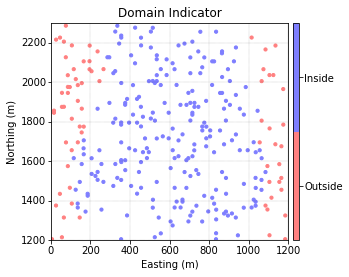

In [33]:
gs.locmap(dat); ## data is absolutely required here

## 3. Calculate and Model the Indicator Variogram

The indicator variogram is calculated and modeled, since this is required input to calculation of the Gaussian variogram model in the next section (used for distance function $df$ modeling).

### Apply the variogram object for convenience
Variogram calculation, modeling, plotting and checking are readily accomplished with the variogram object, although unprovided parameters are inferred.

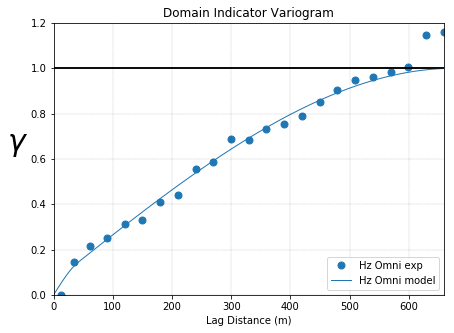

In [25]:
# Initialize the variogram object, var_ind stores the parameters
varg_ind = gs.Variogram(dat, dat.cat, variostd=True, mute=True, 
                        ndim=2, ndir=1, omnihz=True) ## could also do datafl=dat, var=dat.cat, 2 dimentions, omnidirectional variogram=1

# Set required parameters before calculating the experimental 
#variogram
varg_ind.update_calcpars(nlags=22, lagdist=30, lagtol=20, 
                         azm=0, azmtol=90, bandhorz=1.0e21)
varg_ind.varcalc() #executing the function

# Set required parameters before modeling the variogram
varg_ind.update_modelpars(c0=0.0, it=1, nst=2) #it type of nested structure, nst 2 - number of structures
varg_ind.fitmodel(maxiter=2500, sill=1.0)

# Plot the variogram
gs.gsParams['plotting.varplt.ms'] = 7 # 7 is marker size
fig = varg_ind.plot(model=True, titles=dat.cat+' Variogram', 
                    figsize=(7, 5))

### Check details of the variogram object and parameters
This cell is not required, but included for explanation of the Variogram object and inferred parameters.

In [56]:
dir(varg_ind) #if we need to see all functions

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 'addgriddef',
 'addsimdatfl',
 'calcpars',
 'datafl',
 'directions',
 'expvargs',
 'fitmodel',
 'fitparsfromdict',
 'inferdirections',
 'init_from_file',
 'legacyout',
 'major',
 'majorexp',
 'majorsim',
 'minor',
 'minorexp',
 'minorsim',
 'model',
 'modelpars',
 'mute',
 'ndim',
 'ndir',
 'omni3d',
 'omnihz',
 'plot',
 'printpars',
 'setdirections',
 'settols',
 'simavgexp',
 'simdatfl',
 'simexp',
 'simpars',
 'update_calcpars',
 'update_modelpars',
 'update_simpars',
 'validcalcpars',
 'validdirection',
 'varcalc',
 'varsim',
 'vert',
 'vertexp',
 'vertsim']

In [57]:
# Print the applied and inferred parameters that were used in the calculation
print('\nExperimental calculation parameters:')
for key, val in varg_ind.calcpars.items():
    print(key+' = ', val)

# Print the first few rows of the experimental variograms table
print('\n Experimental variogram:\n', varg_ind.expvargs[0].head(20)) #number inside head shows number of rows

# Print Variogram Model
print('\n Indicator Variogram Model: {}\n'.format(varg_ind.model))


Experimental calculation parameters:
variotypes =  1
variotails =  Domain Indicator
varioheads =  Domain Indicator
azm =  [0.0]
dip =  [0.0]
tilt =  [0.0]
azmtol =  [90]
diptol =  [90]
nlags =  [22]
lagdist =  [30]
lagtol =  [20]
bandhorz =  [1e+21]
bandvert =  [1e+21]
variostd =  True
variosills =  None
strict =  True
variocutcat =  None
ang1 =  0.0
ang2 =  0
ang3 =  0

 Experimental variogram:
     azimuth  dip           h  numpairs     vario
0       0.0  0.0   13.031277        54  0.000000
1       0.0  0.0   34.568265       502  0.143677
2       0.0  0.0   61.039934      1035  0.214421
3       0.0  0.0   90.202240      1631  0.251724
4       0.0  0.0  120.518400      1991  0.312100
5       0.0  0.0  149.784048      2356  0.329685
6       0.0  0.0  180.247872      2830  0.411699
7       0.0  0.0  209.873193      3178  0.439940
8       0.0  0.0  240.267998      3514  0.553392
9       0.0  0.0  269.257819      3775  0.585677
10      0.0  0.0  300.068493      4094  0.686402
11      0.0

## 4. Calculate and model the Gaussian Variogram

The Gaussian variogram that yields the indicator variogram after truncation of a Gaussian random field is calculated. This Gaussian variogram is modeled and input to $df$ modeing. 

#### Proportion calculation
The proportion is required input to bigaus2 below along with the indicator variogram.

In [27]:
proportion = sum(dat['Domain Indicator'])/len(dat)
print('Proportion of inside data: %.3f'%(proportion))

Proportion of inside data: 0.764


#### Calculate the Gaussian variogram
The bigaus2 program applies the Gaussian integration method, given the indicator variogram and the proportion of the indicator.

In [28]:
bigaus2 = gs.Program(program=exedir+'bigaus2')

C:\Users\serge\CCG\PRM_course_May2018\CCG_PRM_Course\03-ModelWorkflow\01-Boundary\tmp4r4mvub2\bigaus2.par has been copied to the clipboard


In [29]:
parstr = """                  Parameters for BIGAUS2
                                  **********************

START OF PARAMETERS:
1                                 -input mode (1) model or (2) variogram file
nofile.out                        -file for input variogram
{proportion}                      -threshold/proportion
2                                 -calculation mode (1) NS->Ind or (2) Ind->NS
{outfl}                           -file for output of variograms
1                                 -number of thresholds
{proportion}                      -threshold cdf values
1   {nlag}                        -number of directions and lags
{major}   0.0   {lag}             -azm(1), dip(1), lag(1)
{varstr}
"""
pars = dict(proportion=proportion, major=varg_ind.major[0],
            lag=varg_ind.calcpars['lagdist'][0],
            nlag=varg_ind.calcpars['nlags'][0],
            outfl=outdir+'bigaus2.out',
            varstr=varg_ind.model)
bigaus2.run(parstr=parstr.format(**pars), nogetarg=True)

Calling:  ['../exes/bigaus2', 'temp']

 BIGAUS2 Version: 2.200

 Which parameter file do you want to use?
  input mode =            1
  input file = nofile.out                              
  threshold probability =   0.7641196    
  calculation mode =            2
  output file = Output/bigaus2.out                      
  number of cutoffs =            1
  cutoffs =   0.7641196    
  ndir,nlag =            1          22
  azm, dip, lag =   0.0000000E+00  0.0000000E+00   30.00000    
  x,y,z offsets =   0.0000000E+00   30.00000      0.0000000E+00
  nst, c0 =            2  0.0000000E+00
  it,cc,ang[1,2,3] =             1  5.7094198E-02  0.0000000E+00  0.0000000E+00
  0.0000000E+00
  a1 a2 a3 =    41.52386       41.5238589409626        41.5238589409626     
  it,cc,ang[1,2,3] =             1  0.9429058      0.0000000E+00  0.0000000E+00
  0.0000000E+00
  a1 a2 a3 =    676.1333       676.133285848983        676.133285848983     

 BIGAUS2 Version: 2.200 Finished




### Data manipulation to handle an odd data format
The bigaus2 program outputs an odd (legacyish) variogram format, which must be translated to the standard Variogram format.

In [30]:
# Read in the data before demonstrating its present form
expvargs = gs.readvarg(outdir+'bigaus2.out', 'all')
expvargs.head()

,Number,Distance,Value,Points,Head,Tail
0,1,0.0,0.000,1000,1.00000,0.00000
1,2,30.0,0.014,1000,0.98607,0.01393
2,3,60.0,0.036,1000,0.96434,0.03566
3,4,90.0,0.064,1000,0.93612,0.06388
4,5,120.0,0.100,1000,0.90036,0.09964


In [31]:
# Add requisite fields
expvargs['azimuth']=0 #adding fields
expvargs['dip'] = 0

# Rename existing fields to the standard fields (dataframe)
expvargs.rename({'Value':'vario', 'Distance':'h', 'Points':'numpairs'})

# Drop the extraneous fields
expvargs.drop(['Head', 'Tail'])

# Demonstrate the present and required form
expvargs.head()

,Number,h,vario,numpairs,azimuth,dip
0,1,0.0,0.000,1000,0,0
1,2,30.0,0.014,1000,0,0
2,3,60.0,0.036,1000,0,0
3,4,90.0,0.064,1000,0,0
4,5,120.0,0.100,1000,0,0


### Gaussian variogram modeling
This model is input to distance function estimation.


 Gaussian Variogram Model: 2    0.010000000              -  nst, nugget effect
3    0.063603120   20.0   0.0   0.0   - it,cc,ang1,ang2,ang3
       702.479747558056    702.479747558056    702.479747558056       - a_hmax, a_hmin, a_vert
3    0.926396880   20.0   0.0   0.0   - it,cc,ang1,ang2,ang3
       732.6035271495072    732.6035271495072    732.6035271495072       - a_hmax, a_hmin, a_vert



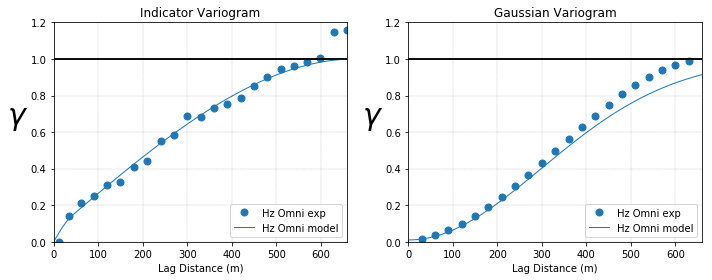

In [32]:
# Initialize the variogram Object
varg_gaus = gs.Variogram(variostd=True, mute=True, ndim=2, ndir=1, omnihz=True)

# Assign some calculation parameters, although they are only correspond 
# with the previously calculated expvargs in this case (rather than being used 
# in the calculation)
varg_gaus.update_calcpars(nlags=22, lagdist=30, azm=20)
varg_gaus.majorexp = expvargs.data

# Set required parameters before modeling the variogram
varg_gaus.update_modelpars(c0=0.01, it=[3,3], nst=2, ang2=[[0,0],[0,0]], 
                           ang3=[[0,0],[0,0]])
varg_gaus.fitmodel(maxiter=2500, sill=1.0) # fitting the model

# Print the variogram model
print('\n Gaussian Variogram Model: {}\n'.format(varg_gaus.model))

# Plot the indicator and Gaussian variogram
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
for varg, ax, title in zip([varg_ind, varg_gaus], axes, 
                           ['Indicator Variogram', 'Gaussian Variogram']):
    fig = varg.plot(model=True, titles=title, axes=ax)
fig.tight_layout()

## 5. Distance Function $df$ Modeling

The $df$ is calculated at the data locations, before being estimated at the grid locations. The $c$ parameter is applied to the $df$ calculation, defining the bandwidth of uncertainty that will be simulated in the next section.

### Determine the $c$ parameter
Normally the optimal $c$ would be calculated using a jackknife study, but it is simply provided here.

In [33]:
selected_c = 50

### Calculate the $df$ at the data locations

In [34]:
dfcalc = gs.Program(program=exedir+'dfcalc') # calculate distance function at the data locations

# Print the columns for populating the parameter file without variables
print(dat.columns)

C:\Users\serge\CCG\PRM_course_May2018\CCG_PRM_Course\03-ModelWorkflow\01-Boundary\tmpd1x2mo1f\dfcalc.par has been copied to the clipboard
Index(['HoleID', 'X', 'Y', 'Domain Indicator'], dtype='object')


In [35]:
parstr = """            Parameters for DFCalc
                           *********************
 
START OF PARAMETERS:
{datafl}                -file with input data
1 2 3 0 4               -column for DH,X,Y,Z,Ind
1                       -in code: indicator for inside domain
0.0  0.0  0.0           -angles for anisotropy ellipsoid
1.0  1.0                -first and second anisotropy ratios (typically <=1)
0                       -proportion of drillholes to remove
696969                  -random number seed
{c}                     -C
{outfl}                 -file for distance function output
'nofile.out'            -file for excluded drillholes output
"""
pars = dict(datafl=dat.flname, c=selected_c,
            outfl=outdir+'df_calc.out')
dfcalc.run(parstr=parstr.format(**pars))

Calling:  ['../exes/dfcalc', 'temp']

 DFCalc Version: 1.001

  data file = ../data/PRM_Boundary.dat                
  columns =            1           2           3           0           4
  in code =            1
  anisotropy angles =   0.000000000000000E+000  0.000000000000000E+000
  0.000000000000000E+000
  anisotropy ratios =    1.00000000000000        1.00000000000000     
  proportion to exclude =   0.0000000E+00
  random number seed =       696969
  C =    50.00000    
  data file = Output/df_calc.out                      
  data file = 'nofile.out'                            
 
  Storing
 
  Calculating DF

 DFCalc Version: 1.001



### Manipulate the $df$ data before plotting
A standard naming convention of the distance function variable is used for convenience in the workflow, motivating the manipulation.

In [36]:
# Load the data and note the abbreviated name of the distance function
dat_df = gs.DataFile(outdir+'df_calc.out', notvariables='Ind', griddef=griddef)
print('Initial distance Function variable name = ', dat_df.variables)

# Set a standard distance function name
dfvar = 'Distance Function'
dat_df.rename({dat_df.variables:dfvar}) #renaming, this is the dictionary
print('Distance Function variable name = ', dat_df.variables)

Initial distance Function variable name =  DF
Distance Function variable name =  Distance Function


In [37]:
dat_df.shape

(301, 6)

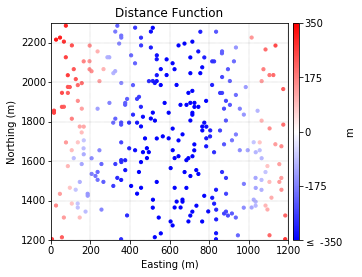

In [38]:
# Set symmetric color limits for the distance function
df_vlim = (-350, 350)
gs.locmap(dat_df, vlim=df_vlim, cbar_label='m')

### Estimate the $df$ across the grid
Kriging is performed with a large number of data to provide a smooth  and conditionally unbiased estimate. Global kriging would also be appropriate.

In [39]:
kd3dn = gs.Program(program=exedir+'kt3dn')

C:\Users\serge\CCG\PRM_course_May2018\CCG_PRM_Course\03-ModelWorkflow\01-Boundary\tmpn5oyv3oj\kt3dn.par has been copied to the clipboard


In [40]:
parstr = """                 Parameters for KT3DN
                               ********************
START OF PARAMETERS:
{input_file}                     -file with data
1  2  3  0  6  0                 -  columns for DH,X,Y,Z,var,sec var
-998.0    1.0e21                 -  trimming limits
0                                -option: 0=grid, 1=cross, 2=jackknife
xvk.dat                          -file with jackknife data
1   2   0    3    0              -   columns for X,Y,Z,vr and sec var
nofile.out                       -data spacing analysis output file (see note)
0    15.0                        -  number to search (0 for no dataspacing analysis, rec. 10 or 20) and composite length
0    100   0                     -debugging level: 0,3,5,10; max data for GSKV;output total weight of each data?(0=no,1=yes)
{out_sum}                        -file for debugging output (see note)
{out_grid}                       -file for kriged output (see GSB note)
{gridstr}
1    1      1                    -x,y and z block discretization
1 100   100    1                 -min, max data for kriging,upper max for ASO,ASO incr
0      0                         -max per octant, max per drillhole (0-> not used)
700.0 700.0  500.0               -maximum search radii
 0.0   0.0   0.0                 -angles for search ellipsoid
1                                -0=SK,1=OK,2=LVM(resid),3=LVM((1-w)*m(u))),4=colo,5=exdrift,6=ICCK
0.0  0.6  0.8 1.6                -  mean (if 0,4,5,6), corr. (if 4 or 6), var. reduction factor (if 4)
0 0 0 0 0 0 0 0 0                -drift: x,y,z,xx,yy,zz,xy,xz,zy
0                                -0, variable; 1, estimate trend
extdrift.out                     -gridded file with drift/mean
4                                -  column number in gridded file
keyout.out                       -gridded file with keyout (see note)
0    1                           -  column (0 if no keyout) and value to keep
{varmodelstr}
"""
pars = dict(input_file=outdir+'df_calc.out', 
            out_grid=outdir+'kt3dn_df.gsb',
            out_sum=outdir+'kt3dn_sum.out',
            gridstr=griddef, varmodelstr=varg_gaus.model)
kd3dn.run(parstr=parstr.format(**pars))

Calling:  ['../exes/kt3dn', 'temp']

 KT3DN Version: 7.330

  data file = Output/df_calc.out                      
  columns =            1           2           3           0           6
           0
  trimming limits =   -998.000000000000       1.000000000000000E+021
  kriging option =            0
  jackknife data file = xvk.dat                                 
  columns =            1           2           0           3           0
  data spacing analysis output file = nofile.out                              
  debugging level =            0
  debugging file = Output/kt3dn_sum.out                    
  GSB-style output file = Output/kt3dn_df.gsb                     
  nx, xmn, xsiz =          120   5.00000000000000        10.0000000000000     
  ny, ymn, ysiz =          110   1205.00000000000        10.0000000000000     
  nz, zmn, zsiz =            1  0.500000000000000        1.00000000000000     
  block discretization:           1           1           1
  ndmin,ndmax =         

### Manipulate and plot the $df$ estimate
pixelplt selects pointvar as the color of the overlain dat_df point data since its name matches the column name of est_df.

In [41]:
est_df = gs.DataFile(flname=outdir+'kt3dn_df.gsb')

# Drop the variance since we won't be using it, 
# allowing for specification of the column to be avoided 
est_df.drop('EstimateVariance')

# Rename to the standard distance function name for convenience
est_df.rename({est_df.variables:dfvar})
est_df.describe()

count    13200.000000
mean      -151.081923
std        233.073313
min       -516.495850
25%       -345.027885
50%       -203.715843
75%         70.421738
max        329.421814
Name: Distance Function, dtype: float64

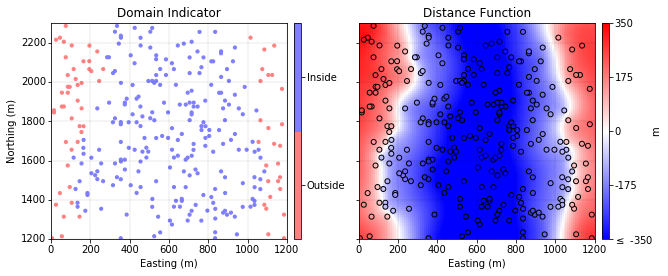

In [42]:
# Generate a figure object
fig, axes = gs.subplots(1, 2, figsize=(10, 8),cbar_mode='each', 
                        axes_pad=0.8,  cbar_pad=0.1)

# Location map of indicator data for comparison
gs.locmap(dat, ax=axes[0])

# Map of distance function data and estimate
gs.pixelplt(est_df, pointdata=dat_df, 
            pointkws={'edgecolors':'k', 's':25},
            cbar_label='m', vlim=df_vlim, ax=axes[1])

## 6. Boundary Simulation

This section is subdivided into 4 sub-sections:
1. Simulate an unconditional but spatially correlated Gaussian deviate using SGSIM
2. Transform this Gaussian deviate into $df$ deviates with a range of  $[−C, C]$
3. Add the $df$ deviates to the $df$ estimate, yielding a $df$ realization
4. Truncate the realization at  $df=0$ , generating a realization of the domain indicator 

### Generate a keyout for focusing simulation
Simulation will generate distance function deviates in the $[-C, C]$ range, which are then added to the $df$ estimate before thresholding at $df=0$. Therefore, any estimates with $df<-c$ are certainly within the boundary (and vice versa) and so, do not need to have their $df$ deviates simulated.

A keyout is therefore generated, which amounts to an indicator where $I=0$ are not simulated and $I=1$ are simulated. Based on the description above $I=1$ when the $df$ estimate is in the $[-C, C]$ range; $I=0$ otherwise.

806 values in, 12394 values out


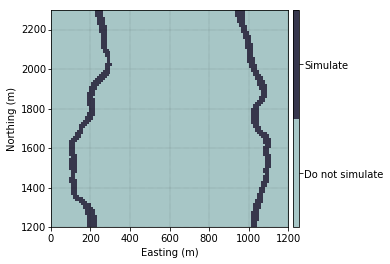

In [43]:
import copy
# Copy the data file
keyout = copy.deepcopy(est_df)

# Initialize a keyout column with 0s (outside)
keyvar = 'Keyout'
keyout[keyvar] = 0

# Generate an index that is true when df <= selected_c
idx = abs(keyout[dfvar]) <= selected_c
print('{} values in, {} values out'.format(sum(idx), griddef.count()-sum(idx)))

# The keyout is 1 when the idx is true
# This function must be applied to the DataFrame
keyout.data.loc[idx, keyvar] = 1

# Drop the distance function
keyout.drop(dfvar)

# Write out
keyout.writefile(outdir+'keyout.gsb')

# Plot
gs.pixelplt(keyout, cmap='bone_r', catdict={0:'Do not simulate', 1:'Simulate'})

### Simulate the Unconditional Gaussian Deviates

A notably subjective parameter here is the input variogram model, which does not need to match the variogram model used for calculation of the $df$. Its derivation is unclear, but followed visual evaluation of the results ($5 \cdot c$)

In [44]:
simdir = outdir+'USGSIM/'
gs.mkdir(simdir)
usgsim = gs.Program(program=exedir+'usgsim')

C:\Users\serge\CCG\PRM_course_May2018\CCG_PRM_Course\03-ModelWorkflow\01-Boundary\tmprludydol\usgsim.par has been copied to the clipboard


In [45]:
varg_h = selected_c*5

parstr = """               Parameters for USGSIM
                              *********************

START OF MAIN:
1                             -number of realizations to generate, 0=kriging
1                             -number of variables being simulated
1                             -number of rock types to consider
{seed}                        -random number seed
{gridstr}
{outfl}                       -file for simulation output
2                             -  output format: (0=reg, 1=coord, 2=binary)
impute.out                    -file for imputed values in case of heterotopic samples
1                             -debugging level: 0,1,2,3
{dbgfile}                     -file for debugging output 

START OF SRCH:
40                            -number of data to use per variable
{varg_h}  {varg_h}   10.0     -maximum search radii (hmax,hmin,vert)
0.0    0.0    0.0             -angles for search ellipsoid
1                             -sort by distance (0) or covariance (1)
1 1 1                         -if sorting by covariance, indicate variogram rock type, head, tail to use

START OF VARG:
1                             -number of variograms
1  1  1                       -rock type, variable 1, variable 2
1    0.001                    -  number of structures, nugget effect
3    0.999 0.0   0.0   0.0    -  type,variance,ang1,ang2,ang3
 {varg_h}  {varg_h}  50.0     -  a_hmax, a_hmin, a_vert
         
START OF ROCK:
1                             -rock type codes # you might put in your simulated categories
{keyfl}                       -file with rock types
1                             -column for rock type
"""
# Setup parameters in advance of parallel simulation of 
# each realization, beginning with a dictionary
# parameters that do not vary
pars = dict(gridstr=griddef, varg_h=varg_h, keyfl=outdir+'keyout.gsb')

# Call pars will be a list of parameters that are applied in parallel
callpars = []

# Random number seeds are initialized with a seed
seeds = gs.rseed_list(nreal, seed=23243)

# Iterate over the realizations, generating a list of
# associated parameter files
for i, seed in enumerate(seeds):
    # parameters that vary by realization
    pars['seed'] = seed
    pars['outfl'] = simdir+'real{}.gsb'.format(i+1)
    pars['dbgfile'] =simdir+'real{}.dbg'.format(i+1)

    # The parstr is formatted by this iteration of pars,
    # which is then appended to the callpars list
    callpars.append(dict(parstr=parstr.format(**pars)))

# Simulate in parallel
gs.runparallel(usgsim, callpars, reportprogress=True) #executes all 20 parameter files and executes 20 realizations, executes 4 processes

Creating parallel processes


VBox(children=(HTML(value=''), IntProgress(value=0, max=20)))

Pool assembled, asynchronously processing
Asynchronous execution finished.


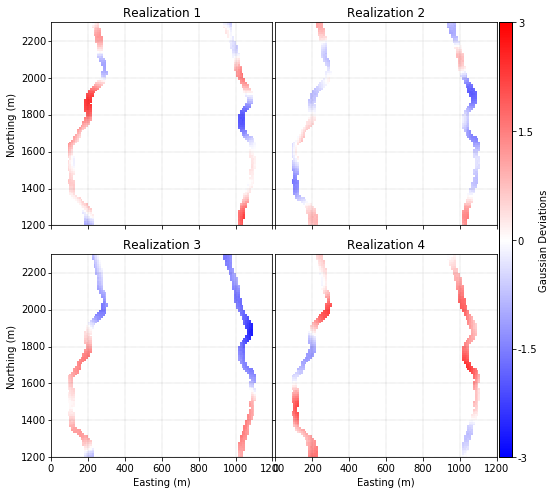

In [46]:
# Generate a figure for the variable realizations
fig, axes = gs.subplots(2, 2, figsize=(10, 8), cbar_mode='single')
# Iterate over the realizations
for real, ax in enumerate(axes):
    sim = gs.DataFile(simdir+'real{}.gsb'.format(real+1))
    gs.pixelplt(sim, title='Realization {}'.format(real+1),
                cbar_label='Gaussian Deviations', ax=ax, vlim=(-3, 3))

### Transform the Gaussian realizations into boundary realizations
See the section description for additional details.

In [47]:
# Required package for this calculation
from scipy.stats import norm

# Create a directory for the output
domaindir = 'Domains/'
gs.mkdir(domaindir)

# Generate logical numpy index array that identifies the locations
# where simulation has occured
idx = keyout[keyvar].values == 1

for real in range(nreal):
    # Load the simulated Gaussian deviates and convert to a 
    #flat numpy array
    sim = gs.DataFile(simdir+'real{}.gsb'.format(real+1))
    sim = sim.data.values.flatten()
    
    # Transform the Gaussian deviates to probabilities
    sim = norm.cdf(sim[idx], loc=0.0, scale=1.0)
    
    # Transform the probabilities to distance function deviates
    sim = 2 *selected_c * sim - selected_c #converted gaussian diviates to be the deviates of the distance functio

    # Initialize the final realization as the distance function estimate
    df = est_df[dfvar].values

    # Add the distance function deviates to the distance function estimate,
    # yielding a distance function realization
    df[idx] = df[idx] + sim

    # If the distance function is greater than 0, the simulated indicator is 1
    sim = (df <= 0).astype(int)

    # Convert the Numpy array to a Pandas DataFrame, which is required 
    # for initializing a DataFile (aside from the demonstrated flname approach).
    # The DataFile is then written out
    sim = pd.DataFrame(data=sim, columns=[dat.cat])
    sim = gs.DataFile(data=sim)
    sim.writefile(domaindir+'real{}.gsb'.format(real+1))

### Plot the realizations

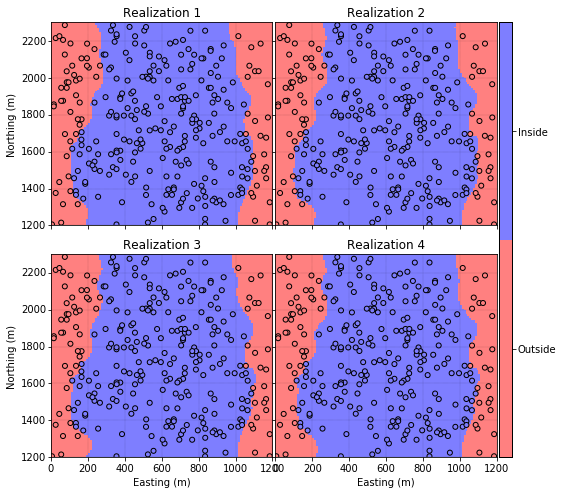

In [48]:
fig, axes = gs.subplots(2, 2, figsize=(10, 8), cbar_mode='single')
for real, ax in enumerate(axes):
    sim = gs.DataFile(domaindir+'real{}.gsb'.format(real+1))
    gs.pixelplt(sim, title='Realization {}'.format(real+1), 
                pointdata=dat, 
                pointkws={'edgecolors':'k', 's':25},
                vlim=(0, 1), ax=ax)

## 7. Save project settings and clean the output directory

In [49]:
gs.gsParams.save('gsParams.txt')
gs.rmdir(outdir)
gs.rmfile('temp')

# Structural Modeling

The following notebook is comprised of 9 primary steps:

1. Initialize required packages, directories and parameters 
2. Load and inspect the surface data
3. Decluster and normal score transform
4. Variogram calculation and modeling
5. Simulation and back-transformation
6. Simulation checking 
7. Base surface calculation
8. 3-D grid and keyout calculation
9. Save project setting and clean the output files

## 1. Initialize required packages and parameters

In [1]:
import pygeostat as gs
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
% matplotlib inline

### Load project settings and modify where required
Load the Matplotlib and Pygeostat project defaults.

In [2]:
gs.gsPlotStyle.load('../00-Introduction/gsParams.txt')
gs.gsParams.load('../01-Boundary/gsParams.txt')

Assign the number of realization and griddef to variables for convenience.

In [3]:
nreal = gs.gsParams['data.nreal']
print('nreal = {}'.format(nreal))
griddef = gs.gsParams['data.griddef']
griddef

nreal = 20


Pygeostat GridDef:
120 5.0 10.0 
110 1205.0 10.0 
1 0.5 1.0

The cmap was set to bwr in the previous section - reset to the 
Matplotlib default

In [4]:
gs.gsParams['plotting.cmap'] = 'viridis'

### Directories and files

In [5]:
# Path to the CCG executables
exedir = '../exes/'

# Domain realizations for keyout
domaindir = '../01-Boundary/Domains/'

# create the output directory
outdir = 'Output/'
gs.mkdir(outdir)

## 2. Load and inspect the surface data

### Load the data and note its attributes

In [6]:
dat = gs.DataFile('../data/PRM_Surface.dat')
print('columns = {}'.format(dat.columns.values))
print('x column = {}, y column = {}'.format(dat.x, dat.y))

columns = ['HoleID' 'X' 'Y' 'Top Elevation' 'Thickness' 'Base Elevation']
x column = X, y column = Y


### Summary statistics
The DataFile describe excludes special attributes.

In [7]:
dat.describe()

,Top Elevation,Thickness,Base Elevation
count,230.000000,230.000000,230.000000
mean,379.173739,50.096391,329.077348
std,2.607090,4.376842,4.571519
min,372.070000,37.730000,315.850000
25%,377.222500,47.502500,327.137500
50%,378.950000,49.390000,329.140000
75%,380.782500,51.900000,332.225000
max,386.330000,62.870000,340.870000


### Location map

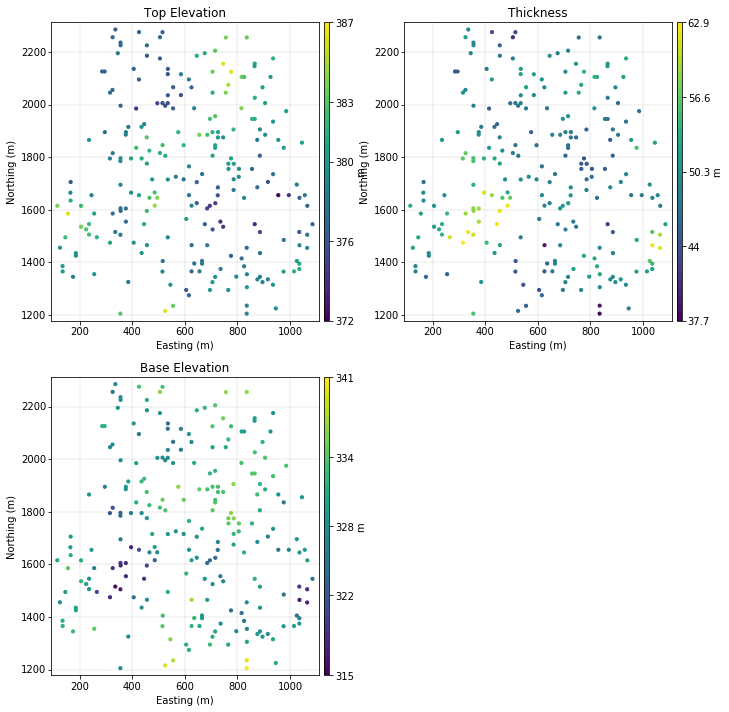

In [8]:
fig, axes = plt.subplots(2, 2, figsize=(10, 10))
axes = axes.flatten()
for var, ax in zip(dat.variables, axes):
    gs.locmap(dat, var=var, cbar_label='m', title=var, ax=ax)
# Remove the unneeded fourth axis
axes[-1].remove()
fig.tight_layout()

## 3. Decluster and Normal Score Transform

Declustering defines the spatially representative distribution of the Top Elevation and Thickness. These distributions are then used for the normal score transformation, generating conditioning data that is used for calculating normal score variograms and conditioning sequential Gaussian simulation.

Note that variograms are often calculated on data that are normal score transformed without declustering weights. Given the controversy of the subject, the more convenient method is selected for this course (since declustering with weights is absolutely required for conditioning).

### Decluster the data
All variables are homotopically sampled, so only one variable need be considered for declustering.


In [9]:
declus = gs.Program(program=exedir+'declus')

C:\Users\serge\CCG\PRM_course_May2018\CCG_PRM_Course\03-ModelWorkflow\02-Structural\tmps9g0p35c\declus.par has been copied to the clipboard


In [10]:
# Cell size based on the data spacing study in the intro notebook
cellsize=90

parstr = """   Parameters for DECLUS
                  *********************

START OF PARAMETERS:
{datafl}                 -file with data
{xycol}   0   {varcol}   -  columns for X, Y, Z, and variable
-1.0e21     1.0e21       -  trimming limits
junk.out                 -file for summary output
{outfl}                  -file for output with data & weights
1.0   1.0                   -Y and Z cell anisotropy (Ysize=size*Yanis)
0                           -0=look for minimum declustered mean (1=max)
1  {cellsize}  {cellsize}               -number of cell sizes, min size, max size
5                           -number of origin offsets
"""
pars = dict(datafl=dat.flname, xycol=dat.gscol(dat.xyz),
            varcol=dat.gscol('Top Elevation'),
            outfl=outdir+'declus.out', cellsize=cellsize)
declus.run(parstr=parstr.format(**pars))
gs.rmfile('junk.out')

Calling:  ['../exes/declus', 'temp']

DECLUS Version: 3.000

 data file = ../data/PRM_Surface.dat                 
 columns =            2           3           0           4
 tmin,tmax =    -1.000000E+21    1.000000E+21
 summary file = junk.out                                
 output file = Output/declus.out                       
 anisotropy =         1.000000        1.000000
 minmax flag =            0
 ncell min max =            1       90.000000       90.000000
 offsets =            5


There are      230 data with:
  mean value            =    379.17374
  minimum and maximum   =    372.07001   386.32999
  size of data vol in X =    970.03998
  size of data vol in Y =   1080.00000
  size of data vol in Z =      0.00000

  declustered mean      =    379.24036
  min and max weight    =      0.42091     2.19493
  equal weighting       =      1.00000


DECLUS Version: 3.000 Finished

Stop - Program terminated.


### Load and inspect the declustering results

In the context of the upcoming modeling steps, Base Elevation is not considered a variable. Use of the notvariables kwarg on initialization excludes it from the variables attribute.

In [12]:
dat = gs.DataFile('Output/declus.out', notvariables='Base Elevation')
print('declustering weight = ', dat.wts)
print('variables = ', dat.variables)

declustering weight =  Declustering Weight
variables =  ['Top Elevation', 'Thickness']


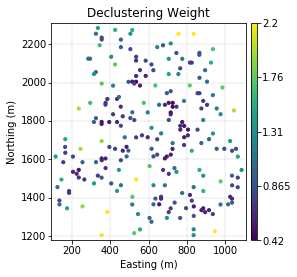

In [13]:
gs.locmap(dat, var=dat.wts)

### Normal score transform

In [14]:
unscore = gs.Program(program=exedir+'unscore')

C:\Users\serge\CCG\PRM_course_May2018\CCG_PRM_Course\03-ModelWorkflow\02-Structural\tmpp5mrmvx5\unscore.par has been copied to the clipboard


In [15]:
parstr = """   Parameters for NSCORE
                  *********************

START OF PARAMETERS:
{datafl}                  -file with data
{nvar} {varcols}          -  number of variables and columns        #nscoring both variables simultaniously
{wtcol}                   -  column for weight, 0 if none           #declustering weights
0                         -  column for category, 0 if none
0                         -  number of records if known, 0 if unknown
-1.0e21   1.0e21          -  trimming limits
0                         -transform using a reference distribution, 1=yes
../histsmth/histsmth.out  -file with reference distribution.
1   2   0                 -columns for variable, weight, and category
1000                       -maximum number of quantiles, 0 for all
{outfl}                   -file for output
{trnfl}                   -file for output transformation table
"""
pars = dict(datafl=dat.flname, nvar=dat.nvar,
            varcols=dat.gscol(dat.variables),
            wtcol=dat.gscol(dat.wts),
            outfl = outdir+'nscore.out', trnfl = outdir+'nscore.trn')
unscore.run(parstr=parstr.format(**pars))

Calling:  ['../exes/unscore', 'temp']
 UNSCORE Version: 1.1.1
 data file = Output/declus.out
  columns =            4           5           7           0
  number of records =            0
  trimming limits =  -1.000000000000000E+021  1.000000000000000E+021
  consider a different reference dist =            0
  file with reference distribution = ../histsmth/histsmth.out                
  columns =            1           2           0
  maximum number of quantiles =         1000
  file for output = Output/nscore.out
  file for transformation table = Output/nscore.trn
 Determining size of Output/declus.out
 Reading Output/declus.out
 Building transform table   1 category   1
 Building transform table   2 category   1
 Computing normal scores    1 category   1
 Computing normal scores    2 category   1
 Generating output file
 Total execution time 0.030 seconds.

 UNSCORE Version: 1.1.1 Finished



### Load and inspect the normal score transformation result

Use the notvariables kwarg leads to isolation of the normal score variables as the dat_ns.variables attribute. Since DataFiles with iniitialized wts are passed to histplt, wt may be True.

In [16]:
dat_ns = gs.DataFile(outdir+'nscore.out', 
                     notvariables=['Base Elevation']+dat.variables)
print('variables = ', dat_ns.variables)

variables =  ['NS_Top Elevation', 'NS_Thickness']


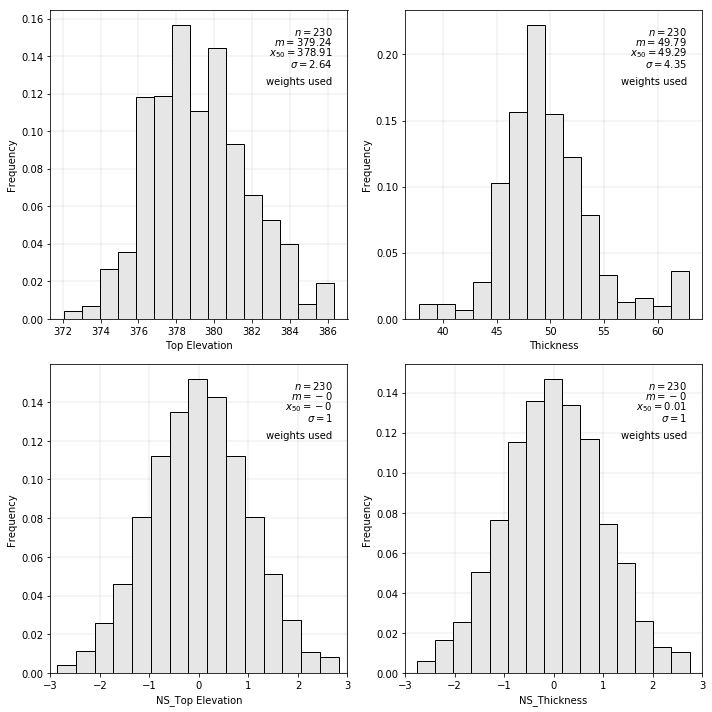

In [19]:
fig, axes = plt.subplots(2 , 2, figsize=(10, 10))
for var, ax in zip(dat.variables, axes[0]):
    gs.histplt(dat, var=var, wt=True, ax=ax, stat_blk='minimal')
for var, ax in zip(dat_ns.variables, axes[1]):
    gs.histplt(dat_ns, var, wt=True, ax=ax, 
               xlim=(-3, 3), stat_blk='minimal')  
fig.tight_layout()

## 4. Variogram Calculation and Modeling
Normal score variograms are calculated and modeled, before being input to sequential Gaussian simulation in the next section.

Please refer to the Boundary Modeling notebook for additional details about the Variogram object.

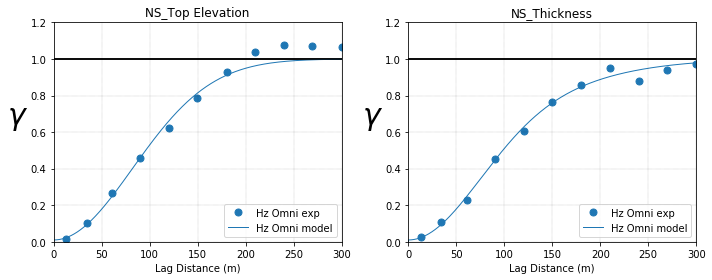

In [20]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Initialize a list that will store the variogram objects
vargs = []
for var, ax in zip(dat_ns.variables, axes):
    varg = gs.Variogram(dat_ns, var, ndim=2, ndir=1, omnihz=True, 
                        mute=True)
    
    # Variogram calculation
    varg.update_calcpars(nlags=10, lagdist=30.0, lagtol=20.0, azm=0, 
                         azmtol=90, bandhorz=10000, variostd=True)
    varg.varcalc()
    
    # Variogram modeling
    varg.update_modelpars(c0=0.01, it=[3, 3], nst=2)
    varg.fitmodel(maxiter=2500, sill=1.0)

    # Variogram plotting
    fig = varg.plot(model=True, titles=var, axes=ax, separate_plts=False)
    
    # Append in the list
    vargs.append(varg)
fig.tight_layout()

## 5. Simulation and Back-transformation
The Top Elevation and Thickness is simulated using sequential Gaussian simulation, before back-transforming to original units.

### Sequential Gaussian Simulation

In [21]:
simdir = outdir+'USGSIM/'
gs.mkdir(simdir)
usgsim = gs.Program(program=exedir+'usgsim')

C:\Users\serge\CCG\PRM_course_May2018\CCG_PRM_Course\03-ModelWorkflow\02-Structural\tmpglv7342h\usgsim.par has been copied to the clipboard


In [22]:
parstr = """               Parameters for USGSIM
                              *********************

START OF MAIN:
1                             -number of realizations to generate, 0=kriging
2                             -number of variables being simulated
0                             -number of rock types to consider
{seed}                        -random number seed                            #important as per Clayton!!!
{griddef}
{outfl}                       -file for simulation output
2                             -  output format: (0=reg, 1=coord, 2=binary)
impute.out                    -file for imputed values in case of heterotopic samples
0                             -debugging level: 0,1,2,3
sgsim.dbg                     -file for debugging output 

START OF SRCH:
25                            -number of data to use per variable
300 300   10                  -maximum search radii (hmax,hmin,vert)
0 0 0                         -angles for search ellipsoid
1                             -sort by distance (0) or covariance (1)
0 1 1                         -if sorting by covariance, indicate variogram rock type, head, tail to use

START OF VARG:
2                             -number of variograms
0  1  1                       -rock type, variable 1, variable 2
{varmodel1}
0  2  2                       -rock type, variable 1, variable 2
{varmodel2}

START OF DATA:
{datafl}                      -file with primary data
{xycols}  0  0  0             -  columns for X,Y,Z,wt,rock type
{varcols}                     -  columns for variables
1                             -  clip data to grid, 1=yes
1                             -  assign to the grid, 0=none, 1=nearest, 2=average
-8.0       1.0e21             -  trimming limits
"""
pars = dict(griddef=griddef, varmodel1=vargs[0].model,
            varmodel2=vargs[1].model, datafl=dat_ns.flname, 
            xycols=dat_ns.gscol(dat_ns.xyz), 
            varcols=dat_ns.gscol(dat_ns.variables))
callpars = []    #building a list of parameter files based on the acquired values
seeds = gs.rseed_list(nreal, seed=23243) # make this seed random
for i, seed in enumerate(seeds):  
    pars['seed'] = seed
    pars['outfl'] = simdir+'real{}.gsb'.format(i+1)
    callpars.append(dict(parstr=parstr.format(**pars)))  
gs.runparallel(usgsim, callpars, reportprogress=True)

Creating parallel processes


VBox(children=(HTML(value=''), IntProgress(value=0, max=20)))

Pool assembled, asynchronously processing
Asynchronous execution finished.


### Inspect a Gaussian realization
This step is not strictly required, but is presented for demonstration.

In [23]:
# Read in the simulation to inspect
sim = gs.DataFile(simdir+'real1.gsb')

# Rename the simulation columns
sim.columns=dat_ns.variables

# Summary statistics
print('\nProperties of the realization:\n', sim.describe())


Properties of the realization:
        NS_Top Elevation  NS_Thickness
count      13200.000000  13200.000000
mean           0.072127     -0.000995
std            0.979734      0.931799
min           -3.426607     -3.067519
25%           -0.542784     -0.580999
50%            0.136036     -0.028545
75%            0.678567      0.571991
max            2.912935      2.841111


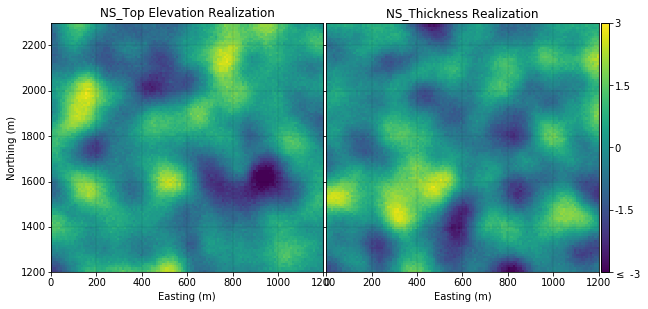

In [24]:
# The gs.subplots is useful when multiple panels are plotted that 
# should use the same colorbar
fig, axes = gs.subplots(1, 2, figsize=(10, 10), cbar_mode='single')
for var, ax in zip(dat_ns.variables, axes):
    gs.pixelplt(sim, var=var, vlim=(-3, 3), title=var+' Realization', ax=ax)

### Back-transformation
Note that ubacktr program only requires a prefix of the transformation table, before it infers the file name based on the number of variables and categories.

In [25]:
backdir = outdir+'UBACKTR/'
gs.mkdir(backdir)
ubacktr = gs.Program(program=exedir+'ubacktr')

C:\Users\serge\CCG\PRM_course_May2018\CCG_PRM_Course\03-ModelWorkflow\02-Structural\tmpfjfrnt38\ubacktr.par has been copied to the clipboard


In [26]:
parstr = """                  Parameters for UBACKTR
                  **********************
 
START OF PARAMETERS: 
{datafl}                    -file with simulated Gaussian variables (see Note6)
-7.0 1.0e21                 -  trimming limits
2                           -  number of variables
1 2                         -  columns for variables
0                           -number of rocktypes (NRT) (0 if none)
nofile.out                  -  file for simulated RTs (see Note1 and Note6)
5                           -  column for RT 
31 32 34 35 36 37           -  RT category codes (see Note2)
{nx} {ny} 1                 -nx, ny, nz (0=calculated)(see Note3)
1                           -number of realizations
{trnfl}                     -prefix for trans tables (see Note4 and Note7)
{outfl}                     -output file (see Note6)
"""
pars = dict(nx=griddef.nx, ny=griddef.ny, trnfl=outdir+'nscore')
callpars = []
for i in range(nreal):
    pars['datafl'] = simdir+'real{}.gsb'.format(i+1)
    pars['outfl'] = backdir+'real{}.gsb'.format(i+1)
    callpars.append(dict(parstr=parstr.format(**pars)))
gs.runparallel(ubacktr, callpars, reportprogress=True)

# Remove the Gaussian realizations since they're no longer needed
gs.rmdir(simdir)

Creating parallel processes


VBox(children=(HTML(value=''), IntProgress(value=0, max=20)))

Pool assembled, asynchronously processing
Asynchronous execution finished.


### Realization maps
Generate a figure for each variable, where a single color bar is used for multiple realizations.

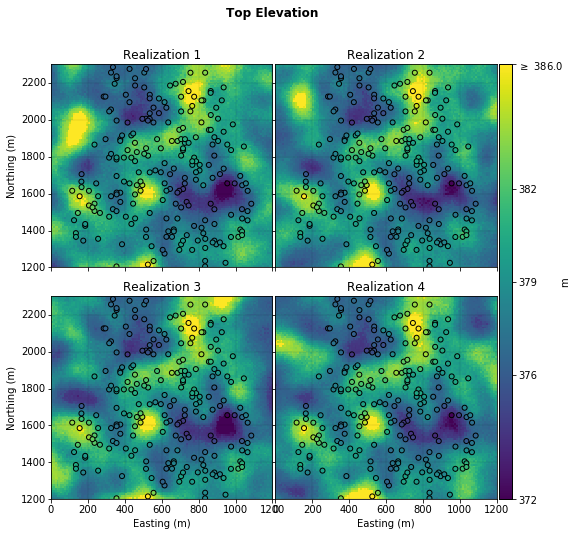

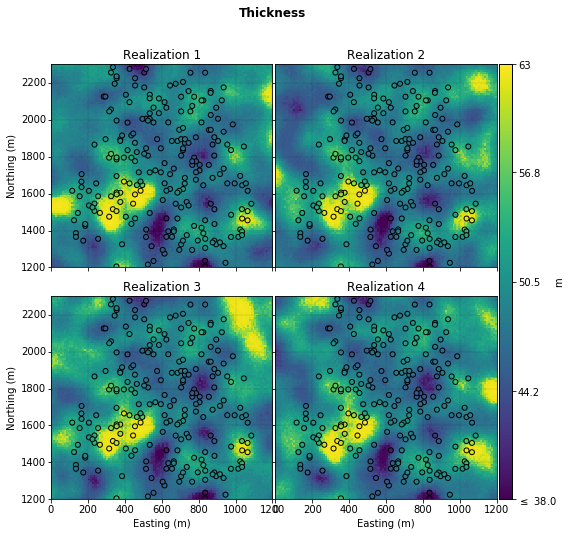

In [27]:
for var in dat.variables:
    fig, axes = gs.subplots(2, 2, figsize=(10, 8), cbar_mode='single')
    # Color limits based on the data
    vlim = (np.round(dat[var].min()), np.round(dat[var].max()))
    for real, ax in enumerate(axes):
        sim = gs.DataFile(backdir+'real{}.gsb'.format(real+1))
        sim.columns = dat.variables
        gs.pixelplt(sim, var=var, title='Realization {}'.format(real+1),
                    pointdata=dat, pointkws={'edgecolors':'k', 's':25},
                    vlim=vlim, cbar_label='m', ax=ax)

    # Label the figure
    fig.suptitle(var, **{'weight':'bold'})

## 6. Simulation Checking

Check that the realizations reproduce the histogram and variogram of the data.

### Histogram reproduction
Use of a '*' wildcard leads the histpltsim function to assume 1,...,nreal files are present.

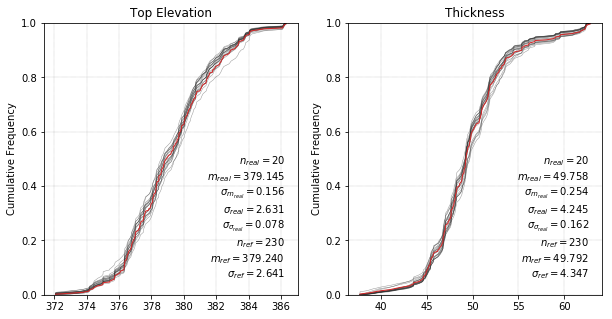

In [28]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
for i, (var, ax) in enumerate(zip(dat.variables, axes)):
    gs.histpltsim(backdir+'real*.gsb', dat, refvar=var, refwt=True, 
                  refclr='C3',
                  simvar=i+1, sim_fltype='gsb', title=var, ax=ax)

### Variogram reproduction

The variogram of the data in original units must be calculated first, since the normal score variogram was previously calculated.

In [29]:
# Calculate the experimental data variograms
vargs = []
for var, ax in zip(dat_ns.variables, axes):
    varg = gs.Variogram(dat_ns, var, ndim=2, ndir=1, omnihz=True, 
                        mute=True)
    varg.update_calcpars(nlags=10, lagdist=30.0, lagtol=20.0, azm=0, 
                         azmtol=90, bandhorz=10000, variostd=True)
    varg.varcalc()    
    vargs.append(varg)

In [30]:
# Calculate the variograms of the realizations
for i, varg in enumerate(gs.log_progress(vargs)):
    varg.update_simpars(datafl=backdir+'real*.gsb', nvar=1, 
                        varcols=i+1)
    varg.varsim(maxlags=50, vargrng=500) # use it to calculaate variogram for each single ralization, * iterates from 1 to the number of realizations

VBox(children=(HTML(value=''), IntProgress(value=0, max=2)))

Pool assembled, asynchronously processing
Asynchronous execution finished.
Pool assembled, asynchronously processing
Asynchronous execution finished.


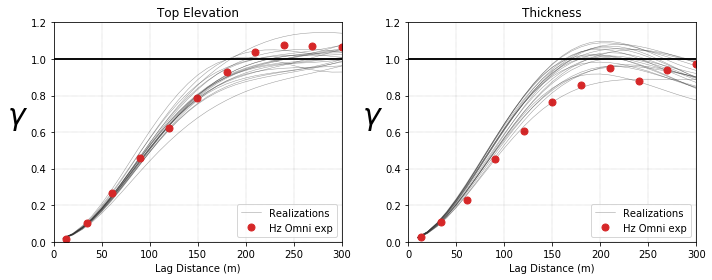

In [31]:
# Plot the variograms
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
for var, varg, ax in zip(dat.variables, vargs, axes):
    fig = varg.plot(sim=True, titles=var, colors=['C3'],
                    figsize=(8, 3), axes=ax)
fig.tight_layout() # when hystogram is well-behaved and simmetric, the variogram is gonna behave well too

## 7. Construct the Base Surface Realizations
Subtract the thickness from the top elevation, providing the base elevation realizations. Output all values within a single directory.

In [32]:
surfdir='Surfaces/'
gs.mkdir(surfdir)
for real in range(nreal):
    sim = gs.DataFile(backdir+'real{}.gsb'.format(real+1))
    sim.columns=['Top Elevation', 'Thickness']
    sim['Base Elevation'] = sim['Top Elevation'] - sim['Thickness']
    sim.writefile(surfdir+'real{}.gsb'.format(real+1))

Text(0.5,0.98,'Base Elevation')

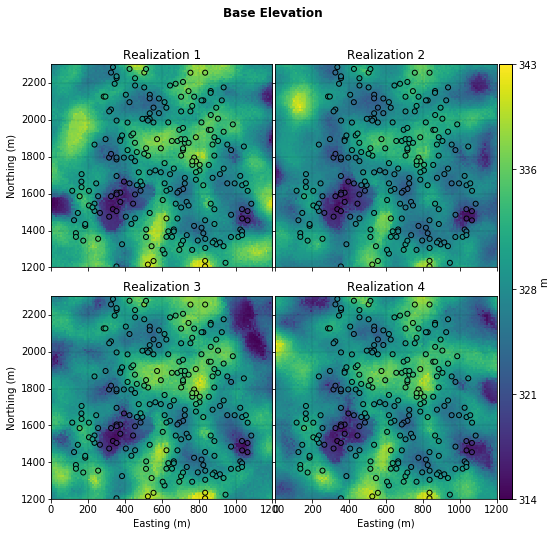

In [33]:
var = 'Base Elevation'
vlim = (np.round(dat[var].min()), np.round(dat[var].max()))
fig, axes = gs.subplots(2, 2, figsize=(10, 8), cbar_mode='single')
for real, ax in enumerate(axes):
    sim = gs.DataFile(surfdir+'real{}.gsb'.format(real+1))
    gs.pixelplt(sim, var=var, title='Realization {}'.format(real+1),
                pointdata=dat, pointkws={'edgecolors':'k', 's':25},
                cbar_label='m', ax=ax)
fig.suptitle(var, **{'weight':'bold'})

### VTK visualization of the top and base surfaces

Output coordinates will be in single precision 'float32' following the gsParams setting below (may be problematic with large utms). This is used here to conserve output file size.

When the DataFile is initialized, it is registered as a structured grid (dftype='sgrid') with specified z coordinates. 

Use of a vtk extension in writefile leads to VTK output, where x and y coordinates are assumed to follow the regular grid, whereas z follows irregular coordinates. Note that at least one coordinate must be irregular for sgrid to register as valid.

In [34]:
gs.gsParams['data.write_vtk.cdtype'] = 'float32'
for var in ['Base Elevation', 'Top Elevation']:
    sim = gs.DataFile(surfdir+'real1.gsb', z=var, dftype='sgrid')
    sim.writefile('{}_real1.vtk'.format(var), variables=[var])

## 8. Generate a 3-D Grid and Associated Keyout


### Determine the minimum and maximum vertical realization extents

The following cell generates lists of the minimum (minz) and maximum (maxz) vertical extents for each realization, before determining the vertical extents across all realizations.

In [35]:
minz = []
maxz = []
for real in range(nreal):
    surf = gs.DataFile(surfdir+'real{}.gsb'.format(real+1))
    minz.append(np.min(surf['Base Elevation']))
    maxz.append(np.max(surf['Top Elevation']))
minz = int(min(minz))
maxz = int(max(maxz)+1)
print('min and max z elevation = {}, {}'.format(minz, maxz))

min and max z elevation = 310, 387


### Convert the 2-D grid to a 3-D grid
Set the 3-D grid to the default for the remainder of this notebook (as well as subsequent notebooks).

In [36]:
gridarr = griddef.gridarray()
print('2-d grid array =', gridarr)

2-d grid array = (120, 5.0, 10.0, 110, 1205.0, 10.0, 1, 0.5, 1.0)


In [37]:
# Calculate the z grid attributes
zsiz = 1.0
nz = int(maxz - minz + 1)/zsiz
mnz = minz + zsiz/2.0

# Modify the grid array to reflect the above attributes
gridarr = gridarr[0:6]+(nz, mnz, zsiz)
print('3-d grid array =', gridarr)

# Initialize the 3-D grid, before setting as the default 
# going forward
griddef = gs.GridDef(gridarr=gridarr)
gs.gsParams['data.griddef'] = griddef
griddef

3-d grid array = (120, 5.0, 10.0, 110, 1205.0, 10.0, 78.0, 310.5, 1.0)


Pygeostat GridDef:
120 5.0 10.0 
110 1205.0 10.0 
78 310.5 1.0

### Calculate the keyout
Used for constraining subsequent modeling. Only locations that are within the domain (from the previous notebook) and between the top/bottom surfaces need to be simulated.

In [38]:
keydir = 'Keyouts/'
gs.mkdir(keydir)
# Will track the number of realizations that are in the domain
# for each grid node
prob = np.zeros(griddef.count())
for real in gs.log_progress(range(nreal)): # will go through the number of realizations 0,1,2,3...
    # Domain
    dom = gs.DataFile(domaindir+'real{}.gsb'.format(real+1))
    dom = dom.data.values == 1 #converting datafile into a numpy array, ==1 provides a logical array
    dom = dom.reshape((griddef.nx, griddef.ny), order='F')
    
    # Top and bottom surfaces
    surf = gs.DataFile(surfdir+'real{}.gsb'.format(real+1)) # holds both top and bottom surfaces
    top = surf['Top Elevation'].values
    top = top.reshape((griddef.nx, griddef.ny), order='F') # reshape top surface to the grid
    bot = surf['Base Elevation'].values
    bot = bot.reshape((griddef.nx, griddef.ny), order='F')

    # Generate the keyout for this realization
    keyout = np.zeros((griddef.nx, griddef.ny, griddef.nz)) #creating empty matrix
    for ix in range(griddef.nx): #iterates from ix=x to ix=nx
        for iy in range(griddef.ny):
            if dom[ix, iy]:
                # This vertical column is within the aerial domain
                # so proceed
                x, y, _ = griddef.gridcoord(ix, iy, 1)
                _, _, ibot, ingrid = griddef.coord_to_index3d(x, y,
                                                         bot[ix, iy])
                _, _, itop, ingrid = griddef.coord_to_index3d(x, y,
                                                         top[ix, iy])
                keyout[ix, iy, ibot:itop+1] = 1
    keyout = keyout.reshape(griddef.count(), order='F') # reshapes a 3d array
    prob = prob + keyout
    # Write out
    keyout = gs.DataFile(data=pd.DataFrame(keyout, columns=['Keyout']))
    keyout.writefile(keydir+'real{}.gsb'.format(real+1), fmt=[1])
# Calculate the probability to be within the domain
prob = prob / nreal  #if inside the domain, probability will have 20 assigned to it, so will have to devide by 20 to have 1

VBox(children=(HTML(value=''), IntProgress(value=0, max=20)))

### Generate a keyout for non-zero probability to be in the domain
Also, include locations where data are present. This will have a variety of utilities.

In [39]:
keyout = (prob > 0).astype(int)

# Find the indices where 3-D data are located
dat = gs.DataFile('../data/PRM_data.dat')
idx, ingrid = griddef.coord_to_index1d(dat[dat.x], dat[dat.y], dat[dat.z])

# Throw an error if there is data that is not within the grid
assert all(ingrid), print('not all data are in the grid!')

# Assign a keyout of 1
keyout[idx] = 1

# Write out
keyout = gs.DataFile(data=pd.DataFrame(keyout, columns=['Keyout']))
keyout.writefile(keydir+'allreals.gsb', fmt=[1], )

### VTK visualization
The domain probability is written as the efficient rectilinear grid type since keyout.dftype = 'grid'.

In [40]:
prob = gs.DataFile(data=pd.DataFrame(prob, columns=['Domain Probability']))
prob.writefile('domain_probability.vtk')

## 9. Cleaning Directories and Files

In [41]:
gs.gsParams.save('gsParams.txt')
gs.rmdir(outdir)
gs.rmfile('temp')

# Categorical Modeling

The following notebook is comprised of 13 primary steps:

1. Initialize required packages, directories and parameters 
2. Load and inspect the categorical data
3. Calculate the global and local proportions
4. Calculate and model the indicator variograms (residuals of the local proportions)
5. Calculate transition probabilities and category dissimilarity
6. Define a truncaton mask
7. Calculate the local truncation thresholds
8. Calculate and model the latent Gaussian variograms that whose truncation will yield the indicator variograms
9. Impute data realizations of the latent Gaussian variables
10. Simulate gridded realizations of the latent Gaussian variables
11. Truncate the Gaussian realizations, yielding categorical realizations
12. Check reproduction of the category proportions and variograms
13. Save project setting and clean the output files

## 1. Initialize required packages and parameters

In [62]:
import pygeostat as gs
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
% matplotlib inline

### Load project settings
Load the Matplotlib and Pygeostat project defaults.

In [63]:
gs.gsPlotStyle.load('../00-Introduction/gsParams.txt')
gs.gsParams.load('../02-Structural/gsParams.txt')

In [64]:
gs.gsParams['config.nprocess'] = 1
gs.gsParams['data.nreal'] = 4

Assign nreal and griddef settings to variables for convenience.

In [65]:
nreal = gs.gsParams['data.nreal']
print('nreal = {}'.format(nreal))
griddef = gs.gsParams['data.griddef']
griddef

nreal = 4


Pygeostat GridDef:
120 5.0 10.0 
110 1205.0 10.0 
78 310.5 1.0

### Directories and files

In [66]:
# Path to the CCG executables
exedir = '../exes/'

# Keyout realizations
keydir = '../02-Structural/Keyouts/'
keyfl_all = keydir+'allreals.gsb'

# create the output directory
outdir = 'Output/'
gs.mkdir(outdir)

### Category settings
Through the use of the following dictionaries, category names and colors do need to be specified in any of the function calls.

In [67]:
# Dictionary of the category codes/names
catdict = {1:'Sand', 2:'Breccia', 3:'SIHS', 4:'MIHS', 5:'Mud'}
gs.gsParams['data.catdict'] = catdict

# Dictionary of category colors
gs.gsParams['plotting.cmap_cat'] = {1:[ 1., 0.95, 0.07], #certain rgb colour codes
                                    2:[0.96, 0.65, 0.11], 
                                    3:[0.98, 0.43, 0.09], 
                                    4:[0.8, 0.4, 0.], 
                                    5:[0.5, 0.5,0.5]}
ncat = len(catdict)

### Timed execution
Will inspect the time of this notebook and bottleneck steps.

In [68]:
start_workflow_time = time.time() #timing it cuz it's a lengthy notebook

## 2. Load and Inspect the Categorical Data

### Load the data and note its attributes
Follows previously demonstrated functionality, but not the variety of new attributes given the 3-D data with categorical and continuous variables.

In [69]:
dat = gs.DataFile('../data/PRM_data.dat')
print('drill hole column = {}'.format(dat.dh))
print('x, y and z columns (composite center) = {} {} {}'.format(dat.x, dat.y, dat.z))
print('drill hole from and to = {}, {}'.format(dat.ifrom, dat.ito))
print('variable columns = {}'.format(list(dat.variables)))
print('category column = {}'.format(dat.cat))
print('category dictionary = {}'.format(dat.catdict))
dat.describe(dat.columns)

drill hole column = HoleID
x, y and z columns (composite center) = Easting Northing Elevation
drill hole from and to = From, To
variable columns = ['Phi', 'Vsh', 'Kv', 'Sw']
category column = Lithofacies
category dictionary = {1: 'Sand', 2: 'Breccia', 3: 'SIHS', 4: 'MIHS', 5: 'Mud'}


,HoleID,Easting,Northing,From,To,Elevation,Lithofacies,Phi,Vsh,Kv,Sw
count,11705.000000,11705.000000,11705.000000,11705.000000,11705.000000,11705.000000,11705.000000,11705.000000,11705.000000,11705.000000,11705.000000
mean,154.856215,614.311432,1723.753473,77.436716,78.436716,353.591147,2.554891,0.260058,0.217612,2108.384548,0.464921
std,87.348836,249.552535,280.418174,15.097626,15.097626,15.161436,1.497976,0.080541,0.171547,2346.164160,0.276202
min,3.000000,115.320000,1205.440000,49.580000,50.580000,315.610000,1.000000,0.000000,0.000000,0.000100,0.018620
25%,80.000000,405.650000,1495.300000,64.530000,65.530000,340.990000,1.000000,0.209170,0.087760,76.839600,0.216130
50%,153.000000,625.530000,1695.960000,77.260000,78.260000,353.760000,3.000000,0.276900,0.178750,802.395310,0.427370
75%,232.000000,815.860000,1945.440000,89.990000,90.990000,366.470000,4.000000,0.324490,0.300630,3751.962700,0.685680
max,301.000000,1085.360000,2285.440000,115.860000,116.860000,385.830000,5.000000,0.438520,1.000000,10883.465000,1.000000


### Drop the extraneous columns
The variables will not be used in this notebook, so remove them for simplicity and reduced storage (non-trivial due to the upcoming imputation). This data has already been composited, so the from/to is no longer needed.

In [70]:
dat.drop([dat.ifrom, dat.ito] + dat.variables)
dat.flname = outdir+'categories.dat'
dat.writefile(dat.flname)
dat.describe(dat.columns)

,HoleID,Easting,Northing,Elevation,Lithofacies
count,11705.000000,11705.000000,11705.000000,11705.000000,11705.000000
mean,154.856215,614.311432,1723.753473,353.591147,2.554891
std,87.348836,249.552535,280.418174,15.161436,1.497976
min,3.000000,115.320000,1205.440000,315.610000,1.000000
25%,80.000000,405.650000,1495.300000,340.990000,1.000000
50%,153.000000,625.530000,1695.960000,353.760000,3.000000
75%,232.000000,815.860000,1945.440000,366.470000,4.000000
max,301.000000,1085.360000,2285.440000,385.830000,5.000000


## 3. Calculate the Global and Local Proportions

Both the global and local category proportions are required inputs to the HTPG workflow.

### Decluster to calculate the global proportions

In [71]:
declus = gs.Program(program=exedir+'declus')

C:\Users\serge\CCG\PRM_course_May2018\CCG_PRM_Course\03-ModelWorkflow\03-Categorical\tmpy5oqjtsm\declus.par has been copied to the clipboard


In [72]:
parstr = """                  Parameters for DECLUS
                  *********************

START OF PARAMETERS:
{datafl}                    -file with data
{xyzcols}   {catcol}        -  columns for X, Y, Z, and variable
-98     1.0e21              -  trimming limits
declus.sum                  -file for summary output
{declusfl}                  -file for output with data & weights
1.0   1.0                   -Y and Z cell anisotropy (Ysize=size*Yanis)
0                           -0=look for minimum declustered mean (1=max)
1  100  100                 -number of cell sizes, min size, max size
5                           -number of origin offsets
"""
declusfl = outdir+'declus.out'
pars = dict(datafl=dat.flname, xyzcols=dat.gscol(dat.xyz),
            catcol=dat.gscol(dat.cat), declusfl=declusfl)
declus.run(parstr=parstr.format(**pars))
gs.rmfile('declus.sum')

Calling:  ['../exes/declus', 'temp']

DECLUS Version: 3.000

 data file = Output/categories.dat                   
 columns =            2           3           4           5
 tmin,tmax =       -98.000000    1.000000E+21
 summary file = declus.sum                              
 output file = Output/declus.out                       
 anisotropy =         1.000000        1.000000
 minmax flag =            0
 ncell min max =            1      100.000000      100.000000
 offsets =            5


There are    11705 data with:
  mean value            =      2.55489
  minimum and maximum   =      1.00000     5.00000
  size of data vol in X =    970.03998
  size of data vol in Y =   1080.00000
  size of data vol in Z =     70.22000

  declustered mean      =      2.57201
  min and max weight    =      0.35055    14.21146
  equal weighting       =      1.00000


DECLUS Version: 3.000 Finished

Stop - Program terminated.


In [73]:
dat_declus = gs.DataFile(declusfl)

### Compare the clustered and declustered proportions
Note that repr is a Python standard class function, accessing a formatted string representation of the object (proportions with their description in this case).

Category Proportions:
             Sand Breccia   SIHS  MIHS   Mud
Proportion  0.427   0.041  0.202  0.21  0.12

Declustered Category Proportions:
             Sand Breccia   SIHS  MIHS    Mud
Proportion  0.413   0.042  0.231  0.19  0.124



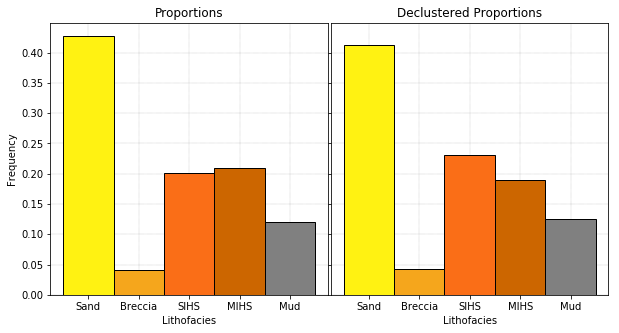

In [74]:
fig, axes = gs.subplots(1, 2, figsize=(10, 5), aspect=False)

# Calculate the proportions
proportion = gs.Proportion(dat) #starting class without defined categories
# Print the proportions
print(repr(proportion)+'\n') #representation
# Plot the proportions
proportion.plot(ax=axes[0])

# Repeat the above, but using declustering weights
proportion = gs.Proportion(dat_declus, wt=True)
print(repr(proportion)+'\n')
proportion.plot(ax=axes[1])

### Convert the category column to indicator columns
Required input to the maketrend program.

In [75]:
dat_ind = dat
names = []
for cat in catdict.keys():
    names.append('Indicator for Category '+str(cat))
    
    # The resulting column will be 1 for records that
    # match cat, 0 otherwise
    dat[names[-1]] = (dat[dat.cat] == cat).astype(int)

# Output for input to maketrend
dat_ind.flname = outdir+'indicators.out'
dat_ind.writefile(dat_ind.flname)

# Reset the variable columns
dat_ind.setvarcols(names)
print('indicator columns', dat_ind.variables)
dat_ind.describe()

indicator columns ['Indicator for Category 1', 'Indicator for Category 2', 'Indicator for Category 3', 'Indicator for Category 4', 'Indicator for Category 5']


,Indicator for Category 1,Indicator for Category 2,Indicator for Category 3,Indicator for Category 4,Indicator for Category 5
count,11705.000000,11705.000000,11705.000000,11705.000000,11705.000000
mean,0.427339,0.041008,0.201538,0.209654,0.120461
std,0.494713,0.198317,0.401166,0.407079,0.325514
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000


### Calculate the local proportion of each category

In [76]:
maketrend = gs.Program(exedir+'maketrend')

C:\Users\serge\CCG\PRM_course_May2018\CCG_PRM_Course\03-ModelWorkflow\03-Categorical\tmpunqob7xn\maketrend.par has been copied to the clipboard


In [77]:
parstr = """              Parameters for MAKETREND
              *******************************

START OF PARAMETERS:
{datafl}                          -file with data
{xyzcols}                         -   columns for X, Y, Z coordinates
{ncat}   {indcols}                -   number of variables, column numbers
-98     1.0e11                    -   trimming limits
2                                 -trend type: 0 - vertical; 1 - aerial; 2 - 3D (must be 2)
0                                 -type of averaging volume: 0 - sphere, 1 - cube
1000.0 1000.0 10.0                  -search radii
0.0 0.0                           -azimuth and dip
200                                -nearest neighbors to use (0 for all) #averaging 200 data
1000                               -distance cutoff
0                                 -weighting function: 0 - equal, 1 - Gaussian
1 3                               -apply post processing filter: 1 - yes (must be 0)
5 5 1                             -filter size: nx, ny, nz
0                                 -filter weighting function: 0 - equal, 1 - Gaussian
1                                 -ensure sum to 1 for compositional trends: 1 - yes
0                                 -use keyout array? (0=no,1=yes)
nofile                            -  file for keyout
1 1                               -  column for keyout and value to keep
{trendfl}                         -file for trend output (must be GSB)
{griddef}
0                                 -if vertical trend, generate a plot, 1 - yes
vertical.ps                       -file for postscript output
1                                 -cumulative curves, 1 - yes
0. 1.                             -min and max values for x axis
50                                -scaling factor for x axis
1 2                               -colors for curves, see codes below

Additional Options/Notes
 - this version can be applied to large models where a number of cells do
   not require estimation. It uses a keyout file, for only estimating the 
   trend of specified nodes. This is only provided for the 3-D option. 
   The post-processing filter is not tested with this keyout and may cause errors. 
   This program only outputs a GSB formatted file with the 3-D option. 
 - for vertical trends, a 2D/3D model is output if nx and/or ny are > 1
"""
trendfl = outdir+'maketrend.gsb'
pars = dict(datafl=dat_ind.flname, 
            xyzcols=dat_ind.gscol(dat_ind.xyz), 
            ncat=ncat,
            indcols=dat_ind.gscol(dat_ind.variables),
            trendfl=trendfl, griddef=griddef)
maketrend.run(parstr=parstr.format(**pars), liveoutput=False)

Calling:  ['../exes/maketrend', 'temp']


### Set some plotting parameters for sections in the remaining notebooks
All sections will be through the midpoint in each dimension for basic inspection.

In [78]:
# Constant slice numbers
sx = int(griddef.nx/2)
sy = int(griddef.ny/2)
sz = int(griddef.nz/2)

# Aspects and figure sizes
aspects = {'xy':True, 'xz':False, 'yz':False}
figsizes = {'xy':(10, 6), 'xz':(10,4), 'yz':(10,4)}

# Size setting
gs.gsParams['plotting.locmap.s'] = 2

### Sections of the local proportions
The keyout is used for drawing attention away from areas that won't be simulated (and may have search related artifacts). This keyout could be used as input to the maketrend program, but would prevent the post-processing algorithm.

In [79]:
keyout = gs.DataFile(keyfl_all)
keyout = keyout['Keyout'] == 0
trend = gs.DataFile(trendfl)
trend.data.loc[keyout] = np.nan

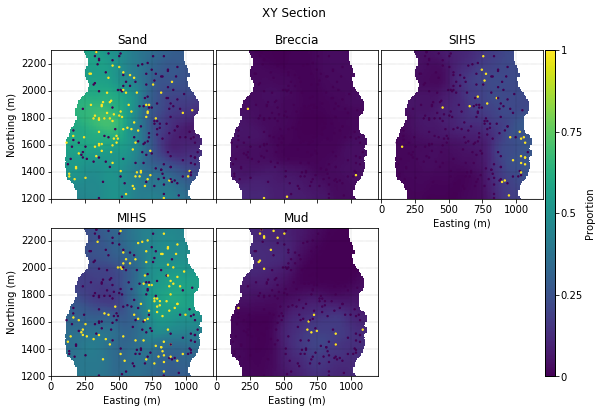

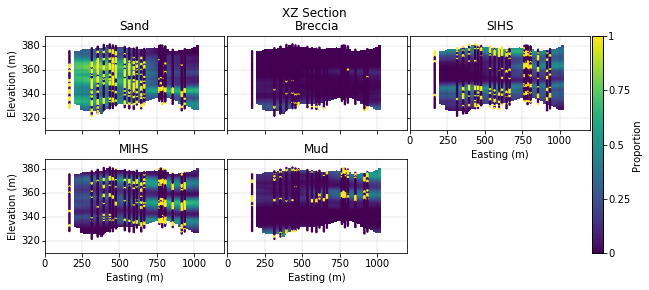

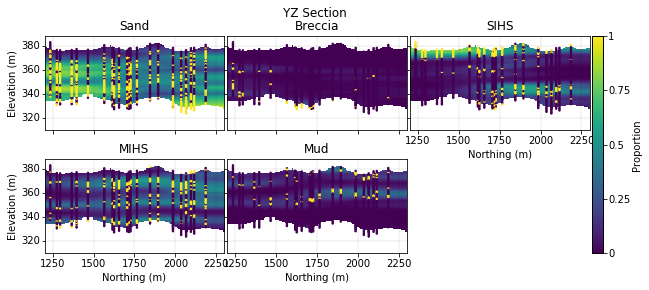

In [80]:
for orient, sliceno in zip(['xy', 'xz', 'yz'], [sz, sy, sx]):
    aspect, figsize = aspects[orient], figsizes[orient]
    fig, axes = gs.subplots(2, 3, cbar_mode='single',  
                            figsize=figsize, aspect=aspect)
    for var, ax, cat in zip(trend.variables, axes, catdict.values()):
        gs.pixelplt(trend, var=var, pointdata=dat_ind,
                    ax=ax, sliceno=sliceno, orient=orient,
                    vlim=(0, 1), title=cat, cbar_label='Proportion')
    # Remove the usused axes and add labels as required
    gs.subplots_clean(axes, ncat, 3)
    fig.suptitle(orient.upper()+' Section')

## 4. Calculate and Model Indicator (Residual) Variograms

Since locally varying proportions (and thresholds) will be used within the HTPG framework, the simulated latent Gaussian variables should not truncate to the indicator variograms, but the indicator residual variograms.

Calculate the indicator residuals, before calculating and modeling the associated variograms.

### Calculate the indicator residuals

In [81]:
idx, _ = griddef.coord_to_index1d(dat[dat.x], dat[dat.y], dat[dat.z])
names = []
for var in dat_ind.variables:
    prop = (trend[var].values)[idx]
    names.append(var+' (Local Residual)')
    dat_ind[names[-1]] = dat_ind[var] - prop  
dat_ind.drop(dat_ind.variables)
dat_ind.setvarcols(names)
dat_ind.variables

['Indicator for Category 1 (Local Residual)',
 'Indicator for Category 2 (Local Residual)',
 'Indicator for Category 3 (Local Residual)',
 'Indicator for Category 4 (Local Residual)',
 'Indicator for Category 5 (Local Residual)']

### Calculate the indicator residual variograms
Note that is much faster using the varcalc program, where multiple variables are calculated with a single search. Not used here for consistency and convenience

In [82]:
vargs = []
for i, var in enumerate(gs.log_progress(dat_ind.variables)):
    varg = gs.Variogram(dat_ind, var=var, ndir=2, omnihz=True, variostd=True,
                        mute=True)
    varg.inferdirections(azm=0.0, dip=0.0, tilt=0.0)
    varg.update_calcpars(nlags=(20, 10), lagdist=(10, 1.0), lagtol=(5, .5),
                         azmtol=90.0, diptol=10.0, 
                         bandhorz=(1.0e21, 10.0), bandvert=3.0 )
    varg.varcalc()
    vargs.append(varg)

VBox(children=(HTML(value=''), IntProgress(value=0, max=5)))

### Model and plot the variograms

VBox(children=(HTML(value=''), IntProgress(value=0, max=5)))

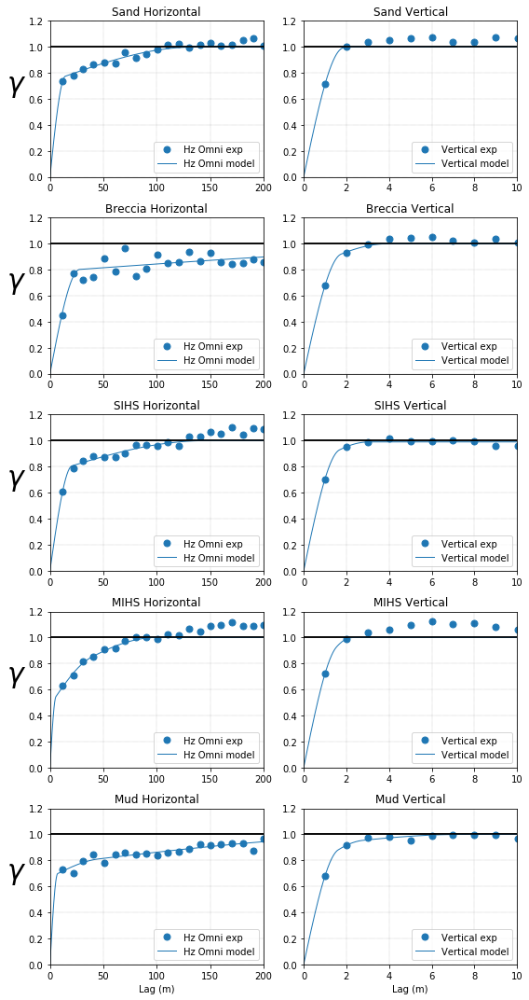

In [83]:
fig, axes = plt.subplots(5, 2, figsize=(8, 15))
for i, (varg, cat, ax) in enumerate(zip(gs.log_progress(vargs), catdict.values(), axes)):
    varg.update_modelpars(nst=3, c0=0.0, it=1)
    varg.fitmodel(sill=1.0)
    varg.plot(model=True, titles=(cat+' Horizontal', cat+' Vertical'), axes=ax)
ax[0].set_xlabel('Lag (m)')
ax[1].set_xlabel('Lag (m)')
fig.tight_layout()

## 5. Calculate the Transition Probabilities

The probability for each facies to transition into  each other is calculated next. Along with the previously calculated variograms, the transition probability informs the ordering of the truncation mask.

### Calculate the transition probability
The intrinsic repr function TransitProb is a formmated string representation of the matrix.

In [84]:
transitprob = gs.TransitProb(dat) #it knows what the category is
transitprob

Transition Probability Matrix:
          Sand  Breccia   SIHS   MIHS    Mud
Sand     0.710    0.213  0.127  0.184  0.094
Breccia  0.143    0.431  0.064  0.062  0.054
SIHS     0.132    0.031  0.594  0.131  0.138
MIHS     0.222    0.056  0.098  0.529  0.086
Mud      0.105    0.034  0.111  0.102  0.547

### Plot the matrix
The plot function is available for improving visualization (relative to the string above).

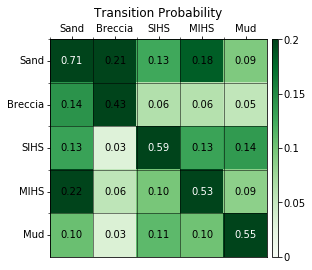

In [85]:
transitprob.plot(vlim=(0, .2))

### Plot the dissimilarity matrix and MDS mapping
Converting the transition probability matrix to a dissimilarity matrix permits the use of MDS mapping, which may simplify understanding.

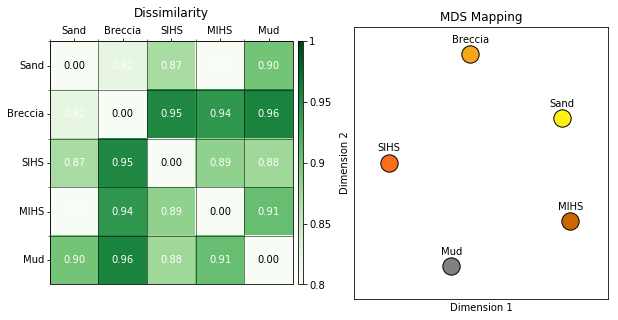

In [86]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
transitprob.plot_dissim(ax=axes[0], vlim=(.8, 1))
transitprob.plot_mds(ax=axes[1], vpad=.05)


## 6. Define the Truncation Mask
The HTPG truncation mask should consider two priorities:
1. Only allowing categories of like-spatial continuity (variograms) to be truncated in the same latent Gaussian variable
2. Ensuring that the truncation ordering respects order relations (transition probabilities)

The two priorities are often at odds. In this case, there is no clear order relations according to the transition probabilities, so variogram reproduction will be emphasized by the mask.

### Set the mask dictionary
A three-level dictionary is used for specifying the dictionary within the HierTPG object that is introduced in the next section.

In [87]:
mask = {'g1': {'t1':{'below': [5, 4, 3, 2], 'above': 1}},
        'g2': {'t2':{'below': [5, 4, 3], 'above': 2}},
        'g3': {'t3':{'below': [5, 4], 'above': 3}},
        'g4': {'t4':{'below': 5, 'above': 4}},   
        }

### Initiate the HTPG object before plotting its mask

Beyond the parameters that have already been prepared, the HTPG framework requires the use of 4 HTPG programs (htpg_thresholds, htpg_gaussvarg, htpg_cat2gauss and htpg_gauss2cat), along with intermittent steps such as latent Gaussian variogram modeling and simulation.

To simplify this process, an HTPG object is provided by Pygeostat for executing these 4 programs and streamlining the intermittent steps. This allows for minimal parameters to be specified with each progressive function.

The object is initiated with the mask, before using its plot function to ensure that the dictionary was properly set.

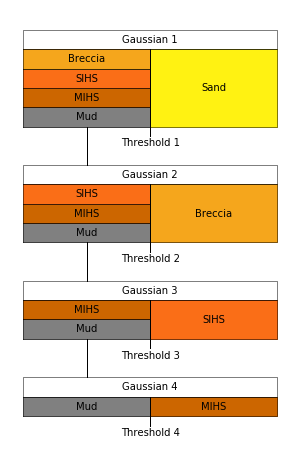

In [88]:
htpg = gs.HierTPG(mask)
htpg.plot(figsize=(5, 8))

## 7. Local Truncation Thresholds

Now that the truncation mask is defined, local thresholds may be calculated based on the locally varying proportions.

### Calculate the local thresholds
The proportion object is used for specifying the global proportions, which are required in addition to the file name containing the local proportion trend.

In [89]:
htpg.thresholds(proportion.props, locpropfl=trend.flname,
                locthreshfl=outdir+'localthresh.gsb', exedir=exedir) #we have to put in global and local proportions

Successfully executed htpg_thresholds. Inspect the self.globthresh and self.locthreshfl results.


### Sections of the local thresholds
The locthreshfl name is appended to the HierTPG object to permit future calculations without its specification, although it may also be applied for user convenience (as will be seen with other attributes and file names).

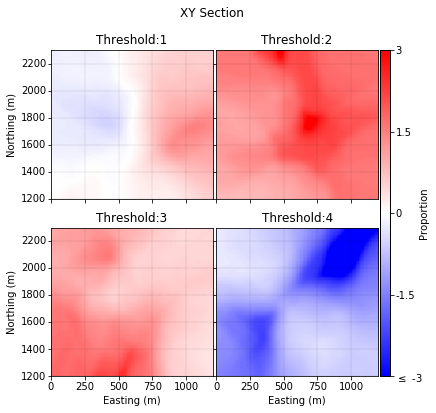

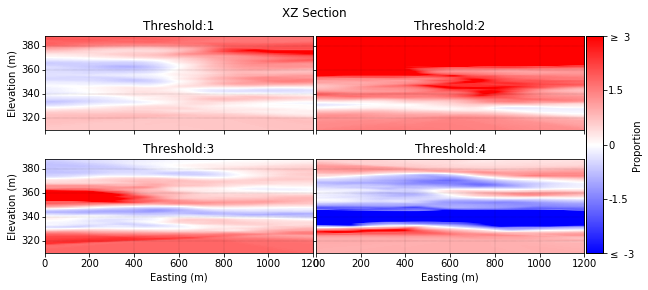

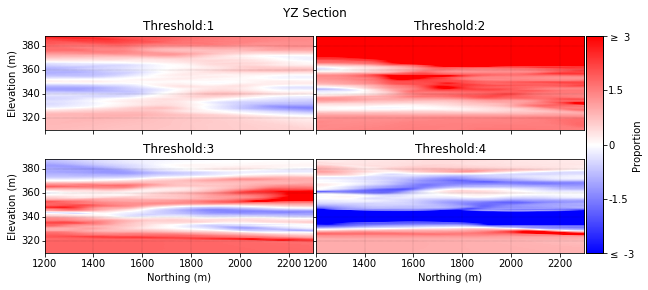

In [90]:
thresh = gs.DataFile(htpg.locthreshfl)
for orient, sliceno in zip(['xy', 'xz', 'yz'], [sz, sy, sx]):
    aspect, figsize = aspects[orient], figsizes[orient]
    fig, axes = gs.subplots(2, 2, cbar_mode='single',  
                            figsize=figsize, aspect=aspect)
    for var, ax, cat in zip(thresh.variables, axes, catdict.values()):
        gs.pixelplt(thresh, var=var, pointdata=dat_ind,
                    ax=ax, sliceno=sliceno, orient=orient,
                    vlim=(-3, 3), title=var, cmap='bwr',
                    cbar_label='Proportion')
    fig.suptitle(orient.upper()+' Section')

## 8. Calculate and Model the Gaussian Variograms

Given the truncation mask, the variograms of Gaussian random fields that when truncated, will yield the previously calculated indicator (residual) variograms are calculated.

### Calculate the Gaussian variograms that will yield the indicators when truncated

A list of indicator variogram objects, which are required to have fit models (as previously done), are input to the calculation.

Successfully executed htpg_gaussvarg. Inspect the self.gaussvarg results.


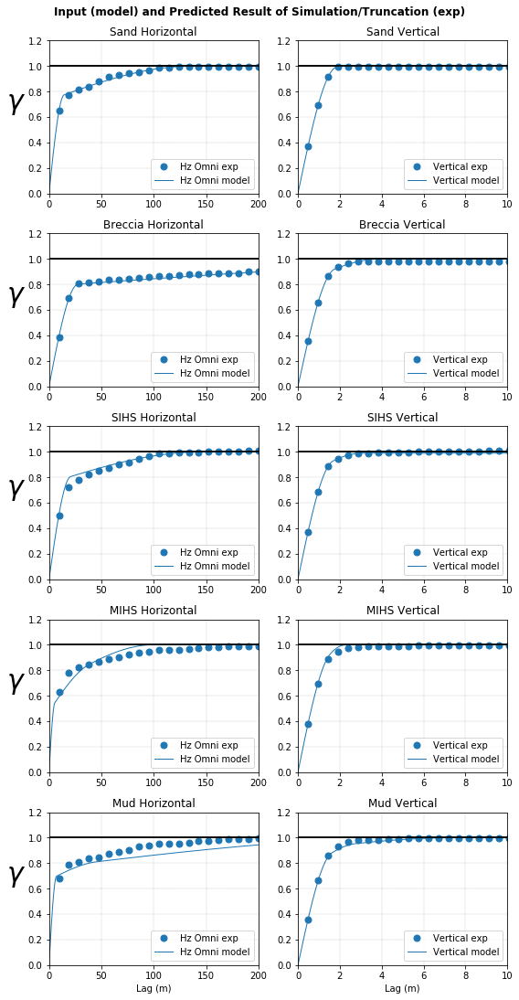

In [91]:
htpg.gaussvarg(vargs, exedir=exedir)

### Fit the Gaussian variogram models
htpg.gaussvargs is a list of variogram objects, which have the experimental Gaussian variogram that is optimized to yield the targeted indicator variograms. These variograms are now fit with models that will be input to simulation.

VBox(children=(HTML(value=''), IntProgress(value=0, max=4)))

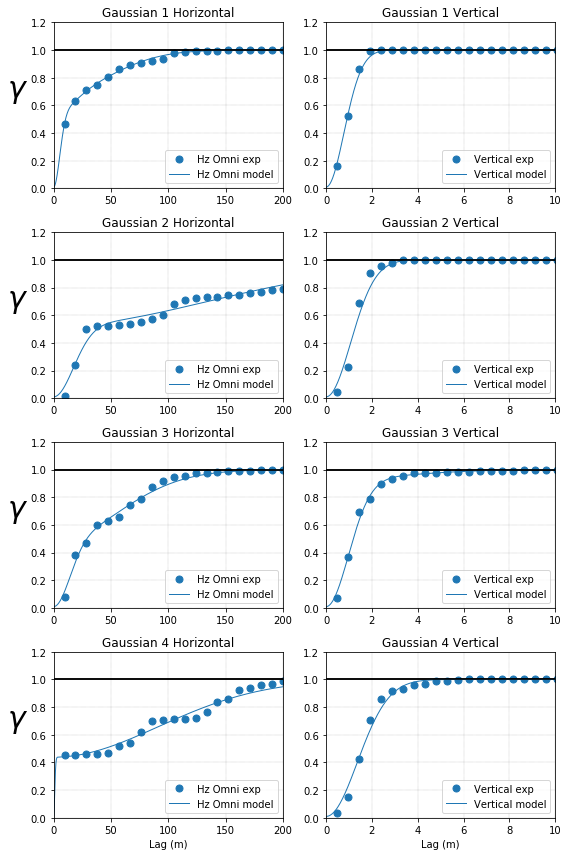

In [92]:
fig, axes = plt.subplots(htpg.ngauss, 2, figsize=(8, 12))
for i, (varg, ax) in enumerate(zip(gs.log_progress(htpg.gaussvargs), axes)):
    varg.update_modelpars(nst=3, c0=0.01, it=3)
    varg.fitmodel(sill=1.0)
    varg.plot(model=True, titles=('Gaussian {} Horizontal'.format(i+1),
                                  'Gaussian {} Vertical'.format(i+1)), axes=ax)
ax[0].set_xlabel('Lag (m)')
ax[1].set_xlabel('Lag (m)')
fig.tight_layout()

## 9. Impute the Latent Gaussian Data Realizations

Now that the truncation mask, Gaussian variogram models and locally varying thresholds are defined, the Gaussian data realizations may be imputed as the final step prior to simulation of the grid.

### Initialize required parameters and directories

Set maximum search radii based on the correlation extent in the Gaussian variograms above. gaussdatadir is the output directory for Gaussian data realizations.

In [93]:
searchradii = [200, 200, 4]
gaussdatadir = outdir+'GaussDataReals/'
gs.mkdir(gaussdatadir)

### Impute the data realizatons
Time the execution since this may take a few minutes, despite parallel execution within the function.

In [94]:
start_time = time.time()
htpg.cat2gauss(dat, gaussdatadir, searchradii=searchradii, 
               exedir=exedir)
imptime = (time.time() - start_time)/60
print('execution took {} minutes'.format(imptime))

Successfully executed htpg_cat2gauss. Inspect the self.gaussdatafls results.
execution took 1.4640902598698935 minutes


### Inspect the last data realization

In [95]:
dat_gauss = gs.DataFile(htpg.gaussdatafls[nreal-1])
print('columns = ', list(dat_gauss.columns))
dat_gauss.describe()

columns =  ['X', 'Y', 'Z', 'Categories', 'Y1', 'Y2', 'Y3', 'Y4']


,Y1,Y2,Y3,Y4
count,11705.000000,11705.000000,11705.000000,11705.000000
mean,-0.003692,0.017923,-0.017562,-0.002022
std,0.960831,0.868850,0.901532,0.819836
min,-3.549413,-3.956953,-3.492762,-3.367784
25%,-0.641684,-0.556899,-0.621702,-0.519873
50%,0.004471,0.012734,-0.008028,0.001795
75%,0.641716,0.595334,0.596197,0.524250
max,3.575782,3.478318,3.298964,3.076209


## 10. Simulate Realizations of the Latent Gaussian Variables

All parameters are now assembled, so simulated the latent Gaussian variables.

### Initialize the output directory and program

In [96]:
simgaussdir = 'Output/GaussReals/'
gs.mkdir(simgaussdir)

In [97]:
usgsim = gs.Program(program=exedir+'usgsim')

C:\Users\serge\CCG\PRM_course_May2018\CCG_PRM_Course\03-ModelWorkflow\03-Categorical\tmpwmrse0pb\usgsim.par has been copied to the clipboard


### Initialize the parameter file
The (potentially intimidating) parstr will be iteratively formatted with variables that are constant, change by variable and change by realization.

Note that the parameter file could be simplified (and execution time reduced) by simulating multiple variables simultaneously, though this generally comes at the expense of variogram reproduction.mm 

In [98]:
parstr = """               Parameters for USGSIM
               *********************

START OF MAIN:
1                             -number of realizations to generate, 0=kriging
1                             -number of variables being simulated
1                             -number of rock types to consider
{seed}                         -random number seed
{gridstr}
{outfl}                       -file for simulation output
2                             -  output format: (0=reg, 1=coord, 2=binary)
impute.out                    -file for imputed values in case of heterotopic samples
0                             -debugging level: 0,1,2,3
sgsim.dbg                     -file for debugging output 

START OF SRCH:
40                            -number of data to use per variable
{searchradii}                 -maximum search radii (hmax,hmin,vert)
0.0    0.0    0.0             -angles for search ellipsoid
1                             -sort by distance (0) or covariance (1)
1 1 1                         -if sorting by covariance, indicate variogram rock type, head, tail to use

START OF VARG:
1                             -number of variograms
1  1  1                       -rock type, variable 1, variable 2
{vargstr}

START OF DATA:
{datafl}                      -file with primary data
{xyzcols}  0  0               -  columns for X,Y,Z,wt,rock type
{varcol}                      -  columns for variables
1                             -  clip data to grid, 1=yes
1                             -  assign to the grid, 0=none, 1=nearest, 2=average
-998.5       1.0e21             -  trimming limits

START OF ROCK:
1                             -rock type codes
{keyfl}                       -file with rock types
1                             -column for rock type
"""
# Parameters that are constant
searchradii = ' '.join([str(i) for i in searchradii])
pars = dict(gridstr=griddef, searchradii=searchradii, 
            xyzcols=dat_gauss.gscol(dat_gauss.xyz))
callpars = []
iseed = 0
seeds = gs.rseed_list(htpg.ngauss*nreal, seed=212121)
for igauss, (var, varg) in enumerate(zip(dat_gauss.variables,
                                         htpg.gaussvargs)):
    # Parameters that change by variable
    pars['varcol'] = dat_gauss.gscol(var)
    pars['vargstr'] = str(varg.model)
    for ireal in range(nreal):
        # Parameters that change by realization
        pars['datafl'] = htpg.gaussdatafls[ireal]
        pars['outfl'] = simgaussdir+\
            'real{}_gauss{}.gsb'.format(ireal+1, igauss+1)
        pars['keyfl'] = keydir+'real{}.gsb'.format(ireal+1)
        pars['seed'] = str(seeds[iseed])
        iseed += 1
        # Add this parstr to the callpars
        callpars.append({'parstr': parstr.format(**pars)})

### Check an arbitrary parameter file
Not required, but used here for clarity.

In [99]:
print(callpars[-1]['parstr'])

               Parameters for USGSIM
               *********************

START OF MAIN:
1                             -number of realizations to generate, 0=kriging
1                             -number of variables being simulated
1                             -number of rock types to consider
94591                         -random number seed
120 5.0 10.0 
110 1205.0 10.0 
78 310.5 1.0
Output/GaussReals/real4_gauss4.gsb                       -file for simulation output
2                             -  output format: (0=reg, 1=coord, 2=binary)
impute.out                    -file for imputed values in case of heterotopic samples
0                             -debugging level: 0,1,2,3
sgsim.dbg                     -file for debugging output 

START OF SRCH:
40                            -number of data to use per variable
200 200 4                 -maximum search radii (hmax,hmin,vert)
0.0    0.0    0.0             -angles for search ellipsoid
1                             -sort by dis

### Execute the simulation in parallel
Time the execution since this may take a few minutes, despite parallel execution.

In [100]:
start_time = time.time()
gs.runparallel(usgsim, callpars, reportprogress=True)
simtime = (time.time() - start_time)/60
print('execution took {} minutes'.format(simtime))

Creating parallel processes


VBox(children=(HTML(value=''), IntProgress(value=0, max=16)))

Pool assembled, asynchronously processing
Asynchronous execution finished.
execution took 8.345176990826925 minutes


### Merge the variables in each realization
The next step will require files that have all latent Gaussian variables in one file, so merge them by realization.

In [101]:
for ireal in gs.log_progress(range(nreal)):
    for igauss in range(htpg.ngauss):
        outfl = simgaussdir+'real{}_gauss{}.gsb'.format(ireal+1,
                                                        igauss+1)
        sim = gs.DataFile(outfl)
        if igauss == 0:
            merge = sim
            merge.rename({merge.columns[0]: 'Gaussian 1'})
        else:
            merge['Gaussian '+str(igauss+1)] = sim.data.values
        gs.rmfile(outfl)
    merge.writefile(simgaussdir+'real{}.gsb'.format(ireal+1))
del merge
del sim

VBox(children=(HTML(value=''), IntProgress(value=0, max=4)))

## 11. Truncate to Generate Categorical Realizations

The final step of the simulation truncates the latent Gaussian variables to generated realizations of the categorical variables.

### Apply the gauss2cat function
As seen elsewhere, use of the wildcard specifies that the input/output files contain dedicated realizations that are named 1,...,nreal.

In [102]:
simcatdir = outdir+'Categories/'
gs.mkdir(simcatdir)
htpg.gauss2cat(simgaussdir+'real*.gsb', simcatdir+'real*.gsb', exedir=exedir)

C:\Users\serge\CCG\PRM_course_May2018\CCG_PRM_Course\03-ModelWorkflow\03-Categorical\tmpay9uejvs\htpg_gauss2cat.par has been copied to the clipboard
Creating parallel processes


VBox(children=(HTML(value=''), IntProgress(value=0, max=4)))

Pool assembled, asynchronously processing
Asynchronous execution finished.
Successfully executed htpg_gauss2cat. Inspect the self.simcatfls results.


### Inspect some realizations

Note that the conditioning data is displayed but is hard to discern (since the values and their spatial variability reproduced). Consider using `pointkws={'edgecolors': 'k'}` to display the results.

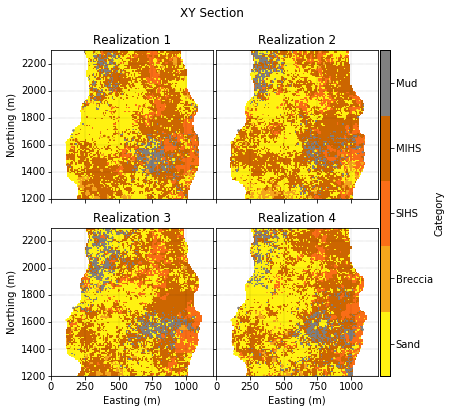

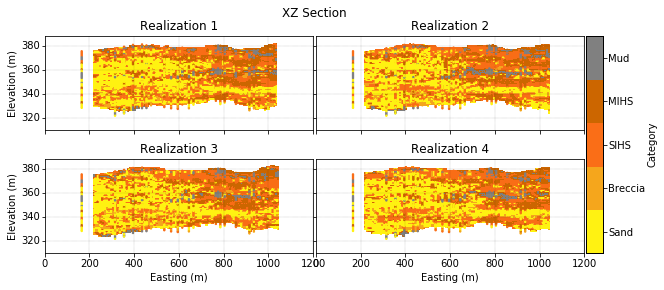

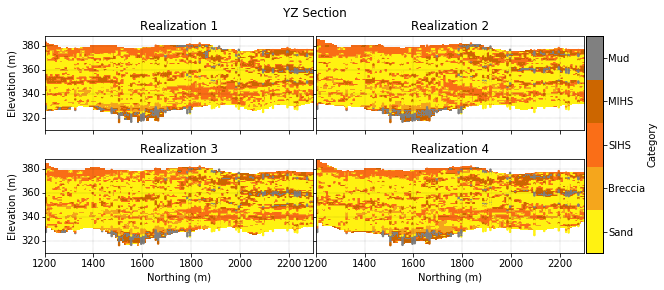

In [103]:
for orient, sliceno in zip(['xy', 'xz', 'yz'], [sz, sy, sz]):
    aspect, figsize = aspects[orient], figsizes[orient]
    fig, axes = gs.subplots(2, 2, cbar_mode='single',  
                            figsize=figsize, aspect=aspect)
    for ireal, ax in enumerate(axes):
        sim = gs.DataFile(htpg.simcatfls[ireal])
        gs.pixelplt(sim, var=sim.cat, catdata=True,
                    pointdata=dat, pointvar=dat.cat,
                    ax=ax, sliceno=sliceno, orient=orient,
                    title='Realization {}'.format(ireal+1),
                    cbar_label='Category')
    fig.suptitle(orient.upper()+' Section')

## 12. Check the Categorical Data Reproduction

With simulation complete, basic properties may now be inspected, including the proportion and variogram reproduction that is displayed here.

### Calculate the proportion of each realization
The previously intialized Proportion object allows for the rapid calculation of simulation proportions.

In [104]:
proportion.calcsim(simcatdir+'real*.gsb')
print(repr(proportion.simprops)+'\n')
print(repr(proportion.simavgprops))

                Sand  Breccia   SIHS   MIHS    Mud
Real. 1 Prop.  0.423    0.039  0.203  0.223  0.111
Real. 2 Prop.  0.423    0.035  0.206  0.218  0.117
Real. 3 Prop.  0.427    0.038  0.207  0.214  0.115
Real. 4 Prop.  0.429    0.037  0.208  0.211  0.115

                   Sand Breccia   SIHS   MIHS    Mud
Avg. Real. Prop.  0.426   0.037  0.206  0.217  0.115


### Compare the data and realization proportions
The Proportion.plotsim function displays a cross-plot between the proportion of the realizations and the declustered data proportions.

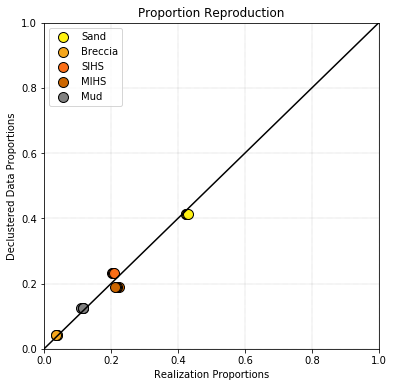

In [105]:
proportion.plotsim(figsize=(6, 6))

### Correct the proportions
Correct the simulated category proportions so that they average to the data proportions. A kernel-based algorithm is used for ensuring data reproduction and minizing changing to the realization continuity.

Note that this step is not necessarily recommended in the present scenario, though the tool is demonstrated since it is sometimes required for explicit data reproduction.

In [106]:
# Only the output file name for the corrected proportions is
# required as input
simcatdir = 'Categories/'
gs.mkdir(simcatdir)
proportion.correctsim(simcatdir+'real*.gsb', exedir=exedir)

C:\Users\serge\CCG\PRM_course_May2018\CCG_PRM_Course\03-ModelWorkflow\03-Categorical\tmpzfvh4991\PET.par has been copied to the clipboard
Creating parallel processes


VBox(children=(HTML(value=''), IntProgress(value=0, max=4)))

Pool assembled, asynchronously processing
Asynchronous execution finished.


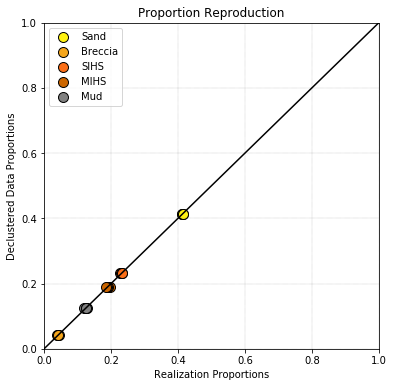

In [107]:
proportion.plotsim(figsize=(6, 6))

### Calculate the categorical data variograms

We need to calculate the categorical variograms, since we previously calculated variograms of the indicator residuals.

In [108]:
vargs = []
for i, (catcode, cat) in enumerate(gs.log_progress(catdict.items())):
    varg = gs.Variogram(dat, var=dat.cat, ndir=2, omnihz=True, 
                        variostd=True,
                        mute=True)
    varg.inferdirections(azm=0.0, dip=0.0, tilt=0.0)
    varg.update_calcpars(variotypes=10,
                         variocutcat=[[catcode, catcode]], 
                         nlags=(20, 10), 
                         lagdist=(10,1), lagtol=(5, .5),
                         azmtol=90.0, diptol=10.0, 
                         bandhorz=(1.0e21, 10.0), bandvert=3.0 )
    varg.varcalc()
    vargs.append(varg)
    print('finished', cat)

VBox(children=(HTML(value=''), IntProgress(value=0, max=5)))

finished Sand
finished Breccia
finished SIHS
finished MIHS
finished Mud


### Calculate the categorical realization variograms

In [109]:
start_time = time.time()
# Calculate the variograms of the realizations
for i, varg in enumerate(gs.log_progress(vargs)):
    varg.update_simpars(datafl=simcatdir+'real*.gsb', varcols=1,
                        nlags=20)
    varg.varsim()
varsimtime = (time.time() - start_time)/60
print('execution took {} minutes'.format(varsimtime))

VBox(children=(HTML(value=''), IntProgress(value=0, max=5)))

Pool assembled, asynchronously processing
Asynchronous execution finished.
Pool assembled, asynchronously processing
Asynchronous execution finished.
Pool assembled, asynchronously processing
Asynchronous execution finished.
Pool assembled, asynchronously processing
Asynchronous execution finished.
Pool assembled, asynchronously processing
Asynchronous execution finished.
execution took 1.6730384786923727 minutes


### Evaluate variogram reproduction

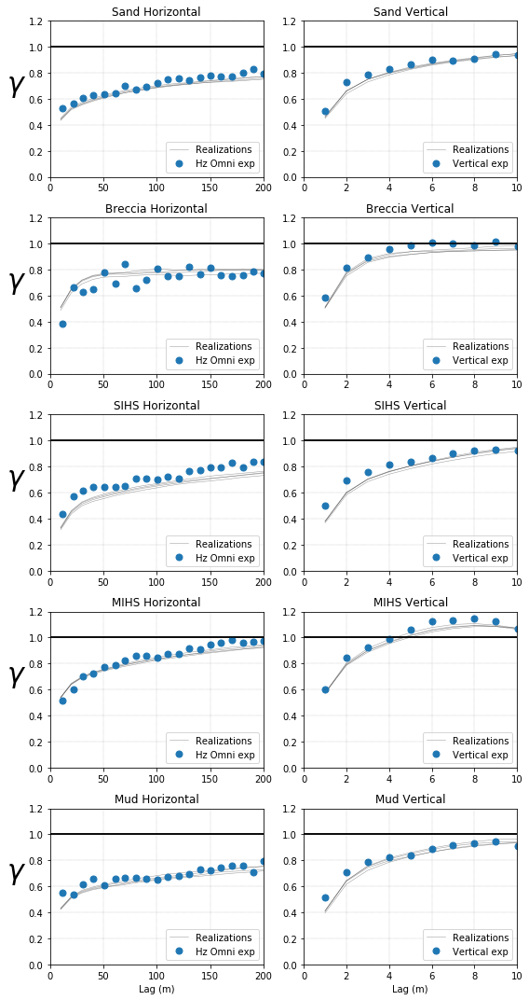

In [110]:
fig, axes = plt.subplots(5, 2, figsize=(8, 15))
for i, (varg, cat, ax) in enumerate(zip(vargs, catdict.values(), axes)):
    varg.plot(sim=True, titles=(cat+' Horizontal', cat+' Vertical'), axes=ax)
ax[0].set_xlabel('Lag (m)')
ax[1].set_xlabel('Lag (m)')
fig.tight_layout()

## 13. Cleaning Directories and Files

In [111]:
gs.gsParams.save('gsParams.txt')
gs.rmdir(outdir,verbose=True)
gs.rmfile('temp')

### Note the execution time

In [112]:
time = (time.time() - start_workflow_time)/60
print('workflow execution took {} minutes'.format(time))

workflow execution took 15.754350694020589 minutes


# Multivariate Modeling

The following notebook is comprised of 7 primary steps:

1. Initialize required packages, directories and parameters 
2. Load and inspect the multivariate data
3. Decluster the variables before transforming them to be independent
4. Calculate the normal score variogram models that are input to simulation
5. Independently simulate the Gaussian variables before back-transforming
6. Check reproduction of the data properties
7. Save project setting and clean the output files


## 1. Initialize required packages and parameters

In [1]:
import pygeostat as gs
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
from copy import deepcopy
% matplotlib inline

### Load project settings
Load the Matplotlib and Pygeostat project defaults.

In [2]:
gs.gsPlotStyle.load('../00-Introduction/gsParams.txt')
gs.set_style(custom={'figure.figsize': (10, 10)})

Assign nreal and griddef settings to variables for convenience.

In [3]:
gs.gsParams.load('../03-Categorical/gsParams.txt')
nreal = gs.gsParams['data.nreal']
print('nreal = {}'.format(nreal))
griddef = gs.gsParams['data.griddef']
griddef

nreal = 4


Pygeostat GridDef:
120 5.0 10.0 
110 1205.0 10.0 
78 310.5 1.0

### Category settings
Through the use of the following dictionaries, category names and colors do need to be specified in any of the function calls.

In [4]:
# Dictionary of the category codes/names
catdict = {1:'Sand', 2:'Breccia', 3:'SIHS', 4:'MIHS', 5:'Mud'}
gs.gsParams['data.catdict'] = catdict
ncat = len(catdict)

### Directories

In [5]:
# Path to the CCG executables
exedir = '../exes/'

# Keyout realizations
catdir = '../03-Categorical/Categories/'

# create the output directory
outdir = 'Output/'
gs.mkdir(outdir)

### Timed execution
Will inspect the time of this notebook and bottleneck steps.

In [6]:
start_workflow_time = time.time()

## 2. Load and Inspect the Multivariate Data

### Load the data and note its attributes
Follows previously demonstrated functionality, but not the variety of new attributes given the 3-D data with categorical and continuous variables.

In [7]:
dat = gs.DataFile('../data/PRM_data.dat')
print('drill hole column = {}'.format(dat.dh))
print('x, y and z columns (composite center) = {} {} {}'.format(dat.x, dat.y, dat.z))
print('variable columns = {}'.format(list(dat.variables))) #we dropped them in the previous assignment
print('category column = {}'.format(dat.cat))
print('category dictionary = {}'.format(dat.catdict))
dat.describe()

drill hole column = HoleID
x, y and z columns (composite center) = Easting Northing Elevation
variable columns = ['Phi', 'Vsh', 'Kv', 'Sw']
category column = Lithofacies
category dictionary = {1: 'Sand', 2: 'Breccia', 3: 'SIHS', 4: 'MIHS', 5: 'Mud'}


,Phi,Vsh,Kv,Sw
count,11705.000000,11705.000000,11705.000000,11705.000000
mean,0.260058,0.217612,2108.384548,0.464921
std,0.080541,0.171547,2346.164160,0.276202
min,0.000000,0.000000,0.000100,0.018620
25%,0.209170,0.087760,76.839600,0.216130
50%,0.276900,0.178750,802.395310,0.427370
75%,0.324490,0.300630,3751.962700,0.685680
max,0.438520,1.000000,10883.465000,1.000000


### Plot scatter across categories
scatplts is a wrapper on the lower-level scatplt function. The nmax kwarg allows for a random sub-set of the data to be displayed, although underlying statistics consider all passed data.

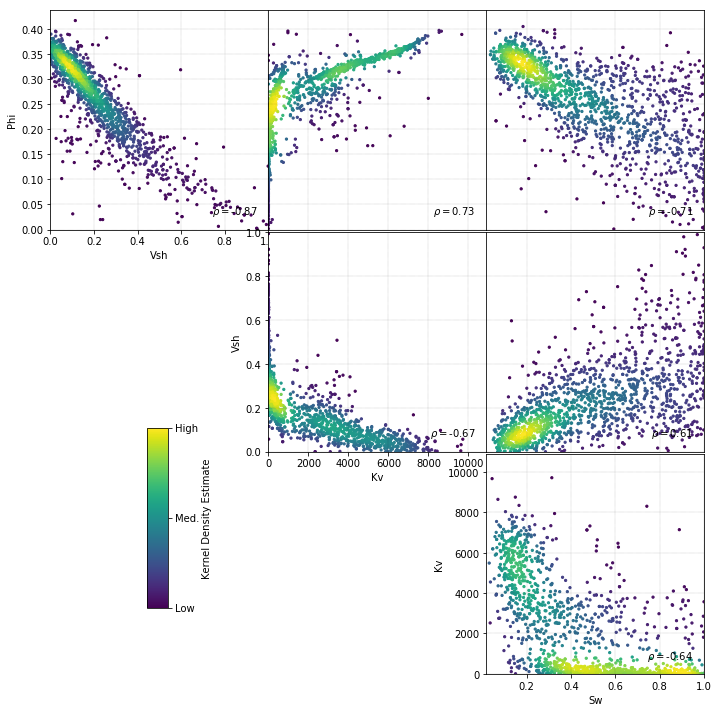

In [8]:
pad = (-6, -3.25)
nmax = 1500
fig = gs.scatplts(dat, s=5, nmax=nmax, pad=pad)

### Set some parameters for added convenience

In [9]:
nvar = dat.nvar
variables = dat.variables
catdict = dat.catdict
cats = catdict.values() #dictionary with 1=sand,2=breccia
ncat = len(cats)

### Generate data files for each category
The variables will be modeled in parallel for each category. Therefore, begin the workflow by dividing the variables into data files that are dedicated to each category (simplifies scripting).

In [10]:
# These variables are not required - so drop them
dat.drop([dat.ito, dat.ifrom])

# Record the data file with all categories as data_all
dat_all = deepcopy(dat)

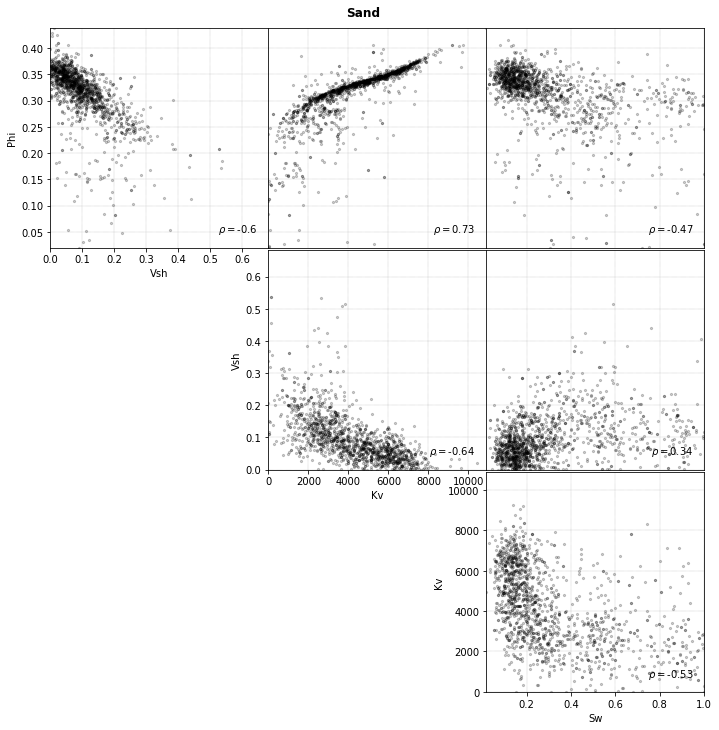

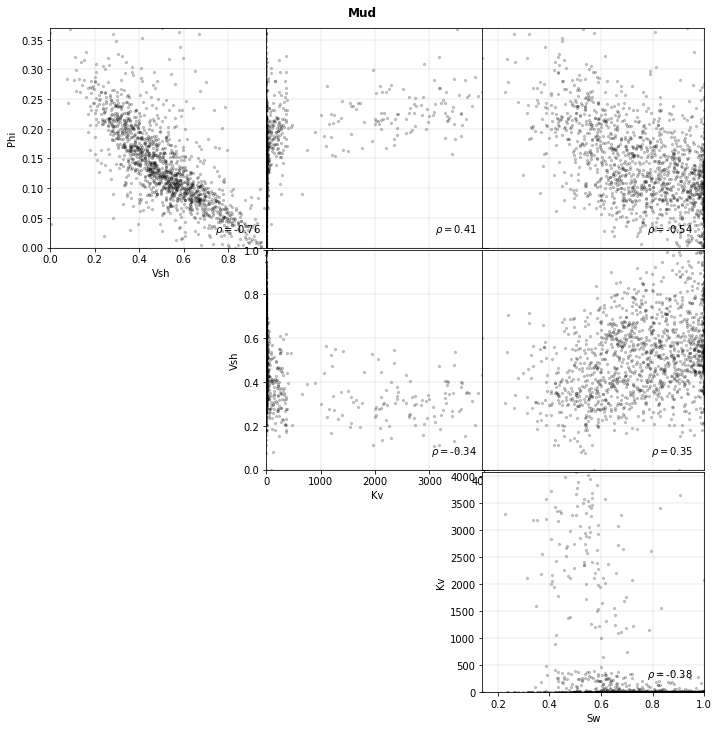

In [11]:
gs.mkdir(outdir+'Data/')
dats = {} #creating a dictionary
for catcode, cat in dat.catdict.items():
    # A copy is required to avoid problematic pointer behaviour
    dat = deepcopy(dat_all)
    
    # The data is only records where dat.cat equals the current
    # category
    dat.data = dat.data.loc[dat[dat.cat] == catcode] # loc is a standard indexing method - locating the data category where the rows are = to category code
    
    # Output
    dat.flname = outdir+'Data/'+cat+'.dat'
    dat.writefile(dat.flname)
    if cat == 'Sand' or cat == 'Mud':
        # Plot scatter of mud and sand to 
        # note their differing properties
        fig = gs.scatplts(dat, s=5, alpha=.2, c='k', 
                          nmax=nmax, pad=pad)
        fig.suptitle(cat, y=1.01, **{'weight': 'bold'})
    dats[cat] = dat

## 3. Decluster and Transform the Variables

Declustering is performed to calculate the representative distribution of each variable. This is then input to the projection pursuit multivariate transformation (PPMT), which transforms the variables to be Gaussian and independent. **Spatial despiking is recommended** prior to the transformation in practice, though it is avoided here to reduce the number of steps. Short scale spatial noise may be introduced as a result.

### Decluster each variable

This is only executed once per category since the variables are isotopically sampled.

In [12]:
declus = gs.Program(program=exedir+'declus')

C:\Users\serge\CCG\PRM_course_May2018\CCG_PRM_Course\03-ModelWorkflow\04-Multivariate\tmpyswbchmi\declus.par has been copied to the clipboard


In [13]:
parstr = """                  Parameters for DECLUS
                  *********************

START OF PARAMETERS:
{datafl}                    -file with data
{xyzcols}   {varcol}        -  columns for X, Y, Z, and variable
-98     1.0e21              -  trimming limits
declus.sum                  -file for summary output
{declusfl}                  -file for output with data & weights
1.0   1.0                   -Y and Z cell anisotropy (Ysize=size*Yanis)
0                           -0=look for minimum declustered mean (1=max)
1  100  100                 -number of cell sizes, min size, max size
10                          -number of origin offsets
"""
declusdir = outdir+'Declus/'

gs.mkdir(declusdir)
for cat in catdict.values():
    dat = dats[cat]
    pars = dict(datafl=dat.flname, xyzcols=dat.gscol(dat.xyz),
                varcol=dat.gscol(variables[0]),
                declusfl=declusdir+cat+'.out')
    declus.run(parstr=parstr.format(**pars), liveoutput=False)
    
    # Re-initialize dat to include the declustering weight
    dat = gs.DataFile(declusdir+cat+'.out') # initializing it with this and replacing by the next line
    dats[cat] = dat
gs.rmfile('declus.sum')

Calling:  ['../exes/declus', 'temp']
Calling:  ['../exes/declus', 'temp']
Calling:  ['../exes/declus', 'temp']
Calling:  ['../exes/declus', 'temp']
Calling:  ['../exes/declus', 'temp']


In [14]:
print('data file name = ', dats['Sand'].flname)
print('declustering attribute = ', dats['Sand'].wts)

data file name =  Output/Declus/Sand.out
declustering attribute =  Declustering Weight


### Transform the variables to be independent

The PPMT also outputs normal score data to facilitate the variogram calculation.

In [15]:
ppmt = gs.Program(program=exedir+'ppmt')

C:\Users\serge\CCG\PRM_course_May2018\CCG_PRM_Course\03-ModelWorkflow\04-Multivariate\tmpubs1pw2g\ppmt.par has been copied to the clipboard


In [16]:
parstr = """                         Parameters for PPMT
                         *******************
START OF PARAMETERS:
{datafl}             -input data file
{nvar} {varcols} {wtcol}     -  number of variables, variable cols, and wt col
-5 1.0e7             -  trimming limits
100 100 100             -min/max iterations and targeted Gauss perc. (see Note 1)
0                    -spatial decorrelation? (0=no,1=yes) (see Note 2)
1 2 0                -  x, y, z columns (0=none for z)
50 25                -  lag distance, lag tolerance
{nscorefl}           -output data file with normal score transformed variables
{ppmtfl}             -output data file with PPMT transformed variables
{tablefl}            -output transformation table (binary)
"""

# Prepare the output directories
nscoredir = outdir+'Nscore/'
ppmtdir = outdir+'PPMT/'
tabledir = outdir+'Table/'
gs.mkdir([nscoredir, ppmtdir, tabledir])

# Generate the parameter files
callpars = []
for cat in cats:
    dat = dats[cat]
    pars = dict(datafl=dat.flname, nvar=nvar,
                varcols=dat.gscol(variables),
                wtcol=dat.gscol(dat.wts),
                nscorefl=nscoredir+cat+'.out',
                ppmtfl=ppmtdir+cat+'.out',
                tablefl=tabledir+cat+'.trn')
    callpars.append({'parstr':parstr.format(**pars)})
gs.runparallel(ppmt, callpars, reportprogress=True)

Creating parallel processes


VBox(children=(HTML(value=''), IntProgress(value=0, max=5)))

Pool assembled, asynchronously processing
Asynchronous execution finished.


### Inspect the transformation results
Observe that the KDE of the PPMT transformed data approximates the typical Gaussian contours. Also note that the normal score correlation coefficients to not fully parameterize the displayed distributions, discouraging the use of cosimulation or linear decorrelation methods.

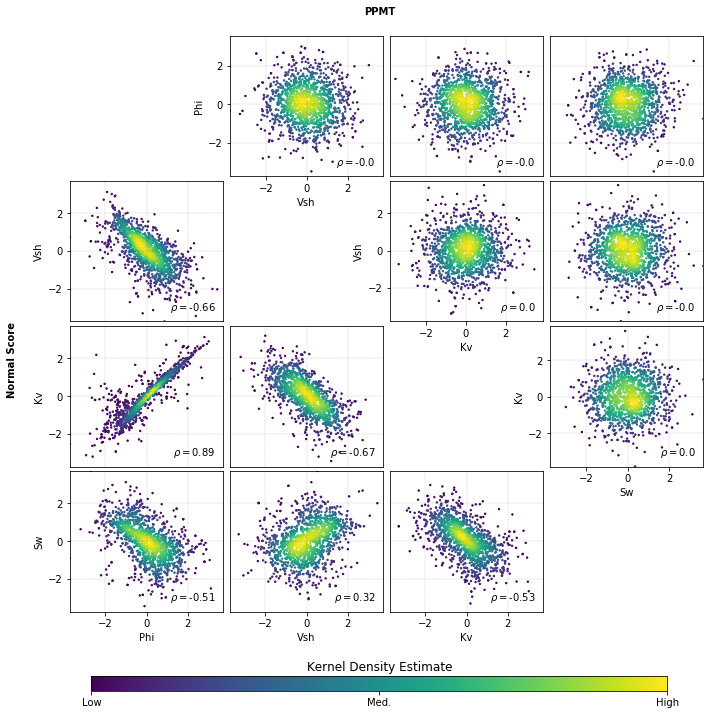

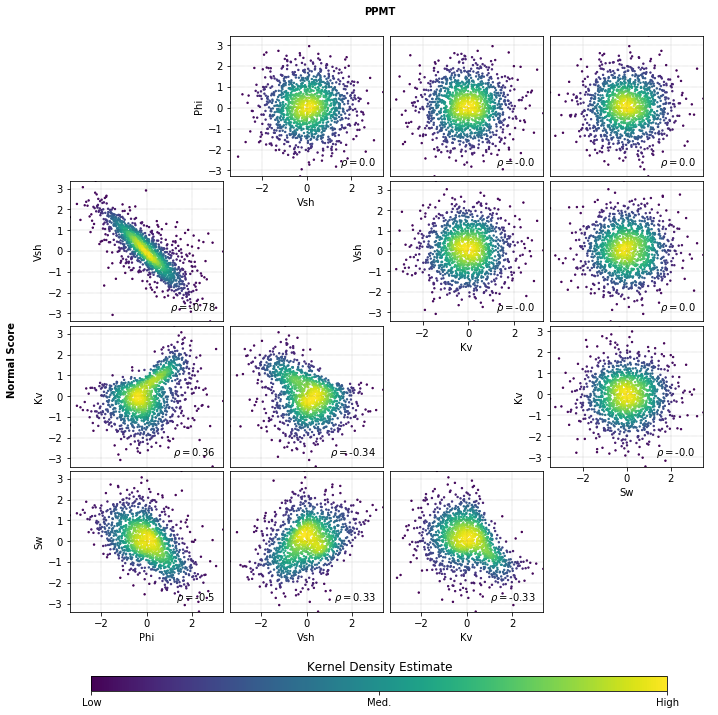

In [17]:
lupad = (-4, -3)
dats_ns, dats_ppmt = {}, {}
for cat in cats:
    # Normal score data
    dat = gs.DataFile(nscoredir+cat+'.out')
    # Drop the untransformed variables to conserve space
    dat.drop(variables)
    # Rename for convenience
    dat.rename({'Nscore:'+var: var for var in variables})
    dats_ns[cat] = dat
    
    # PPMT data
    dat = gs.DataFile(ppmtdir+cat+'.out')
    dat.drop(variables)
    dat.rename({'PPMT:'+var: var for var in variables})
    dats_ppmt[cat] = dat
    # Store since we'll use this modified data outside of
    # the notebook for simulation (and want columns to align)
    dat.writefile(ppmtdir+cat+'.out')
    
    if cat == 'Sand' or cat == 'Mud':
        fig = gs.scatplts_lu(dats_ns[cat], dats_ppmt[cat],
                             nmax=nmax, pad=lupad, s=2,
                             titles=('Normal Score', 'PPMT'))

## 4. Variogram Calculation and Modeling

Normal score variograms must be calculated and modeled. These models are input to Gaussian simulation in the next section.
### Variogram Calculation

In [18]:
vargs = {}
for cat in gs.log_progress(cats):
    vargs[cat] = []
    dat = dats_ns[cat]
    for i, var in enumerate(variables):
        varg = gs.Variogram(dat, var=var, ndir=2, omnihz=True, 
                            variostd=True, mute=True)
        varg.inferdirections(azm=0.0, dip=0.0, tilt=0.0)
        varg.update_calcpars(nlags=(20, 10), lagdist=(10, 1.0), 
                             lagtol=(5, .5),
                             azmtol=90.0, diptol=10.0, 
                             bandhorz=(1.0e21, 10.0), bandvert=3.0 )
        varg.varcalc()
        vargs[cat].append(varg)

VBox(children=(HTML(value=''), IntProgress(value=0, max=5)))

### Variogram Modeling
Unlike prior auto-fitting cells, a minimum constraint of 25m is placed on every horizontal nested structure below. This constraint was deemed necessary for some models (and does not negatively impact any).

VBox(children=(HTML(value=''), IntProgress(value=0, max=5)))

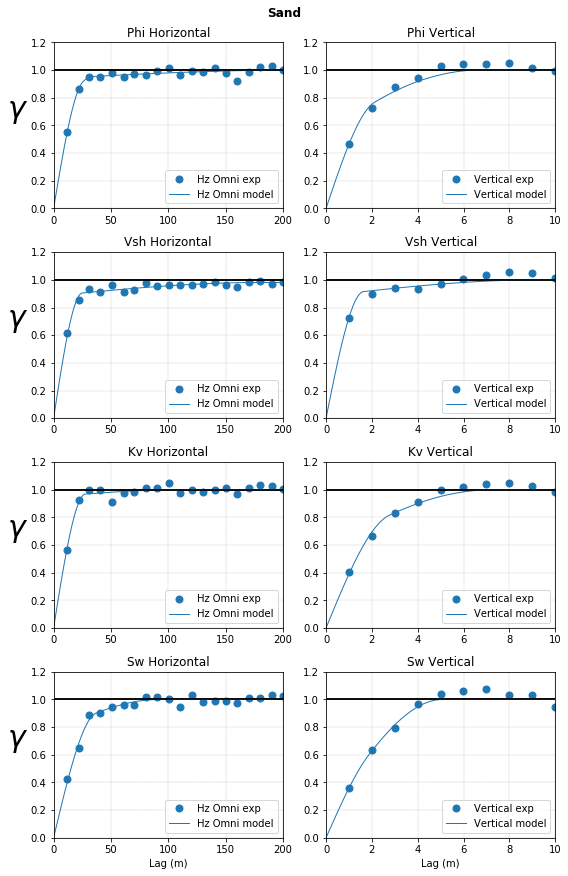

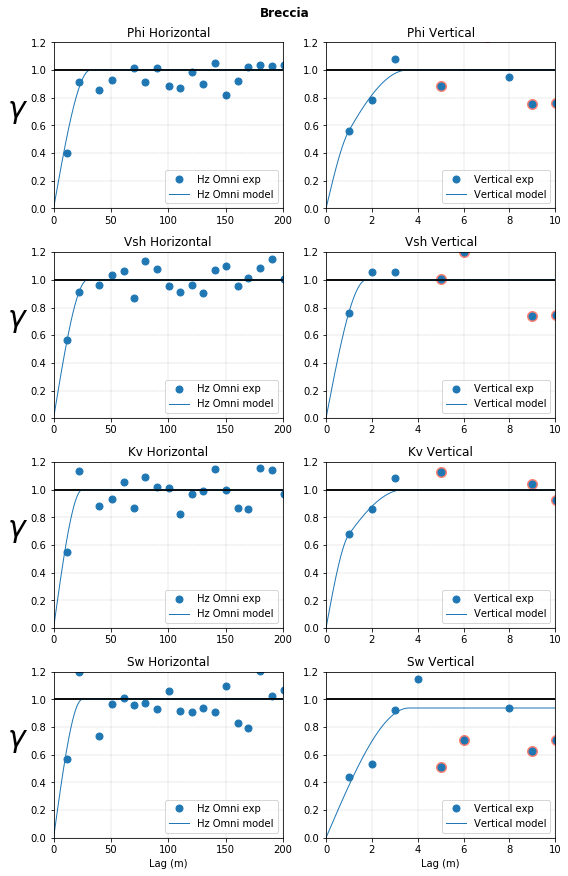

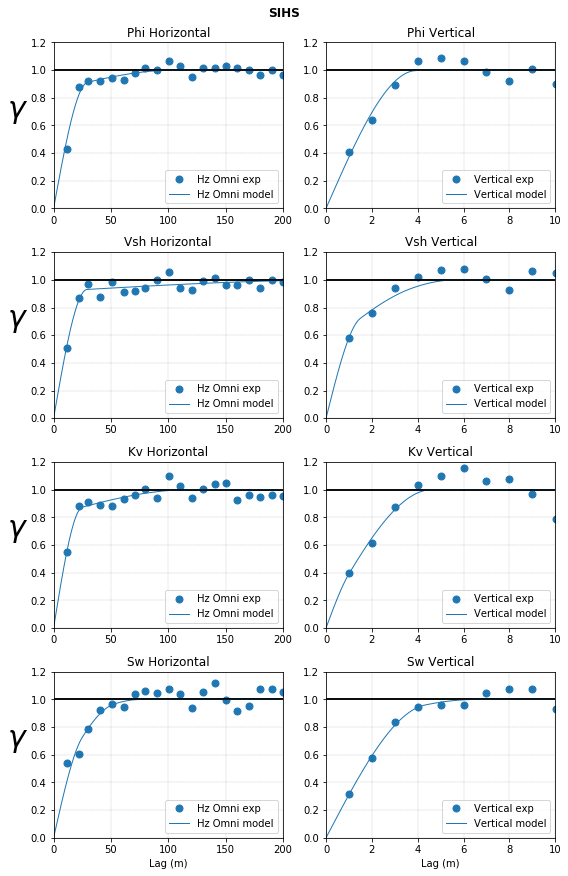

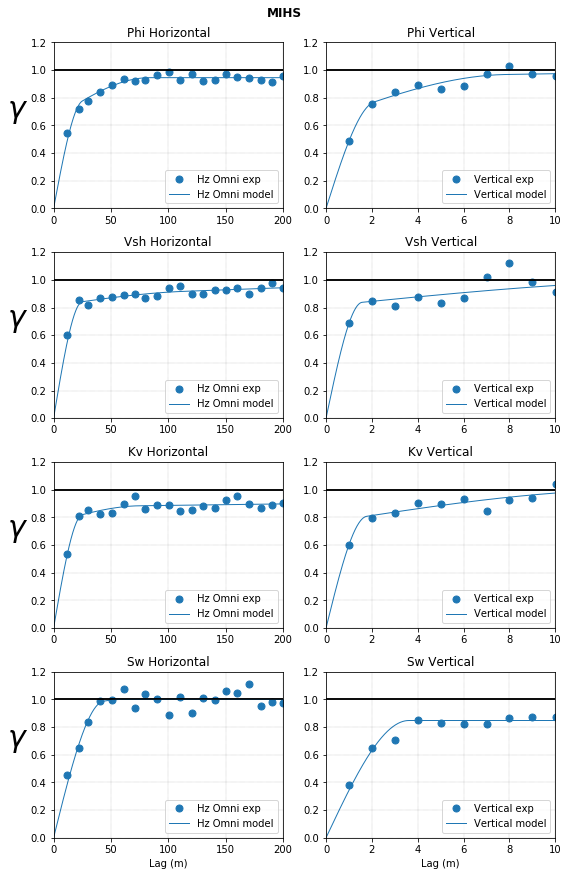

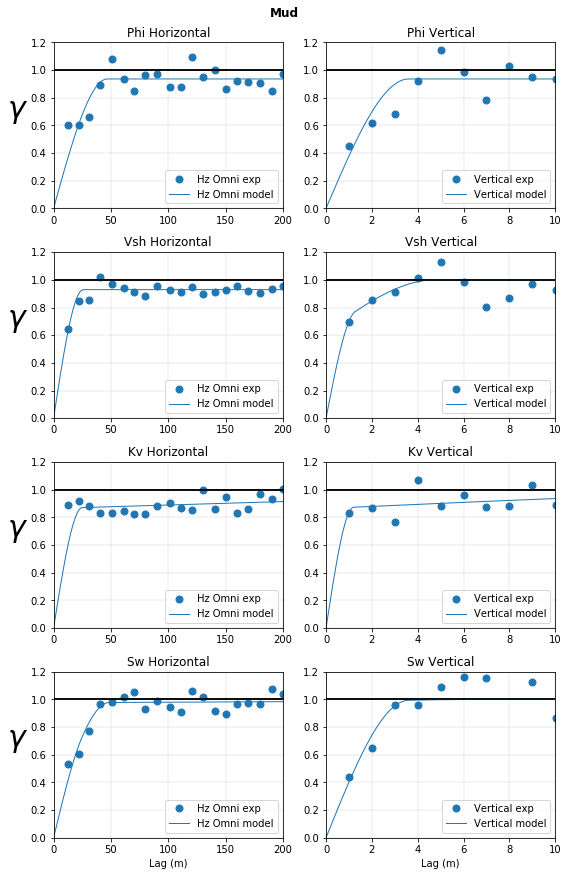

In [19]:
for cat in gs.log_progress(cats):
    fig, axes = plt.subplots(nvar, 2, figsize=(8, 3*nvar))
    for i, (var, varg, ax) in enumerate(zip(variables,
                                            vargs[cat],
                                            axes)):
        varg.update_modelpars(nst=3, c0=0.001, it=1,
                              ahmax=[[25, 1.0e21], 
                                     [25, 1.0e21], 
                                     [25, 1.0e21]],
                              ahmin=[[25, 1.0e21], 
                                     [25, 1.0e21], 
                                     [25, 1.0e21]])
        varg.fitmodel(sill=1.0)
        varg.plot(model=True, titles=(var+' Horizontal',
                                      var+' Vertical'), axes=ax)
    ax[0].set_xlabel('Lag (m)')
    ax[1].set_xlabel('Lag (m)')
    fig.tight_layout()
    fig.suptitle(cat, y=1.01, **{'fontweight': 'bold'})

## 5. Simulation and Back-transformation

The Gaussian variables are independently simulated, before being back-transformed to restore the original units and dependency.

### Independent Gaussian simulation
As before, the variables are simulated in dedicated usgsim executions to improve variogram reproduction.

In [20]:
usgsim = gs.Program(program=exedir+'usgsim')

C:\Users\serge\CCG\PRM_course_May2018\CCG_PRM_Course\03-ModelWorkflow\04-Multivariate\tmp47hhmu08\usgsim.par has been copied to the clipboard


In [21]:
simdir = outdir+'SGSIM/'
gs.mkdir(simdir)

In [22]:
parstr = """               Parameters for USGSIM
               *********************

START OF MAIN:
1                             -number of realizations to generate, 0=kriging
1                             -number of variables being simulated
1                             -number of rock types to consider
{seed}                         -random number seed
{gridstr}
{outfl}                       -file for simulation output
2                             -  output format: (0=reg, 1=coord, 2=binary)
impute.out                    -file for imputed values in case of heterotopic samples
0                             -debugging level: 0,1,2,3
sgsim.dbg                     -file for debugging output 

START OF SRCH:
40                            -number of data to use per variable
{searchradii}                 -maximum search radii (hmax,hmin,vert)
0.0    0.0    0.0             -angles for search ellipsoid
1                             -sort by distance (0) or covariance (1)
{catcode} 1 1                 -if sorting by covariance, indicate variogram rock type, head, tail to use

START OF VARG:
1                             -number of variograms
{catcode}  1  1                       -rock type, variable 1, variable 2
{vargstr}

START OF DATA:
{datafl}                      -file with primary data
{xyzcols}  0  {catcol}        -  columns for X,Y,Z,wt,rock type
{varcol}                      -  columns for variables
1                             -  clip data to grid, 1=yes
1                             -  assign to the grid, 0=none, 1=nearest, 2=average
-998.5       1.0e21             -  trimming limits

START OF ROCK:
{catcode}                     -rock type codes
{catfl}                       -file with rock types
1                             -column for rock type
"""
# Parameters that are constant. Grab an arbitrary PPMT 
# file for convenience
tdat = dats_ppmt['Sand']
pars = dict(gridstr=griddef, searchradii='100 100 10', 
            xyzcols=tdat.gscol(tdat.xyz), 
            catcol=tdat.gscol(tdat.cat))

# Initialize the list that will house nvar*ncat*nreal parameter files
# for parallel execution
callpars = []
iseed = 0
seeds = gs.rseed_list(ncat*nvar*nreal, seed=353535)
for catcode, cat in catdict.items():
    # Parameters that change by category
    pars['catcode'] = catcode
    pars['datafl'] = ppmtdir+cat+'.out'
    for var, varg in zip(variables, vargs[cat]):
        # Parameters that change by variable
        pars['varcol'] = tdat.gscol(var)
        pars['vargstr'] = str(varg.model)
        for ireal in range(nreal):
            # Parameters that change by realization
            outfl = simdir+'real{}_{}_{}.gsb'.format(ireal+1, cat,
                                                              var)
            pars['outfl'] = outfl
            pars['catfl'] = catdir+'real{}.gsb'.format(ireal+1)
            pars['seed'] = str(seeds[iseed]) # you don't really need the str function here
            iseed += 1 # iseed=iseed+1
            # Add this parstr to the callpars
            callpars.append({'parstr': parstr.format(**pars)})

### Inspect one parameter file

In [23]:
print(callpars[-1]['parstr'])

               Parameters for USGSIM
               *********************

START OF MAIN:
1                             -number of realizations to generate, 0=kriging
1                             -number of variables being simulated
1                             -number of rock types to consider
77389                         -random number seed
120 5.0 10.0 
110 1205.0 10.0 
78 310.5 1.0
Output/SGSIM/real4_Mud_Sw.gsb                       -file for simulation output
2                             -  output format: (0=reg, 1=coord, 2=binary)
impute.out                    -file for imputed values in case of heterotopic samples
0                             -debugging level: 0,1,2,3
sgsim.dbg                     -file for debugging output 

START OF SRCH:
40                            -number of data to use per variable
100 100 10                 -maximum search radii (hmax,hmin,vert)
0.0    0.0    0.0             -angles for search ellipsoid
1                             -sort by distanc

In [24]:
gs.runparallel(usgsim, callpars, reportprogress=True)

Creating parallel processes


VBox(children=(HTML(value=''), IntProgress(value=0, max=80)))

Pool assembled, asynchronously processing
Asynchronous execution finished.


### Merge the variables
The simulated variables must be merged for each realization prior to the PPMT back-transformation.

In [25]:
for cat in gs.log_progress(cats):
    for ireal in range(nreal):
        if (ireal+1 % 10) == 0:
            print('working on realization '+ireal+1)
        for var in variables:
            simfl = simdir+'real{}_{}_{}.gsb'.format(ireal+1,
                                                     cat,
                                                     var)
            sim = gs.DataFile(simfl)
            if var == variables[0]:
                merge = sim
                merge.rename({merge.columns[0]: var})
            else:
                merge[var] = sim.data.values
            #gs.rmfile(simfl)
        merge.writefile(simdir+'real{}_{}.gsb'.format(ireal+1,
                                                      cat))
del merge
del sim

VBox(children=(HTML(value=''), IntProgress(value=0, max=5)))

### Back-transformation
Apply the PPMT back-transformation, restoring the original units and multivariate dependence to each realization.

In [26]:
backdir = outdir+'PPMT_B/'
gs.mkdir(backdir)

In [27]:
ppmt_b = gs.Program(program=exedir+'ppmt_b')

C:\Users\serge\CCG\PRM_course_May2018\CCG_PRM_Course\03-ModelWorkflow\04-Multivariate\tmpjp21p_ev\ppmt_b.par has been copied to the clipboard


In [28]:
parstr = """                 PPMT Back Transformation
                 ************************

START OF PARAMETERS:
{tablefl}          -file with transformation data
{simfl}            -file with data to back-transform (GSB detection)
{nvar} {varcols}   - nvar, column numbers
-9.0 1.0e21        - trimming limits
{nx} {ny} {nz} 1   - nx, ny, nz, nreal (ignored if nx = 0)
{backfl}           -file for back transformed values
0                  -enforce N(0,1)? (0=no,1=yes)
"""
pars = dict(nvar=nvar, 
            varcols=' '.join(str(i+1) for i in range(nvar)),
            nx=griddef.nx, ny=griddef.ny, nz=griddef.nz)
callpars = []
for cat in cats:
    pars['tablefl'] = tabledir+cat+'.trn'
    for ireal in range(nreal):
        simfl = simdir+'real{}_{}.gsb'.format(ireal+1, cat)
        pars['simfl'] = simfl
        backfl =  backdir+'real{}_{}.gsb'.format(ireal+1, cat)
        pars['backfl'] = backfl
        callpars.append({'parstr': parstr.format(**pars)})
gs.runparallel(ppmt_b, callpars, reportprogress=True)

Creating parallel processes


VBox(children=(HTML(value=''), IntProgress(value=0, max=20)))

Pool assembled, asynchronously processing
Asynchronous execution finished.


### Category merging
Now that the workflow is complete, merge simulated realizations for each category into a single file (per realization).

In [29]:
finaldir = 'PointScaleRealizations/'
gs.mkdir(finaldir)

# Output as a binary integer and floating point
fmt = [1]+[2]*nvar
# Though not required in the updated pygeostat, this version
# requires tvar (trimming variable) to be floating point
tvar = 'Phi'

In [30]:
for ireal in gs.log_progress(range(nreal)):
    simcat = gs.DataFile(catdir+'real{}.gsb'.format(ireal+1))
    simvars = {}
    for catcode, cat in catdict.items():
        backfl = backdir+'real{}_{}.gsb'.format(ireal+1, cat)
        simvar = gs.DataFile(backfl)
        simvar.columns = variables
        simvars[catcode] = simvar
    sim = gs.mergemod(list(catdict.keys()), simcat, simvars)
    sim.writefile(finaldir+'real{}.gsb'.format(ireal+1), fmt=fmt, tvar=tvar)
# Output one realization as a VTK
sim.writefile('real{}.vtk'.format(ireal+1))

VBox(children=(HTML(value=''), IntProgress(value=0, max=4)))

In [31]:
gs.gsParams['data.write_vtk.vdtype'] = 'float32'
sim.writefile('real{}.vtk'.format(ireal+1))

### Inspect some sections
Four realizations are plotted for each variable in each orientation.

In [32]:
# Constant slice numbers
sx = int(griddef.nx/2)
sy = int(griddef.ny/2)
sz = int(griddef.nz/2)

# Aspects and figure sizes
aspects = {'xy':True, 'xz':False, 'yz':False}
figsizes = {'xy':(10, 6), 'xz':(10,4), 'yz':(10,4)}

Construct logical plotting color limits based on the distribution of the data

In [33]:
vlims = {} #defining constant variable limit, dat_all is our datafile, calcualting them as 0.99 quantile and round to 1 decimal
for var in variables:
    vlims[var] = (0, np.round(dat_all[var].quantile(0.99), decimals=1))

Store as a pickle for use in future notebooks. Any object may be stored, including dictionaries of multiple objects with this exceptionally useful package. It is used only used once in this course for transparency of input/outputs.

In [34]:
import pickle #can store everything and then load it somewhere
with open('vlims.pkl', 'wb') as f:
    pickle.dump(vlims, f) #pickle dumps vlims into the file

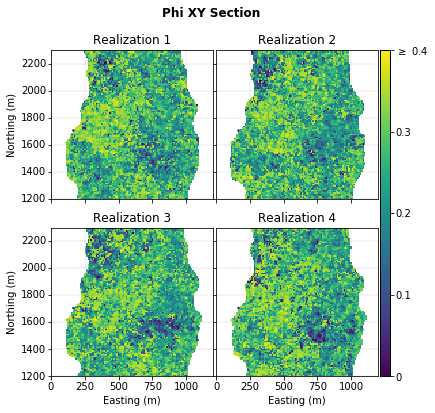

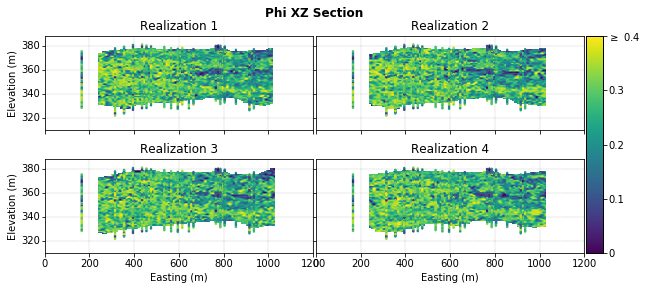

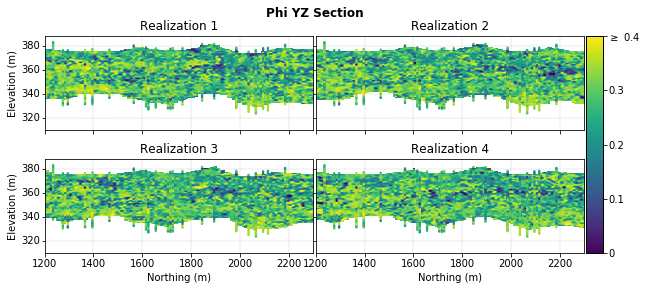

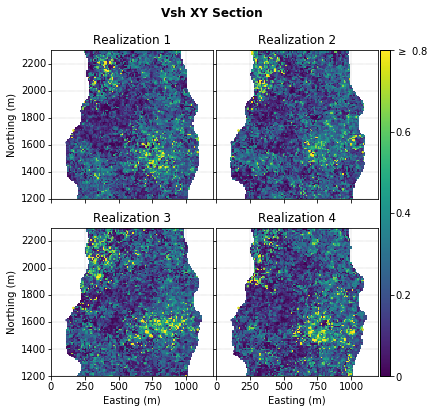

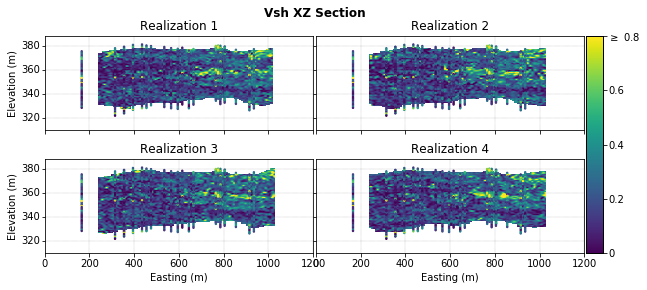

...

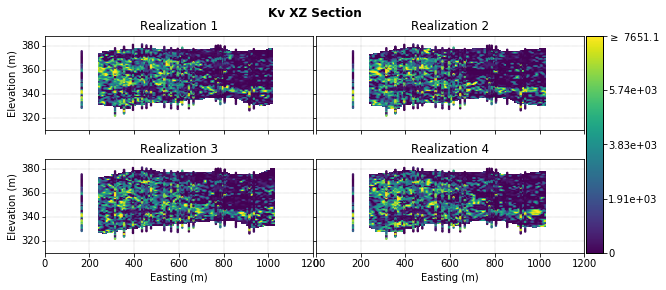

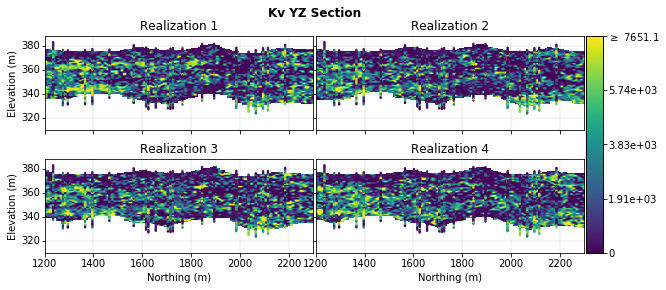

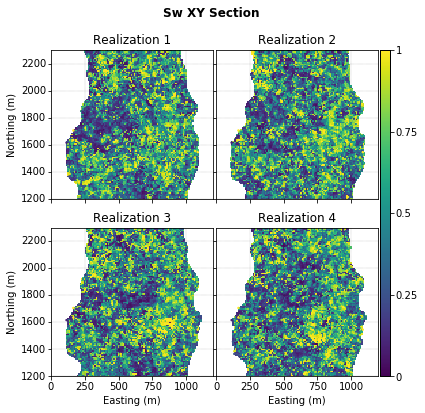

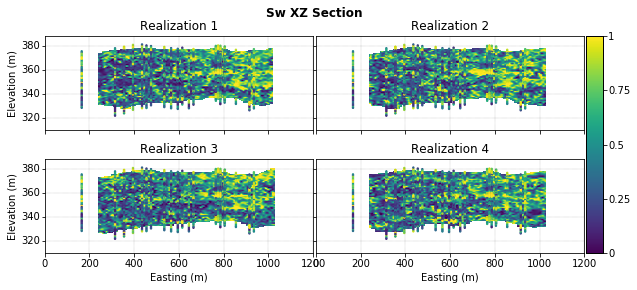

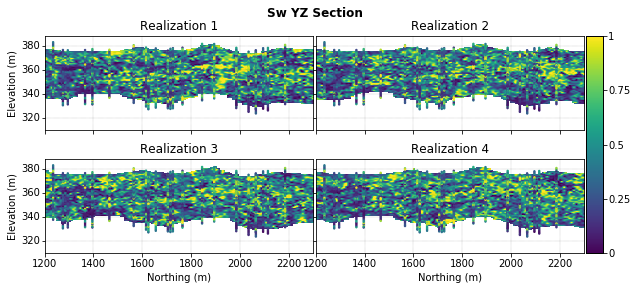

In [35]:
for var, ax in zip(variables, axes):
    for orient, sliceno in zip(['xy', 'xz', 'yz'], [sz, sy, sx]):
        aspect, figsize = aspects[orient], figsizes[orient]
        fig, axes = gs.subplots(2, 2, cbar_mode='single',  
                                figsize=figsize, aspect=aspect)
        for ireal, ax in zip(range(4), axes):
            simfl = finaldir+'real{}.gsb'.format(ireal+1)
            sim = gs.DataFile(simfl)
            gs.pixelplt(sim, var=var, pointdata=dat_all,
                        ax=ax, sliceno=sliceno, orient=orient,
                        title='Realization {}'.format(ireal+1),
                        vlim=vlims[var])
        fig.suptitle(var + ' ' + orient.upper()+' Section',
                     **{'weight': 'bold'})

## 6. Check Model Reproduction

Histogram, variogram and multivariate reproduction is now inspected. 

### Calculate declustering weights for all data
Before inspecting histogram reproduction, the reference data distribution must be prepared since the previously calculated distributions (and weights) were by category.

In [36]:
parstr = """                  Parameters for DECLUS
                  *********************

START OF PARAMETERS:
{datafl}                    -file with data
{xyzcols}   {varcol}        -  columns for X, Y, Z, and variable
-98     1.0e21              -  trimming limits
declus.sum                  -file for summary output
{declusfl}                  -file for output with data & weights
1.0   1.0                   -Y and Z cell anisotropy (Ysize=size*Yanis)
0                           -0=look for minimum declustered mean (1=max)
1  100  100                 -number of cell sizes, min size, max size
10                          -number of origin offsets
"""
pars = dict(datafl=dat_all.flname, xyzcols=dat_all.gscol(dat.xyz),
            varcol=dat_all.gscol(variables[0]),
            declusfl=declusdir+'all.out')
declus.run(parstr=parstr.format(**pars), liveoutput=True)
dat_all = gs.DataFile(declusdir+'all.out')
gs.rmfile('declus.sum')

Calling:  ['../exes/declus', 'temp']

DECLUS Version: 3.000

 data file = ../data/PRM_data.dat                    
 columns =            2           3           4           6
 tmin,tmax =       -98.000000    1.000000E+21
 summary file = declus.sum                              
 output file = Output/Declus/all.out                   
 anisotropy =         1.000000        1.000000
 minmax flag =            0
 ncell min max =            1      100.000000      100.000000
 offsets =           10


There are    11705 data with:
  mean value            =    353.58887
  minimum and maximum   =    315.60999   385.82999
  size of data vol in X =    970.03998
  size of data vol in Y =   1080.00000
  size of data vol in Z =     66.28000

  declustered mean      =    353.12793
  min and max weight    =      0.37851    12.49588
  equal weighting       =      1.00000


DECLUS Version: 3.000 Finished

Stop - Program terminated.


### Calculate CDFs of the realizations before plotting

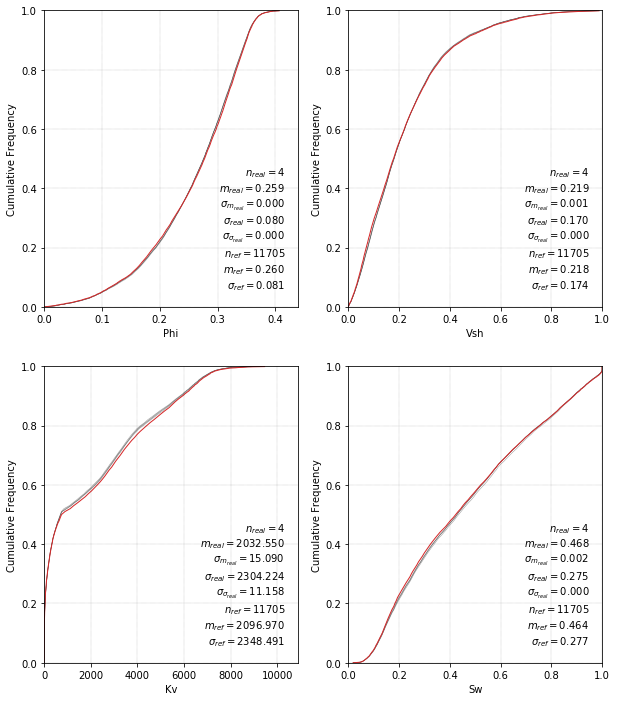

In [37]:
fig, axes = plt.subplots(2, 2, figsize=(10, 12))
axes = axes.flatten()
for i, (var, ax) in enumerate(zip(variables, axes)):
    gs.histpltsim(finaldir+'real*.gsb', dat_all, refvar=var,
                  refwt=True, refclr='C3',
                  simvar=sim.gscol(var, string=False), 
                  sim_fltype='gsb', xlabel=var, 
                  xlim=(0.0, dat_all[var].max()),
                  ax=ax,)

### Calculate variograms of the data in original units

In [38]:
vargs_all = []
for i, var in enumerate(variables):
    varg = gs.Variogram(dat_all, var=var, ndir=2, omnihz=True, 
                        variostd=True, mute=True)
    varg.inferdirections(azm=0.0, dip=0.0, tilt=0.0)
    varg.update_calcpars(nlags=(20, 10), lagdist=(10, 1.0), 
                         lagtol=(5, .5),
                         azmtol=90.0, diptol=10.0, 
                         bandhorz=(1.0e21, 10.0), bandvert=3.0 )
    varg.varcalc()
    vargs_all.append(varg)

### Calculate variograms of the realizations

In [39]:
start_time = time.time()
# Calculate the variograms of the realizations
for i, (var, varg) in enumerate(zip(variables, vargs_all)):
    varg.update_simpars(datafl=finaldir+'real*.gsb', 
                        varcols=sim.gscol(var),
                        nlags=20)
    varg.varsim() #using varsim to calculate variogram realizations
varsimtime = (time.time() - start_time)/60
print('execution took {} minutes'.format(varsimtime))

Pool assembled, asynchronously processing
Asynchronous execution finished.
Pool assembled, asynchronously processing
Asynchronous execution finished.
Pool assembled, asynchronously processing
Asynchronous execution finished.
Pool assembled, asynchronously processing
Asynchronous execution finished.
execution took 1.3217144091924031 minutes


### Plot the variograms

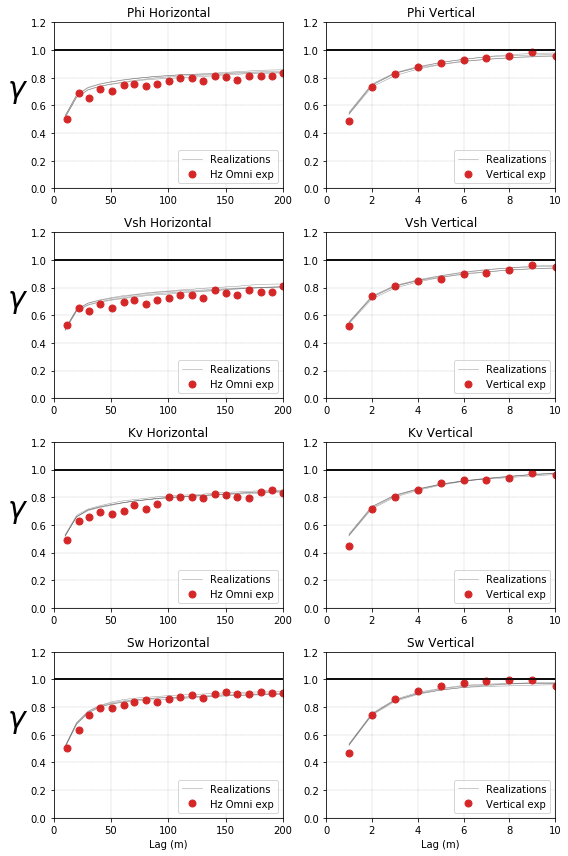

In [40]:
fig, axes = plt.subplots(nvar, 2, figsize=(8, 3*nvar))
for i, (var, varg, ax) in enumerate(zip(variables,
                                        vargs_all,
                                        axes)):
    varg.plot(sim=True, titles=(var+' Horizontal',
                                var+' Vertical'),
                                colors=['C3'],
                                axes=ax)
ax[0].set_xlabel('Lag (m)')
ax[1].set_xlabel('Lag (m)')
fig.tight_layout()

### Inspect multivariate reproduction
The align_orient option of scatplts_lu allows for alignment of the upper and lower plot axes.

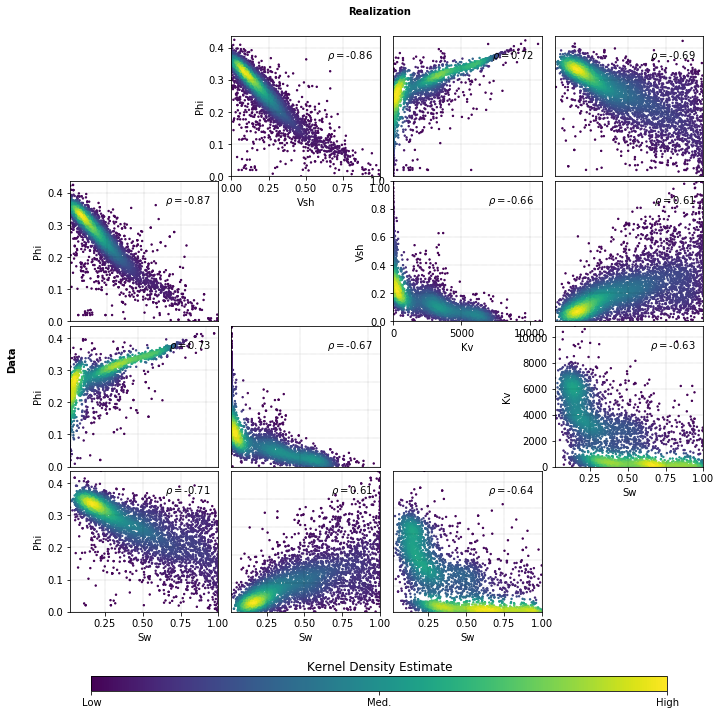

In [42]:
fig = gs.scatplts_lu(dat_all, sim, figsize=(10, 10),
                     nmax=5000, pad=(-5, -3), s=2,
                     titles=('Data', 'Realization'),
                     align_orient=True, stat_xy=(0.95, 0.95))

## 7. Cleaning Directories and Files

In [43]:
gs.gsParams.save('gsParams.txt')
gs.rmdir(outdir, verbose=True)
gs.rmfile('temp')

### Note the total execution time

In [44]:
time = (time.time() - start_workflow_time)/60
print('workflow execution took {} minutes'.format(time))

workflow execution took 69.21061100165049 minutes


# Post-processing

The following notebook is comprised of 7 primary steps:

1. Initialize required packages and parameters 
2. Infer horizontal permeability (Kh) based on Kh/Kv ratios
3. Block average the realizations of point scale variability, providing realizations at the scale that is relevant to engineering design and decision making (applied in subsequent steps)
4. Calculate local summaries of the realizations, such as the estimate (e-type) model, P10/P90, etc.
5. Calculate a map of the probability to be within the (economic) deposit
6. Calculate the global resource uncertainty
7. Clean the output files

## 1. Initialize required packages and parameters


In [47]:
import pygeostat as gs
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
% matplotlib inline

### Project settings

Load the Matplotlib and Pygeostat project defaults.

In [48]:
gs.gsPlotStyle.load('../00-Introduction/gsParams.txt')
gs.gsParams.load('../04-Multivariate/gsParams.txt')

Assign nreal, catdict and griddef settings to variables for convenience.

In [49]:
nreal = gs.gsParams['data.nreal']
print('nreal = {}'.format(nreal))
catdict = gs.gsParams['data.catdict']
print('catdict =', catdict)
griddef = gs.gsParams['data.griddef']
griddef

nreal = 4
catdict = {1: 'Sand', 2: 'Breccia', 3: 'SIHS', 4: 'MIHS', 5: 'Mud'}


Pygeostat GridDef:
120 5.0 10.0 
110 1205.0 10.0 
78 310.5 1.0

### Directories
Path to the executables, and the directory that will host temporary output files.

In [50]:
exedir = '../exes/'
modeldir = '../04-Multivariate/PointScaleRealizations/'
outdir = 'Output/'
gs.mkdir(outdir)

## 2. Kh based on Kh/Kv Ratios
As is often done in practice, horizontal permeability is inferred based on simulated vertical permetability using Kv-Kh ratios that vary by lithofacies.

### Define Kh/Kv ratio within each lithofacies
As an example, the Sand ratio below indicates that Kh is 5 times larger than its associated Kv.

In [51]:
ratios = {'Sand':5, 'Breccia':3, 'SIHS':2, 'MIHS':1, 'Mud':1} #dictionary - whenever you have sand its gonna be 5 times of Kv, breccia - 3 times of Kv

### Process all realizations to include Kh

Output realizations with Kh to a new directory.

In [52]:
pointdir = outdir+'PointScaleRealizations/'
gs.mkdir(pointdir)

Loop over each realization.

In [53]:
for real in gs.log_progress(range(nreal)):
    # Load the realization
    sim = gs.DataFile(modeldir+'real{}.gsb'.format(real+1))
    
    # Initialize the Kh column as null before adding as variable
    sim['Kh'] = np.nan
    sim.variables.append('Kh')
    
    # Identify records that match each category, before assigning
    # Kh to those records based on multiplying Kv with the approporiate
    # record
    for catcode, cat in catdict.items():
        idx = sim[sim.cat] == catcode #build a logical array simulating the categories
        sim.data.loc[idx, 'Kh'] = sim.data.loc[idx, 'Kv']*ratios[cat]
    sim.writefile(pointdir + 'real{}.gsb'.format(real+1),
                  fmt=[1]+[2]*sim.nvar, tvar='Kh')

VBox(children=(HTML(value=''), IntProgress(value=0, max=4)))

### Inspect some realizations

Define the slice number and figure parameters, consistent with previous notebooks. Note that these parameters could also be stored and loaded with a pickle.

In [54]:
sx = int(griddef.nx / 2.0)
sz = int(griddef.nz / 2.0)
aspects = {'xy':True, 'yz':False}
figsizes = {'xy':(10, 6), 'yz':(10,4)}

Import the color limits that were defined in the last notebook, before adding a Kh entry.

In [55]:
import pickle #we dumped it in the previous notebook using pickle and are using it now pickle.dump and pickle.load
with open('../04-Multivariate/vlims.pkl', 'rb') as f:
    vlims = pickle.load(f)
vlims['Kh'] = (0, vlims['Kv'][1]*5)

Compare the Kh and Kv sections.

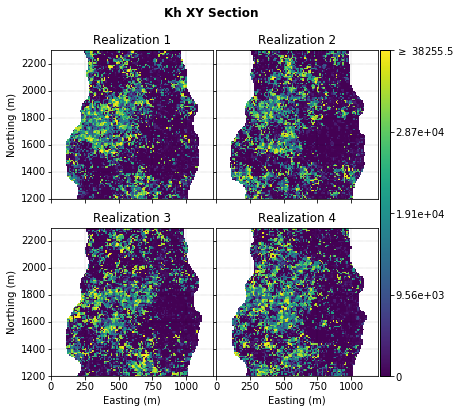

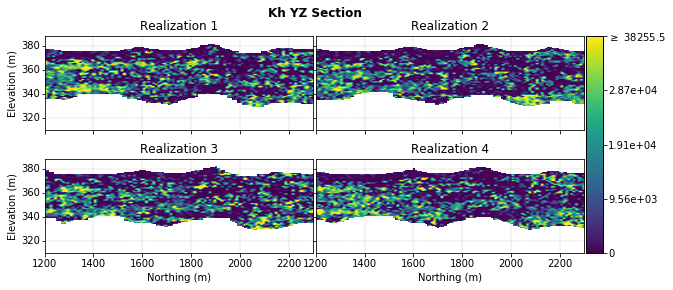

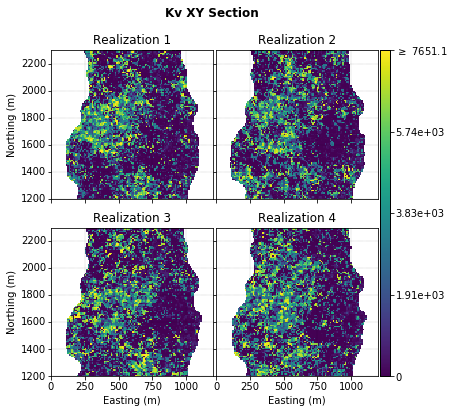

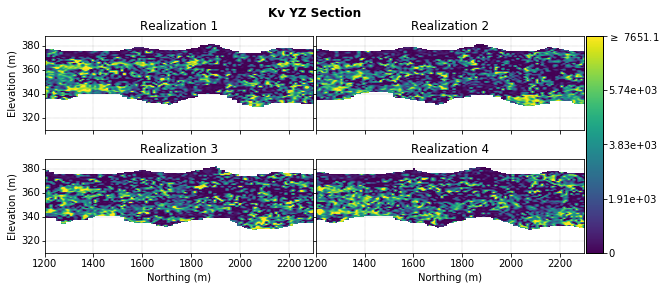

In [56]:
for var in ['Kh', 'Kv']:
    for orient, sliceno in zip(['xy', 'yz'], [sz, sx]):
        aspect, figsize = aspects[orient], figsizes[orient]
        fig, axes = gs.subplots(2, 2, cbar_mode='single',  
                                figsize=figsize, aspect=aspect)
        for ireal, ax in zip(range(4), axes):
            simfl = pointdir+'real{}.gsb'.format(ireal+1)
            sim = gs.DataFile(simfl)
            gs.pixelplt(sim, var=var, vlim=vlims[var],
                        ax=ax, sliceno=sliceno, orient=orient,
                        title='Realization {}'.format(ireal+1))
        fig.suptitle(var + ' ' + orient.upper() + ' Section',
                     **{'weight': 'bold'})

## 3. Block Average the Realizations of Point Scale Variability
The constructed realizations provide a realistic characterization of variability at the scale of the data. These realizations must be converted to a scale that is relevant for engineering decision making, which is accomplished by the averaging of points within blocks of that scale.

### Generate the block grid definition
Utilize the `GridDef.changeblocknum()` function to create the block grid definition. Note that this is a relatively coarse grid definition, due to the underlying coarse point grid (unrealistic in practice, but necessary due to time constraints of this course).

In [57]:
# Number of points that will be averaged in each direction
scale_x, scale_y, scale_z = 5, 5, 2

# Initialize the block grid definition
griddef_block = griddef.changeblocknum(nnx=int(griddef.nx/scale_x), #use this function to get to new gridblock definition
                                       nny=int(griddef.ny/scale_y),
                                       nnz=int(griddef.nz/scale_z),
                                       return_copy=True)
griddef_block

Pygeostat GridDef:
24 25.0 50.0 
22 1225.0 50.0 
39 311.0 2.0

### Specify the averaging methods
Begin by creating a dictionary of the ublkavg (program used below) codes. In practice, flow simulation or proxy models would often be used for upscaling permeability. In this case, simply use (potentially oversimplistic) geometric and harmonic averaging.

In [58]:
avg_methods = {'Arithmetic': 0, 'Geometric': 1, 
               'Harmonic': 2, 'Majority Rules': 3}

Specify the averaging method code for each variable.

In [59]:
avg_methods = {'Phi': avg_methods['Arithmetic'],
               'Vsh': avg_methods['Arithmetic'],
               'Sw': avg_methods['Arithmetic'],
               'Kv': avg_methods['Harmonic'],
               'Kh': avg_methods['Geometric'],
               'Categories': avg_methods['Majority Rules']}
avg_methods

{'Categories': 3, 'Kh': 1, 'Kv': 2, 'Phi': 0, 'Sw': 0, 'Vsh': 0}

Convert to a string, which follows the order that the variables follow in the point scale realizations file.

In [60]:
# Create a list of the method codes in the order that
# the associated variables appear in the point scale
# realizations file (specified by sim.columns)
avg_methods = [avg_methods[col] for col in sim.columns]

# Convert the list to a string that is seperated by ' '
avg_methods = ' '.join([str(i) for i in avg_methods])
avg_methods

'3 0 0 2 0 1'

### Specify the weighting
This section is required, because water saturation is weighted by the associated porosity in the averaging calculation. Observe that the output has a 2 for the Sw column, indicating that it is weighted by the 2nd column of the input file (Phi).

In [61]:
wtcols = ''
for col in [sim.cat] + sim.variables:
    if col == 'Sw':
        wtcols += sim.gscol('Phi')
    else:
        wtcols += '0'
    wtcols += ' '
print('weight columns =', wtcols)

weight columns = 0 0 0 0 2 0 


### Initialize and execute ublkavg

In [62]:
blockdir = outdir+'BlockScaleRealizations/'
gs.mkdir(blockdir)

In [63]:
ublkavg = gs.Program(program=exedir+'ublkavg')

C:\Users\serge\CCG\PRM_course_May2018\CCG_PRM_Course\03-ModelWorkflow\05-PostProcessing\tmp4qvtvw1k\ublkavg.par has been copied to the clipboard


In [64]:
parstr = """       Parameters for UBLKAVG
       **********************

START OF PARAMETERS
{datafl}                - file with input grid (see Note1)
{nvar}                   - number of variables to average
{varcols}                - columns for variables to average
{wtcols}                 - columns for weights (0 = none)
-998.0    1.0e21         - trimming limits
{gridstr}
{gridstr_block}
1                        - number of realizations
0.05                     - minimum required volume fraction (see Note2)
{avg_methods}            - averaging method (see Note3)
{outfl}                  - file for output grid (see Note1)
0                        - append volume fraction columns?

Note1:
Input/outfiles can be GSLIB (ASCII) or GSB (binary) formatted, although
their format must match. GSLIB is assumed unless a .gsb extension is detected.

Note2:
The program outputs a null value for the upsclaed block if the cumulative 
volume of smaller blocks that are used in its average do not meet the 
specified fraction of the its total volume. Reasons that the fraction would
be less than 1 include unaligned grids, and null values in the small grid.

Note3:
For each variable, supply one of the following averaging methods:
0 = arithmetic mean
1 = geometric mean
2 = harmonic mean
3 = majority rules (for categorical variables)
"""
pars = dict(nvar=sim.nvar+1, 
            varcols=sim.gscol([sim.cat] + sim.variables),
            wtcols=wtcols, gridstr=griddef, 
            gridstr_block=griddef_block,
            avg_methods=avg_methods)
callpars = []
for real in range(nreal):
    pars['datafl'] = pointdir+'real{}.gsb'.format(real+1)
    pars['outfl'] = blockdir+'real{}.gsb'.format(real+1)
    callpars.append({'parstr': parstr.format(**pars)})
gs.runparallel(ublkavg, callpars, reportprogress=True)

Creating parallel processes


VBox(children=(HTML(value=''), IntProgress(value=0, max=4)))

Pool assembled, asynchronously processing
Asynchronous execution finished.


### Change the default grid definition
The block grid definition is assigned as the default going forward so that it is automatically used.

In [65]:
gs.gsParams['data.griddef'] = griddef_block

### Inspect the realizations
Check the summary statistics of the first realization. The `sim` variable is used going forward for parameters relating to the block scale realizations.

In [66]:
sim = gs.DataFile(blockdir+'real1.gsb')
sim.describe(sim.columns)

,Categories,Phi,Vsh,Kv,Sw,Kh
count,10516.000000,10516.000000,10516.000000,10516.000000,10516.000000,10516.000000
mean,2.456352,0.258754,0.220972,255.351235,0.428517,3323.661044
std,1.480029,0.047004,0.104145,680.435520,0.145604,5105.237331
min,1.000000,0.037520,0.022612,0.000100,0.090057,0.000100
25%,1.000000,0.233715,0.146516,0.001000,0.319238,123.737286
50%,3.000000,0.266266,0.199239,23.107862,0.415849,916.657379
75%,4.000000,0.292347,0.269244,173.353157,0.523514,4198.164307
max,5.000000,0.369281,0.758099,7502.888672,0.981017,37590.300781


Reset the vlims to the upscaled extents.

In [67]:
for var in vlims:
    vlims[var] = (0, np.round(sim[var].quantile(0.99),
                              decimals=2))

In advance of plotting sections, adjust the slice number since the number of nodes in each direction is reduced.

In [68]:
sx = int(griddef_block.nx/2)
sz = int(griddef_block.nz/2)

Plot the sections.

VBox(children=(HTML(value=''), IntProgress(value=0, max=5)))

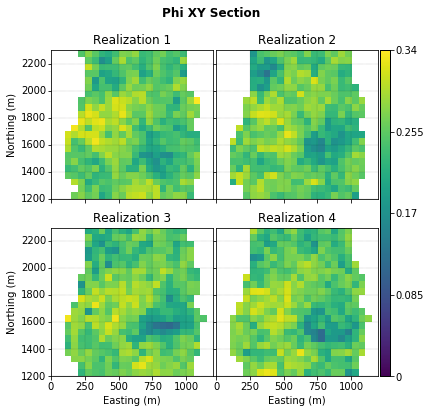

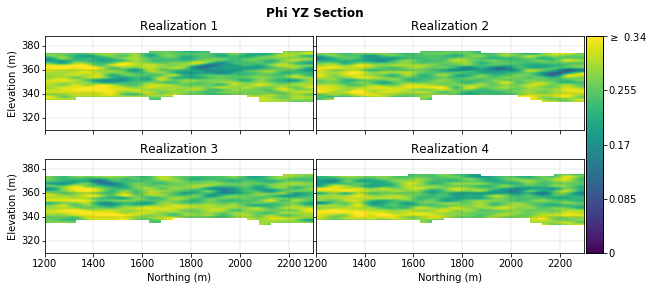

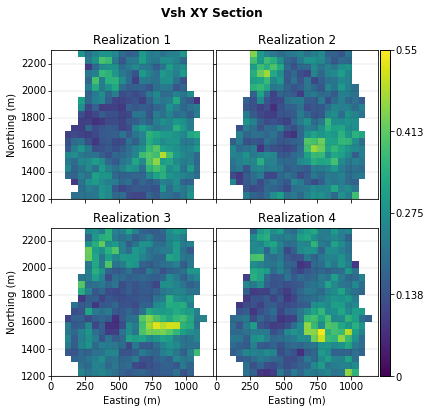

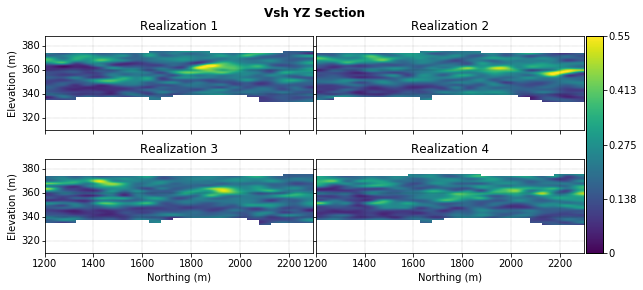

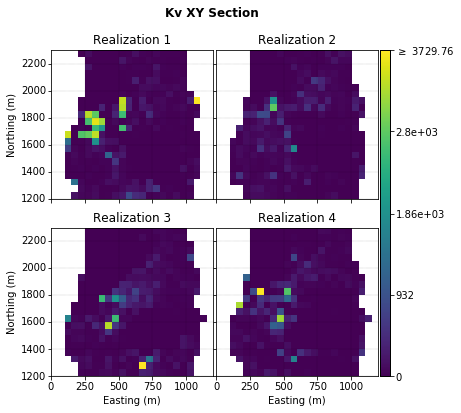

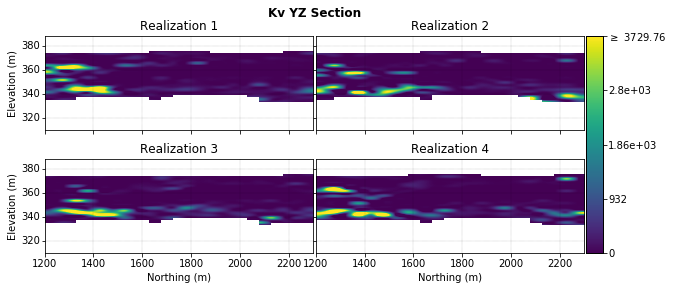

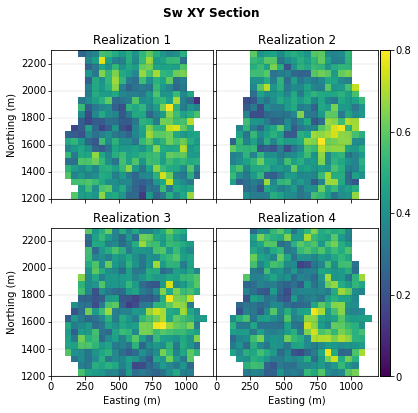

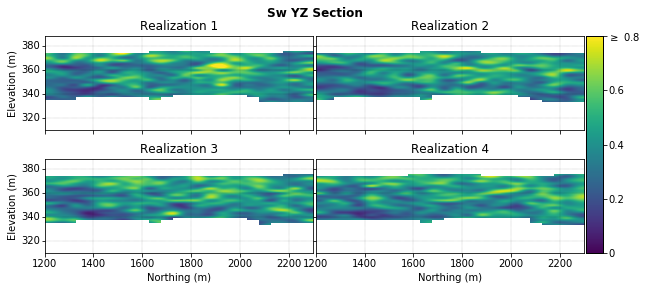

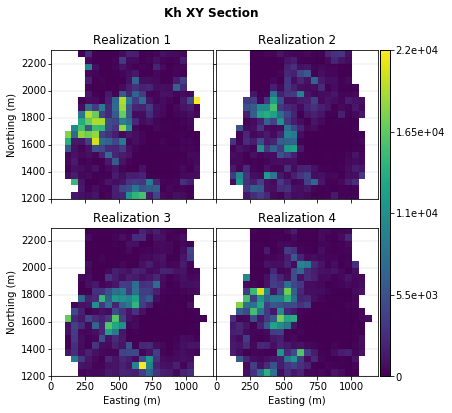

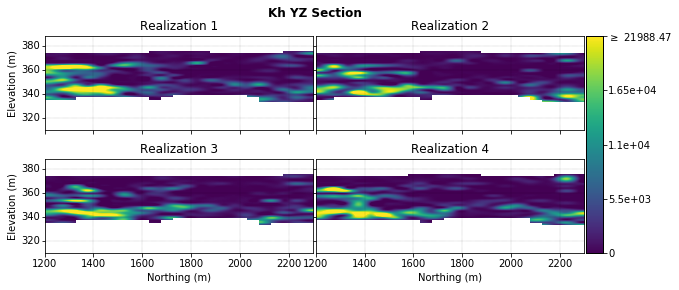

In [69]:
for var in gs.log_progress(sim.variables):
    for orient, sliceno in zip(['xy', 'yz'], [sz, sx]):
        aspect, figsize = aspects[orient], figsizes[orient]
        fig, axes = gs.subplots(2, 2, cbar_mode='single',  
                                figsize=figsize, aspect=aspect)
        for ireal, ax in zip(range(4), axes):
            simfl = blockdir+'real{}.gsb'.format(ireal+1)
            tsim = gs.DataFile(simfl)
            gs.pixelplt(tsim, var=var, ax=ax, sliceno=sliceno, 
                        orient=orient, vlim=vlims[var],
                        title='Realization {}'.format(ireal+1))
        fig.suptitle(var + ' ' + orient.upper() + ' Section',
                     **{'weight': 'bold'})

### Compare histograms before and after upscaling

Porosity and water saturation are the variables (in addition to reservoir geometry) that impact the resource calculation that follows. The distributions of these varibales are compared before and after upscaling for one realization.

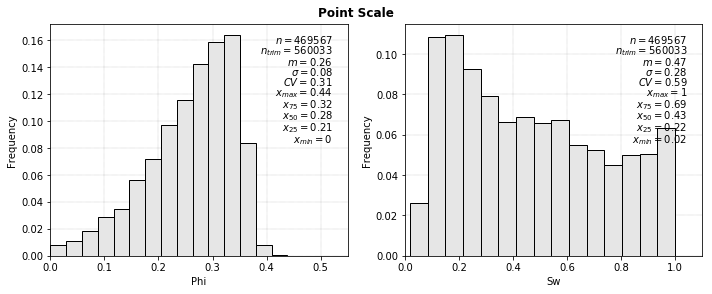

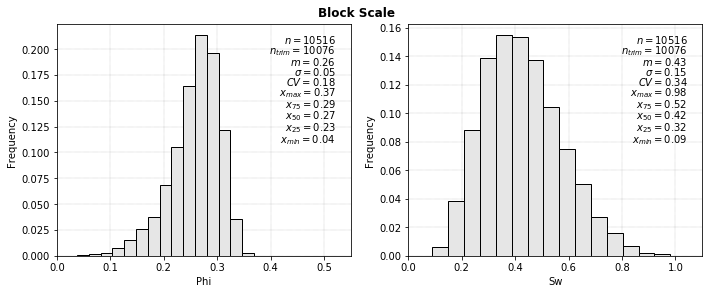

In [70]:
# Define a function that is used for plotting each scale
def hists(simfl, title):
    # Set constant xlimits for each variable
    xlims = {'Phi': (0, 0.55), 'Sw': (0, 1.1)}
    # Plot histograms of both variables
    fig, axes = plt.subplots(1 , 2, figsize=(10, 4))
    for var, ax in zip(['Phi', 'Sw'], axes):
        sim = gs.DataFile(simfl)
        gs.histplt(sim, var=var, ax=ax, xlim=xlims[var])
    fig.suptitle(title, y=1.01, **{'weight': 'bold'})
    fig.tight_layout()

# Call the function with each scale
hists(pointdir+'real1.gsb', 'Point Scale')
hists(blockdir+'real1.gsb', 'Block Scale')

## 4. Local Summaries of Uncertainty
Summaries of the realizations are very useful in practice. The expected value of the realizations (e-type) provides an estimate model that is often necessary some engineering design and operations with current industry technology (e.g., mine planning). 

Summaries of uncertainty (e.g., standard deviation of the realizations, P10/P90, probability to be +/-15% of the e-type, etc.) are similarly useful communicating uncertainty and potentially integrating the associated risk into engineering design. That said, these local summaries of uncertainty should not be confused with joint uncertainty, such as the resource calculation in the next section.

### Combine all realizations into one file
This is required pre-processing for execution of `upostsim` in the next section.

In [71]:
merge_reals_gsb = gs.Program(program=exedir+'merge_reals_gsb')

C:\Users\serge\CCG\PRM_course_May2018\CCG_PRM_Course\03-ModelWorkflow\05-PostProcessing\tmpuw5po8i2\merge_reals_gsb.par has been copied to the clipboard


In [72]:
parstr = """                  Parameters for MERGE_REALS_GSB    #sticking all the realizations together and putting them into one file
                  *******************************

START OF MAIN:
{datafl}                        - (str) base file name including sub directory if needed
{nvar}                          - (int) number of variables
{varcols}                       - (int) column number for value(s)
1                               - (int) starting realization
{nreal}                         - (int) Last realization to read
{outfl}                         - (str) output file name
1                               - (int) output variable to trim
-8.0  1.0e21                    - (float, float) tmin and tmax for trimming
"""
blockfl = blockdir+'allreals.gsb'
pars = dict(datafl=blockdir+'real', outfl=blockfl,
            nvar=sim.nvar+1, 
            varcols=sim.gscol([sim.cat] + sim.variables),
            nreal=nreal)
merge_reals_gsb.run(parstr=parstr.format(**pars))

Calling:  ['../exes/merge_reals_gsb', 'temp']

 MERGE_REALS_GSB VERSION: 1.0.0


Found keyword START OF MAIN

 Reading MAIN Parameters

  base file name = Output/BlockScaleRealizations/real
  number of variables =            6
 column numbers =  1 2 3 4 5 6
  starting realization =            1
  last realization to read =            4
  base file name = Output/BlockScaleRealizations/allreals.gsb
 output variable use for trimming =            1
  trimming limits =   -8.000000      1.0000000E+21
 Starting the Merging Process
reading in data from Output/BlockScaleRealizations/real1.gsb
reading in data from Output/BlockScaleRealizations/real2.gsb
reading in data from Output/BlockScaleRealizations/real3.gsb
reading in data from Output/BlockScaleRealizations/real4.gsb


### Calculate the local summaries of uncertainty
This program provides virtually any desired summary of local uncertainty. Note that the P10 and P90 statistics are ill defined based on only 20 realizations (more so than the e-type and standard deviation).

In [73]:
upostsim = gs.Program(program=exedir+'upostsim')

C:\Users\serge\CCG\PRM_course_May2018\CCG_PRM_Course\03-ModelWorkflow\05-PostProcessing\tmp2xf_c9q2\upostsim.par has been copied to the clipboard


In [74]:
parstr = """               Parameters for UPOSTSIM
               ***********************
 
START OF PARAMETERS: 
{datafl}            -input file name with the simulated variable
{varcol}            -  column for the variable
-998.0   1.0e21     -  trimming limits
{nreal}             -nreal (grid size taken from GSB header)
3                   -number of output options
1 2 3               -  output option codes (see below)
1                   -    if 1, variance (0) or standard deviation (1)
1 15                -    if 2, num. of percentages and values (1 to 49)
2 10 90             -    if 3, num. of percentiles and values (1 to 99)    
2 1.0 1.5           -    if 4, num. of cutoffs and values
3 0.25 0.5 0.75     -    if 5, num. of tolerances and values   
{outfl}             -output file name

option 1   = E-type mean and conditional variance
       2   = prob to be within X% of the mean
       3   = percentiles 
       4   = prob to be above cutoff 
       5   = prob to be within absolute tolerance of the mean 
       6   = number of simulated values per grid node 

NOTE: Must use GSB file formats for input and output for now.
"""
pars = dict(datafl=blockfl, nreal=nreal)
callpars = []
for var in sim.variables:
    pars['varcol'] = sim.gscol(var)
    pars['outfl'] = blockdir+'postsim_{}.gsb'.format(var)
    callpars.append({'parstr': parstr.format(**pars)}) 
gs.runparallel(upostsim, callpars, reportprogress=True)

Creating parallel processes


VBox(children=(HTML(value=''), IntProgress(value=0, max=5)))

Pool assembled, asynchronously processing
Asynchronous execution finished.


### Check the summaries for one variable

In [75]:
simstat = gs.DataFile(blockdir+'postsim_{}.gsb'.format(var))
simstat.describe()

,E-type,Cond.Stdev.,Prob.ToBeWithin15%OfTheMean,ValueOfThe10thPercentile,ValueOfThe90thPercentile
count,10991.000000,10991.000000,0.0,0.0,0.0
mean,3274.959228,1805.780246,NaN,NaN,NaN
std,4230.629465,2200.376336,NaN,NaN,NaN
min,0.000100,0.000000,NaN,NaN,NaN
25%,250.420013,136.162140,NaN,NaN,NaN
50%,1288.230225,761.953186,NaN,NaN,NaN
75%,5111.109619,2936.249023,NaN,NaN,NaN
max,37590.300781,13584.871094,NaN,NaN,NaN


### Plot sections of the summaries

VBox(children=(HTML(value=''), IntProgress(value=0, max=5)))

C:\Anaconda3\lib\site-packages\pygeostat\plotting\utils.py:178: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(np.array(data))
C:\Anaconda3\lib\site-packages\pygeostat\plotting\utils.py:179: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(np.array(data))
C:\Anaconda3\lib\site-packages\matplotlib\colorbar.py:629: RuntimeWarning: invalid value encountered in less_equal
  b = b[(b <= intv[1] + eps) & (b >= intv[0] - eps)]
C:\Anaconda3\lib\site-packages\matplotlib\colorbar.py:629: RuntimeWarning: invalid value encountered in greater_equal
  b = b[(b <= intv[1] + eps) & (b >= intv[0] - eps)]


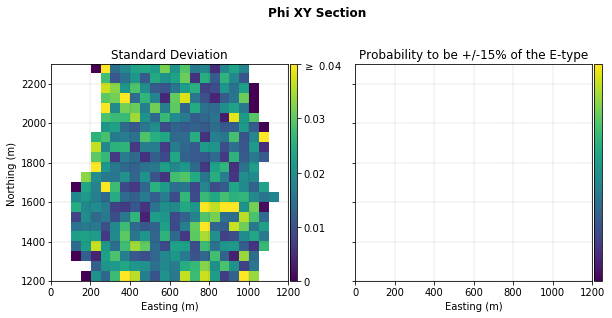

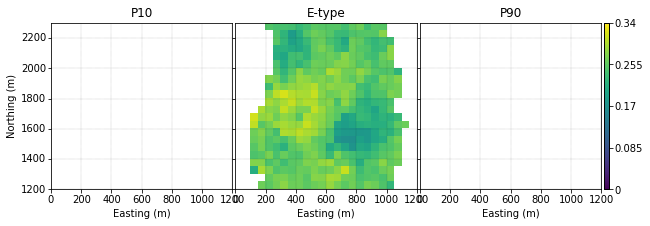

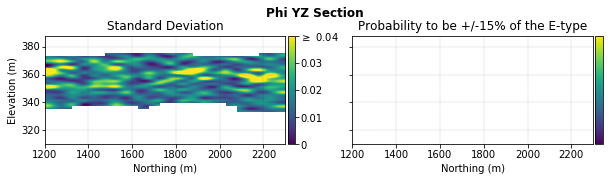

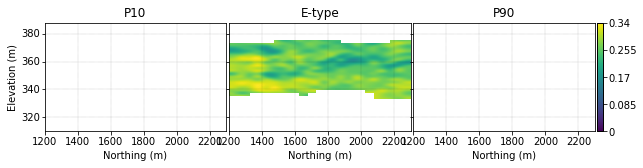

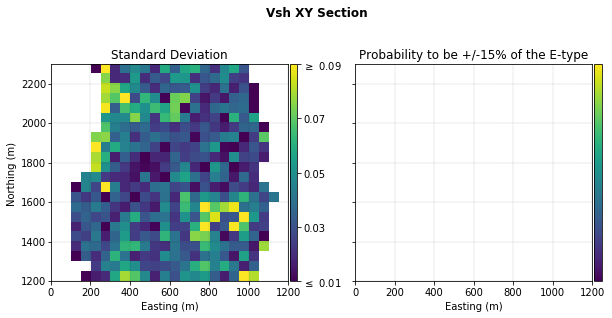

...

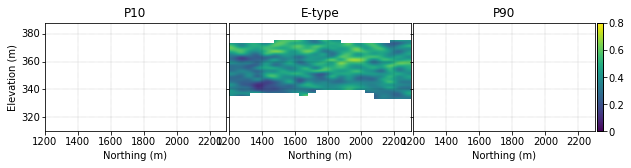

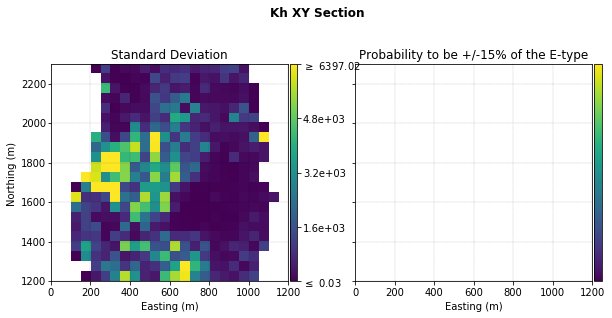

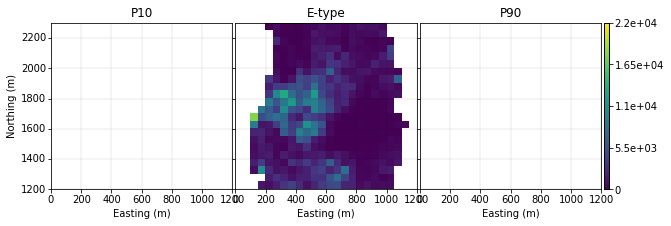

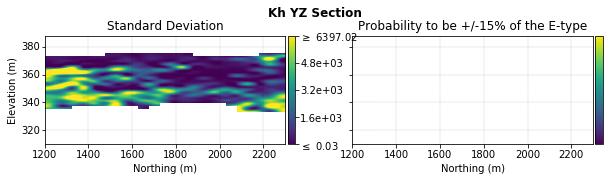

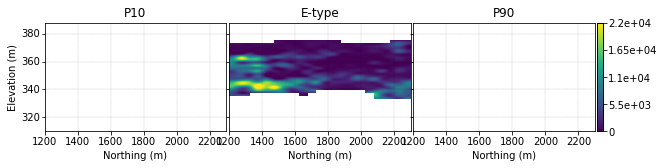

In [76]:
figsizes = {'xy':(10, 4), 'yz':(10, 2)}
for var in gs.log_progress(sim.variables):
    # Load the summaries for this variable
    simstat = gs.DataFile(blockdir+'Postsim_{}.gsb'.format(var))
    
    # Provide some better names for plotting
    simstat.rename({'Cond.Stdev.': 'Standard Deviation',
                    'Prob.ToBeWithin15%OfTheMean':
                    'Probability to be +/-15% of the E-type',
                    'ValueOfThe10thPercentile': 'P10',
                    'ValueOfThe90thPercentile': 'P90'})
    for orient, sliceno in zip(['xy', 'yz'], [sz, sx]):
        aspect, figsize = aspects[orient], figsizes[orient]
        
        # E-type and conditional standard deviation
        fig, axes = gs.subplots(1, 2, figsize=figsize, axes_pad=.8,
                                cbar_mode='each', aspect=aspect)
        for stat, ax in zip(['Standard Deviation', 
                             'Probability to be +/-15% of the E-type'], 
                            axes):
            vlim = (np.round(simstat[stat].quantile(.05), decimals=2),
                    np.round(simstat[stat].quantile(.95), decimals=2))
            gs.pixelplt(simstat, var=stat, vlim=vlim,
                        ax=ax, sliceno=sliceno, 
                        orient=orient, title=stat)
        fig.suptitle(var+' '+orient.upper()+' Section', x=0.5, y=1.08,
                     **{'weight': 'bold'})
        
        # P10 and P90
        fig, axes = gs.subplots(1, 3, figsize=figsize, 
                                cbar_mode='single', aspect=aspect)
        for stat, ax in zip(['P10', 'E-type', 'P90'], axes):
            gs.pixelplt(simstat, var=stat, vlim=vlims[var],
                        ax=ax, sliceno=sliceno, 
                        orient=orient, title=stat)

## 5. Generate a Map of Probability to be with the Deposit

The economic deposit is simplified here, to block columns that have a vertical average of $\phi > 0.5$ and $S_w < 0.5$ within the deposit.

### Generate the map grid definition and output directory
This grid definition consists of a single vertical block.

In [31]:
griddef_map = griddef_block.changeblocknum(nnx=griddef_block.nx,  #define another grid definition
                                           nny=griddef_block.ny,
                                           nnz=1,
                                           return_copy=True)
griddef_map

Pygeostat GridDef:
24 25.0 50.0 
22 1225.0 50.0 
1 349.0 78.0

In [32]:
mapdir = outdir+'MapRealizations/'
gs.mkdir(mapdir)

### Vertically average the $\phi$ and $S_w$ properties
Use the ublkavg program that was previously initialized above.

In [33]:
parstr = """       Parameters for UBLKAVG
       **********************

START OF PARAMETERS
{datafl}                 - file with input grid (see Note1)
2                        - number of variables to average
{varcols}                - columns for variables to average
{wtcols}                 - columns for weights (0 = none)
-998.0    1.0e21         - trimming limits
{gridstr_block}
{gridstr_map}
1                        - number of realizations
0.05                     - minimum required volume fraction (see Note2)
0 0                      - averaging method (see Note3)
{outfl}                  - file for output grid (see Note1)
0                        - append volume fraction columns?

Note1:
Input/outfiles can be GSLIB (ASCII) or GSB (binary) formatted, although
their format must match. GSLIB is assumed unless a .gsb extension is detected.

Note2:
The program outputs a null value for the upsclaed block if the cumulative 
volume of smaller blocks that are used in its average do not meet the 
specified fraction of the its total volume. Reasons that the fraction would
be less than 1 include unaligned grids, and null values in the small grid.

Note3:
For each variable, supply one of the following averaging methods:
0 = arithmetic mean
1 = geometric mean
2 = harmonic mean
3 = majority rules (for categorical variables)
"""
pars = dict(varcols=sim.gscol(['Phi', 'Sw']),
            wtcols='0 ' + sim.gscol('Phi'),
            gridstr_block=griddef_block,
            gridstr_map=griddef_map)
callpars = []
for real in range(nreal):
    pars['datafl'] = blockdir+'real{}.gsb'.format(real+1)
    pars['outfl'] = mapdir+'real{}.gsb'.format(real+1)
    callpars.append(dict(parstr=parstr.format(**pars)))
gs.runparallel(ublkavg, callpars, reportprogress=True)

Creating parallel processes


VBox(children=(HTML(value=''), IntProgress(value=0, max=4)))

Pool assembled, asynchronously processing
Asynchronous execution finished.


### Change the default grid definition and inspect one realization

In [34]:
gs.gsParams['data.griddef'] = griddef_map
sim = gs.DataFile(mapdir + 'real1.gsb')
sim.describe()

,Phi,Sw
count,389.000000,389.000000
mean,0.258893,0.410829
std,0.017741,0.050126
min,0.208689,0.303230
25%,0.246548,0.374028
50%,0.261221,0.404492
75%,0.272768,0.444472
max,0.296596,0.553959


### Calculate the probability map

When a block has $\phi > 0.15$ and $S_w < 0.5$ for a realization, 1 is added to the `prob` array below. The `prob` array is then divided by `nreal` providing an array that provides the probability to be within the deposit.

In [39]:
prob = np.zeros(griddef_map.count())
for real in range(nreal):
    sim = gs.DataFile(mapdir + 'real{}.gsb'.format(real+1))
    idx = ((sim['Phi'] > 0.15) & (sim['Sw'] < 0.5)) # simultaniously = &
    prob += idx.astype(int) #true is converted to 1 and false is converted to 0
prob = prob / nreal
prob = gs.DataFile(data=pd.DataFrame(prob, columns=['Deposit Probability']))

In [46]:
# pd.DataFrame(prob, columns=['Deposit Probability'])

AssertionError: `DataFile` can be indexed by `str` or `list` of columns

### Plot the probablity map

In [41]:
gs.pixelplt(prob)

KeyError: 0

## 6. Global Resource Uncertainty
Unlike local uncertainty summaries in the previous sections, calculating the global resource uncertainty requires consideration of the joint block values in each realization (joint uncertainty).

### Calculate resource uncertainty

The original-oil-in-place ($OOIP$) is calculated for each realization as:

$OOIP = \Sigma_{i=1}^N(1 - S_w(\mathbf{u}_i)) \cdot \phi(\mathbf{u}_i) \cdot V$ 

where $S_w$ is water saturation, $\phi$ is porosity, and $V$ is the block volume.

In [ ]:
ooips = []
for real in range(nreal):
    sim = gs.DataFile(blockdir + 'real{}.gsb'.format(real+1))
    ooip = (1 - sim['Sw']) * sim['Phi'] * griddef_block.blockvolume()
    ooips.append(ooip.sum())

### Plot the resource uncertainty as a CDF
An xlabel must be provided since ooips is a list, not a DataFile or DataFrame with names attached.

In [ ]:
gs.histplt(ooips, title='Resource Distribution', xlabel='OOIP (m^3)', 
           icdf=True)

## 7. Cleaning Directories and Files

In [ ]:
gs.rmdir(outdir)
gs.rmfile('temp')